In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict
from idtxl.bivariate_pid import BivariatePID
from idtxl.data import Data

In [2]:
def shuffle(x):
    x1 = x.copy()
    np.random.shuffle(x1)
    return x1

def bin_data_1D(data, nBins):
    boundaries = np.quantile(data, np.linspace(0, 1, nBins + 1))
    boundaries[-1] += 1.0E-10
    return np.digitize(data, boundaries, right=False) - 1

def pid_bin(x,y,z, nBins=4):
    dataEff = np.array([
        bin_data_1D(x, nBins),
        bin_data_1D(y, nBins),
        bin_data_1D(z, nBins)
    ])
    return pid(dataEff)
    
def pid(dataPS):
    settings = {'pid_estimator': 'TartuPID', 'lags_pid': [0, 0]}

    dataIDTxl = Data(dataPS, dim_order='ps', normalise=False)
    pid = BivariatePID()
    rez = pid.analyse_single_target(settings=settings, data=dataIDTxl, target=1, sources=[0,2])
    return rez.get_single_target(1)

def make_test(datagen_func, nBins=4, nTest=100):
    rezDict = {}
    rezDict['True'] = {'unq_s1': [], 'unq_s2': [], 'syn_s1_s2': [], 'shd_s1_s2': []}
    rezDict['Sh'] = {k: [] for k in rezDict['True'].keys()}

    for iTest in range(nTest):
        x,y,z = datagen_func()

        for kind in ['True', 'Sh']:
            yEff = y if kind == 'True' else shuffle(y)

            if nBins is None:
                rez = pid(np.array([x,yEff,z]))
            else:
                rez = pid_bin(x,yEff,z, nBins=nBins)

            for k in rezDict[kind].keys():
                rezDict[kind][k] += [rez[k]]

    rezDF = pd.DataFrame()
    for kind in ['True', 'Sh']:
        for k,v in rezDict[kind].items():
            rezTmp = pd.DataFrame({'kind': [kind]*nTest, 'Method':[k]*nTest, 'Value': v})
            rezDF = rezDF.append(rezTmp)
    
    return rezDF

def plot_test(df, suptitle=None, logEff=False):
    fig, ax = plt.subplots(ncols=3, figsize=(12,4))
    if suptitle is not None:
        fig.suptitle(suptitle)
    
    ax[0].set_title('Metric Value')
    ax[1].set_title('Effect Size')
    ax[2].set_title('Fraction Significant')
    
    sns.violinplot(ax=ax[0], x="Method", y="Value", hue="kind", data=df, scale='width')
    
    # Calculate effect sizes
    dfEffSize = pd.DataFrame()
    for method in sorted(set(df['Method'])):
        dfMethod = df[df['Method'] == method]
        dfMethodTrue = dfMethod[dfMethod['kind'] == 'True']
        dfMethodRand = dfMethod[dfMethod['kind'] == 'Sh']
        
        muRand = np.mean(dfMethodRand['Value'])
        stdRand = np.std(dfMethodRand['Value'])
        
        dfMethodEff = dfMethodTrue.copy()
        dfMethodEff['Value'] = (dfMethodEff['Value'] - muRand) / stdRand
        
        dfEffSize = dfEffSize.append(dfMethodEff)
        
    sns.violinplot(ax=ax[1], x="Method", y="Value", data=dfEffSize, scale='width')
    if logEff:
        ax[1].set_yscale('log')
    #ax[1].axhline(y='2', color='pink', linestyle='--')
    
    # Calculate fraction significant
    sigDict = {}
    for method in sorted(set(df['Method'])):
        dfEffMethod = dfEffSize[dfEffSize['Method'] == method]
        sigDict[method] = [np.mean(dfEffMethod['Value'] > 2)]
    
    sns.barplot(ax=ax[2], data=pd.DataFrame(sigDict))
    ax[2].set_ylim([0,1])

## Noisy Redundant Scenario

We want to check if white noise added to a purely redundant scenario results in correct identification of redundancy

$$X = T + \nu_X$$
$$Y = T + \nu_Y$$
$$Z = T + \nu_Z$$

where $Y$ is the target of $X$ and $Z$, and

$$T \sim \mathcal{N}(0, 1)$$
$$\nu_X, \nu_Y, \nu_Z \sim \mathcal{N}(0, \sigma)$$

and $\sigma$ is a free parameter, denoting the Noise-To-Signal ratio. So the signal should be a mixture of redundant signal and white noise.

Since the signal is continuous, we bin it using different bin counts.

In [28]:
def gen_data_red_noisy(n=1000, sigErrX=1, sigErrY=1, sigErrZ=1):
    t = np.random.normal(0,1,n)
    x = t + np.random.normal(0,sigErrX,n)
    y = t + np.random.normal(0,sigErrY,n)
    z = t + np.random.normal(0,sigErrZ,n)
    return x,y,z

### Testing binning-dependence

In [27]:
rezDFDict = {}
for nBins in range(2, 6):
    gen_data_eff = lambda: gen_data_red_noisy(n=10000, sigErrX=1, sigErrY=1, sigErrZ=1)
    rezDFDict[nBins] = make_test(gen_data_eff, nBins=nBins, nTest=100)

TypeError: gen_data_red_noisy() got an unexpected keyword argument 'sigErrX'

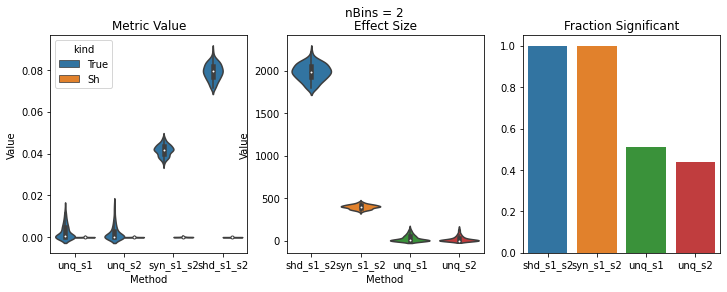

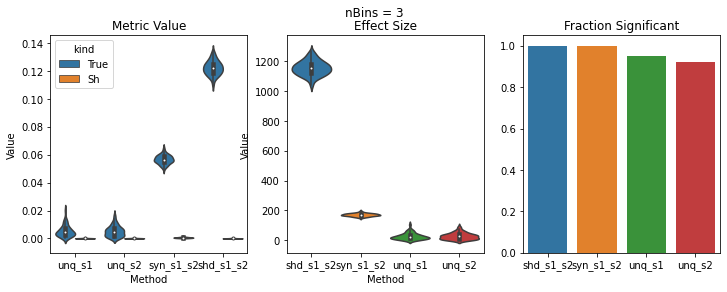

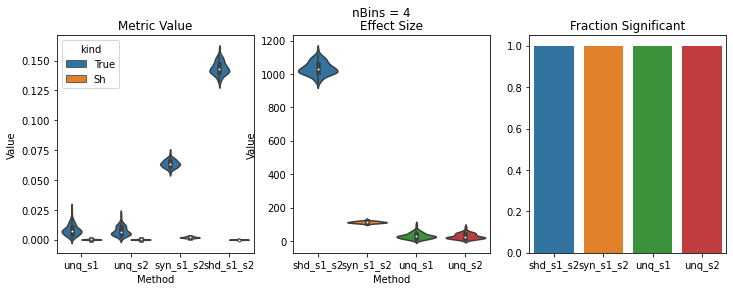

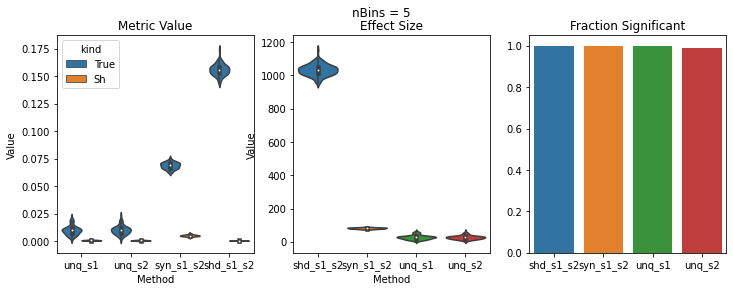

In [14]:
for nBins, rezDF in rezDFDict.items():
    plot_test(rezDF, suptitle='nBins = ' + str(nBins))

### Test relationship of synergy and redundancy for fixed data size

In [34]:
rezSynLst = []
rezRedLst = []

for nTest in range(20000):
    if nTest % 1000 == 0:
        print(nTest)
    
    sigErrX, sigErrY, sigErrZ = np.random.uniform(0, 2, 3)
    x, y, z = gen_data_red_noisy(n=1000, sigErrX=sigErrX, sigErrY=sigErrY, sigErrZ=sigErrZ)
    rez = pid_bin(x,y,z, nBins=4)
    
    rezSynLst += [rez['syn_s1_s2']]
    rezRedLst += [rez['shd_s1_s2']]

0
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00004328, s2: 0.15051096
shd information: 0.18179839, syn information: 0.04543610
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00613232, s2: 0.13304197
shd information: 0.20336064, syn information: 0.07567804
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24727858, s2: 0.00215411
shd information: 0.14151093, syn information: 0.07317416
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23248019, s2: 0.00243800
shd information: 0.04939687, syn information: 0.02199104
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10217091, s2: 0.00888715
shd information: 0.07265215, syn information:


unq information s1: 0.00123258, s2: 0.11137085
shd information: 0.06648580, syn information: 0.02380705
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00022799, s2: 0.18811888
shd information: 0.18720477, syn information: 0.04293261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00048146, s2: 0.20000253
shd information: 0.10281136, syn information: 0.04258670
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22771643, s2: 0.00141702
shd information: 0.16875389, syn information: 0.07685120
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00061254, s2: 0.09842947
shd information: 0.17196290, syn information: 0.04987074
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00715753, s2: 0.04547385
shd information: 0.03127999, syn information: 0.02867756
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01493217, s2: 0.01973311
shd information: 0.19808528, syn information: 0.06186494
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00772971, s2: 0.02692716
shd information: 0.02276225, syn information: 0.02564930
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35301876, s2: 0.00180472
shd information: 0.10946495, syn information: 0.04047570
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29816097, s2: 0.00058894
shd information: 0.28430811, syn information: 0.02575588
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01218398, s2: 0.02380590
shd information: 0.03496574, syn information: 0.02840526
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00425664, s2: 0.13580388
shd information: 0.09333407, syn information: 0.03161586
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03046269, s2: 0.00293143
shd information: 0.10164786, syn information: 0.02316930
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07042948, s2: 0.00624354
shd information: 0.08931530, syn information: 0.04152449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02783768, s2: 0.00809389
shd information: 0.02059310, syn information: 0.03099697
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.06441022, s2: 0.00552911
shd information: 0.04080245, syn information: 0.02671191
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07738538, s2: 0.00179313
shd information: 0.05030689, syn information: 0.02938636
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00595560, s2: 0.10033261
shd information: 0.05530965, syn information: 0.05697541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01675033, s2: 0.01547428
shd information: 0.12067021, syn information: 0.03194255
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00519329, s2: 0.00628759
shd information: 0.02692134, syn information: 0.03359484
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.15758274, s2: 0.00342177
shd information: 0.10755891, syn information: 0.09227232
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03276350, s2: 0.01244952
shd information: 0.23172575, syn information: 0.10351095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00219465, s2: 0.14989480
shd information: 0.09167483, syn information: 0.03354956
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00107116, s2: 0.12588832
shd information: 0.45175003, syn information: 0.02318657
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00551048, s2: 0.06237205
shd information: 0.11328565, syn information: 0.10083325
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01259531, s2: 0.00986947
shd information: 0.05386337, syn information: 0.05373686
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00230237, s2: 0.04111179
shd information: 0.04812692, syn information: 0.05167092
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01418049, s2: 0.00976767
shd information: 0.20221922, syn information: 0.14794351
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01624666, s2: 0.03373195
shd information: 0.28026823, syn information: 0.12360880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00044354, s2: 0.01982070
shd information: 0.02046391, syn information: 0.02414655
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01542085, s2: 0.02399358
shd information: 0.12189871, syn information: 0.04229144
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07989464, s2: 0.00018288
shd information: 0.05040421, syn information: 0.02097584
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08270930, s2: 0.00328253
shd information: 0.12020537, syn information: 0.08712470
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00060516, s2: 0.50875433
shd information: 0.09810557, syn information: 0.04633600
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09275052, s2: 0.00125297
shd information: 0.07874455, syn information: 0.05383993
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01004050, s2: 0.13996740
shd information: 0.16803417, syn information: 0.08036608
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.45172348
shd information: 0.12346826, syn information: 0.03761384
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09837007, s2: 0.00352667
shd information: 0.07569818, syn information: 0.03967888
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04938948, s2: 0.00441137
shd information: 0.14591927, syn information: 0.10481983
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07340519, s2: 0.02093973
shd information: 0.28779951, syn information: 0.19689933
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00310824, s2: 0.19185842
shd information: 0.14396902, syn information: 0.05921631
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00061741, s2: 0.36437459
shd information: 0.22481477, syn information: 0.09465088
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03115338, s2: 0.00530112
shd information: 0.04946010, syn information: 0.03846619
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12720975, s2: 0.00607800
shd information: 0.21667935, syn information: 0.02924982
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00405874, s2: 0.04439049
shd information: 0.04213077, syn information: 0.02497396
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00287744, s2: 0.11070574
shd information: 0.16950690, syn information: 0.03876849
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001447, s2: 0.09152469
shd information: 0.06776491, syn information: 0.03401515
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00367842, s2: 0.07117436
shd information: 0.03669488, syn information: 0.03859647
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27351913, s2: 0.00047609
shd information: 0.28638643, syn information: 0.03187071
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00675609, s2: 0.02127948
shd information: 0.04108508, syn information: 0.03971369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00822560, s2: 0.06134289
shd information: 0.20113265, syn information: 0.02831242
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04458405, s2: 0.01100672
shd information: 0.07457137, syn information: 0.03452073
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00077501, s2: 0.28381288
shd information: 0.15853950, syn information: 0.06194908
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21693954, s2: 0.00206972
shd information: 0.14705917, syn information: 0.09859317
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00250716, s2: 0.05726604
shd information: 0.04658386, syn information: 0.03831877
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01918191, s2: 0.10268820
shd information: 0.28034199, syn information: 0.18078509
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09898838, s2: 0.00617447
shd information: 0.14258522, syn information: 0.08354684
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00618852, s2: 0.01233490
shd information: 0.12928492, syn information: 0.00439620
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12110148, s2: 0.00081170
shd information: 0.13054805, syn information: 0.07039746
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.34828461, s2: 0.00039770
shd information: 0.16305734, syn information: 0


unq information s1: 0.00238269, s2: 0.08933205
shd information: 0.03615938, syn information: 0.01954782
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09432832, s2: 0.00250460
shd information: 0.06630020, syn information: 0.04999220
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.73243515, s2: 0.00099345
shd information: 0.69939768, syn information: 0.05232964
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00433520, s2: 0.02720468
shd information: 0.05072427, syn information: 0.04302685
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.14068588
shd information: 0.16182567, syn information: 0.00974895
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00839753, s2: 0.05345741
shd information: 0.08436347, syn information: 0.02986360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00034205, s2: 0.58050427
shd information: 0.24476415, syn information: 0.06403314
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17002407, s2: 0.00569319
shd information: 0.75911719, syn information: 0.03597312
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06807546, s2: 0.01555196
shd information: 0.04996253, syn information: 0.04204053
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04255460, s2: 0.00955597
shd information: 0.17000851, syn information: 0.13641146
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03927822, s2: 0.01627726
shd information: 0.11493339, syn information: 0.09330221
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01078676, s2: 0.01656079
shd information: 0.41303602, syn information: 0.01746136
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08241135, s2: 0.00150368
shd information: 0.03754024, syn information: 0.03784759
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01564348, s2: 0.09139078
shd information: 0.26072624, syn information: 0.14148396
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24446326, s2: 0.00056236
shd information: 0.10388334, syn information: 0.04375771
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.11932255, s2: 0.00388723
shd information: 0.06617332, syn information: 0.03688542
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00173014, s2: 0.11016750
shd information: 0.09414937, syn information: 0.02948256
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20175630, s2: 0.00090847
shd information: 0.07674856, syn information: 0.03843457
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14413081, s2: 0.00072737
shd information: 0.08263812, syn information: 0.04482045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01090095, s2: 0.06397789
shd information: 0.14598979, syn information: 0.08602978
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.60284377, s2: -0.00000000
shd information: 0.16627059, syn information: 0.02989888
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00215466, s2: 0.04023750
shd information: 0.05505090, syn information: 0.02401803
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05901988, s2: 0.00175060
shd information: 0.09559657, syn information: 0.02321368
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00053575, s2: 0.05479555
shd information: 1.60207646, syn information: 0.02273828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04220515, s2: 0.00782281
shd information: 0.22209259, syn information: 0.01185826
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.05382351, s2: 0.00672132
shd information: 0.08127938, syn information: 0.05297932
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10427358, s2: 0.00064285
shd information: 0.02351976, syn information: 0.02228510
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00196127, s2: 0.15076242
shd information: 0.03140056, syn information: 0.01872429
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05315807, s2: 0.01332895
shd information: 0.12061961, syn information: 0.09300801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00009869, s2: 0.21005361
shd information: 0.13766253, syn information: 0.06766267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00331962, s2: 0.07423207
shd information: 0.06197257, syn information: 0.04372677
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09910230, s2: 0.00281872
shd information: 0.05844514, syn information: 0.01933881
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09715509, s2: 0.00660978
shd information: 0.07473192, syn information: 0.04233962
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01853977, s2: 0.01841520
shd information: 0.03431965, syn information: 0.04159274
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08588273, s2: 0.00810540
shd information: 0.15880912, syn information: 0.03161112
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08589528, s2: 0.01120526
shd information: 0.15772859, syn information: 0.08874715
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04207256, s2: 0.02889314
shd information: 0.80440408, syn information: 0.12665768
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09932592, s2: 0.00077946
shd information: 0.05090664, syn information: 0.01984120
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00296725, s2: 0.02274029
shd information: 0.07443457, syn information: 0.05034320
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16188759, s2: 0.00040496
shd information: 0.09682247, syn information: 0

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33440630, s2: 0.00028939
shd information: 0.09010053, syn information: 0.02923010
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02499687, s2: 0.00431498
shd information: 0.02510438, syn information: 0.03515487
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.10800510
shd information: 0.28802793, syn information: 0.03121515
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27051264, s2: 0.00351318
shd information: 0.04962908, syn information: 0.03652389
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06333021, s2: 0.00284549
shd information: 0.03305327, syn information: 


unq information s1: 0.00249163, s2: 0.14661035
shd information: 0.07658676, syn information: 0.02017767
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00159158, s2: 0.05545216
shd information: 0.04809639, syn information: 0.03756918
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02233335, s2: 0.00998554
shd information: 0.12289147, syn information: 0.06306121
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.37223513, s2: 0.00245404
shd information: 0.13762681, syn information: 0.07593494
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03697947, s2: 0.00700936
shd information: 0.01274374, syn information: 0.03172598
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.06789607, s2: 0.00232986
shd information: 0.03454042, syn information: 0.01984389
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00166675, s2: 0.37275973
shd information: 0.12046045, syn information: 0.04229481
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00080335, s2: 0.22917005
shd information: 0.05097690, syn information: 0.02378252
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35690287, s2: 0.00067579
shd information: 0.09379243, syn information: 0.03660937
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14952358, s2: 0.00047205
shd information: 0.17203408, syn information: 0.07009242
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00110638, s2: 0.06375969
shd information: 0.04300828, syn information: 0.02249431
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01596383, s2: 0.02640407
shd information: 0.13709334, syn information: 0.03828058
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00067415, s2: 0.18516432
shd information: 0.13814108, syn information: 0.08480941
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01103108, s2: 0.12663627
shd information: 0.03447273, syn information: 0.02834083
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00151051, s2: 0.12180596
shd information: 0.02494960, syn information: 0.02297905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 1.38225137, s2: -0.00000000
shd information: 0.10699777, syn information: 0.01261189
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00138119, s2: 0.05232598
shd information: 0.04342467, syn information: 0.02662301
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09997347, s2: 0.00096094
shd information: 0.29972795, syn information: 0.06246970
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00122282, s2: 0.07410228
shd information: 0.15866645, syn information: 0.10742951
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04291827, s2: 0.00488812
shd information: 0.08937430, syn information: 0.05798308
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00121359, s2: 0.04626429
shd information: 0.03755719, syn information: 0.03983554
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00019700, s2: 0.08899246
shd information: 0.16687307, syn information: 0.02875761
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00175701, s2: 0.07735653
shd information: 0.04524691, syn information: 0.03162323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.07049064
shd information: 0.16401968, syn information: 0.02261618
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09987893, s2: 0.00085700
shd information: 0.05067719, syn information: 0.02591287
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.36901781, s2: -0.00000000
shd information: 0.13575368, syn information: 0.00843567
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31716605
shd information: 0.19059903, syn information: 0.09729752
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01111238, s2: 0.03834183
shd information: 0.17920003, syn information: 0.08675780
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.54274792, s2: 0.00199996
shd information: 0.24306554, syn information: 0.03099667
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01159731, s2: 0.01498657
shd information: 0.06551331, syn information:


unq information s1: 0.32393226, s2: 0.00337433
shd information: 0.34426611, syn information: 0.07762169
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00681631, s2: 0.01102900
shd information: 0.10597765, syn information: 0.06118904
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07117477, s2: 0.01020413
shd information: 0.18188111, syn information: 0.13276525
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00441606, s2: 0.07022715
shd information: 0.02295914, syn information: 0.02210535
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.42392663, s2: 0.01190258
shd information: 1.01620093, syn information: 0.07875893
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00068012, s2: 0.21723933
shd information: 0.25627952, syn information: 0.08924656
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00665810, s2: 0.09095664
shd information: 0.14865759, syn information: 0.05113167
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02032989, s2: 0.02764352
shd information: 0.07295946, syn information: 0.04962446
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.47072315, s2: 0.00008738
shd information: 0.14985670, syn information: 0.04241376
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02283688, s2: 0.01058982
shd information: 0.07524364, syn information: 0.05469541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

overwriting existing data

unq information s1: 0.19556656, s2: 0.00227696
shd information: 0.08641909, syn information: 0.03845631
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00105892, s2: 0.05262564
shd information: 0.01440126, syn information: 0.02998325
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.66827126, s2: -0.00000000
shd information: 0.13605794, syn information: 0.02779206
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01055120, s2: 0.05911427
shd information: 0.08377406, syn information: 0.06001483
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002652, s2: 0.26245488
shd information: 0.52303901, syn information: 0.18082355
Adding data with properties: 3 processes, 1000 samples, 1 re


unq information s1: -0.00000000, s2: 0.48057705
shd information: 0.18867859, syn information: 0.06726228
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08033246, s2: 0.01470534
shd information: 0.46852962, syn information: 0.18955135
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02419967, s2: 0.00770391
shd information: 0.04145148, syn information: 0.04144913
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24100096, s2: 0.00103596
shd information: 0.08820615, syn information: 0.03412773
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00359744, s2: 0.13283438
shd information: 0.02987908, syn information: 0.01754527
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.09815993, s2: 0.00416107
shd information: 0.09271396, syn information: 0.03333179
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01727615, s2: 0.00959618
shd information: 0.02953091, syn information: 0.04040815
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13275315, s2: 0.00201040
shd information: 0.04904835, syn information: 0.03155450
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12022815, s2: 0.00277625
shd information: 0.07116307, syn information: 0.03462578
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00176109, s2: 0.23384151
shd information: 0.22189674, syn information: 0.03448650
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.18706252, s2: 0.00028578
shd information: 0.03688698, syn information: 0.02715821
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19289655, s2: 0.00189528
shd information: 0.20713522, syn information: 0.08435415
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00583355, s2: 0.05372062
shd information: 0.20143205, syn information: 0.15708208
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01646045, s2: 0.02577556
shd information: 0.17093971, syn information: 0.14838093
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07559129, s2: 0.01707091
shd information: 0.27696426, syn information: 0.10639379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05669441, s2: 0.00182671
shd information: 0.12053189, syn information: 0.05065218
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00579144, s2: 0.05071426
shd information: 0.03907516, syn information: 0.03717155
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07234804, s2: 0.00023055
shd information: 0.13779974, syn information: 0.02375827
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.36902249, s2: 0.00293254
shd information: 0.16684300, syn information: 0.07348118
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00049446, s2: 0.16696072
shd information: 0.10076064, syn information: 0.03077730
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00592514, s2: 0.16080773
shd information: 0.03787575, syn information: 0.02364464
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00050518, s2: 0.41056092
shd information: 0.14910979, syn information: 0.05982345
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11644338, s2: 0.01947416
shd information: 0.74810093, syn information: 0.22461468
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21355407, s2: 0.00329069
shd information: 0.25869079, syn information: 0.07130016
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00401837, s2: 0.04713740
shd information: 0.10690209, syn information: 0.04167006
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00113420, s2: 0.22918632
shd information: 0.23656369, syn information: 0.03406757
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.54602596
shd information: 0.10564904, syn information: 0.03591946
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.75349628
shd information: 0.09777364, syn information: 0.02970778
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01411284, s2: 0.07685988
shd information: 0.11809857, syn information: 0.09001131
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00042872, s2: 0.12631635
shd information: 0.06607028, syn information:


unq information s1: 0.00079504, s2: 0.11970668
shd information: 0.09031835, syn information: 0.04227381
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00242489, s2: 0.06377810
shd information: 0.24991840, syn information: 0.02246231
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07776654, s2: 0.00331331
shd information: 0.04438184, syn information: 0.03268239
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11652560, s2: 0.00155504
shd information: 0.08317751, syn information: 0.02656951
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01244704, s2: 0.09660459
shd information: 0.11597651, syn information: 0.08401327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00034813, s2: 0.11816627
shd information: 0.02931678, syn information: 0.02282679
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30683968, s2: 0.00282423
shd information: 0.45464086, syn information: 0.14419321
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05259310, s2: 0.00321056
shd information: 0.07054289, syn information: 0.06396396
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11098096, s2: 0.00424182
shd information: 0.03801043, syn information: 0.02069102
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00556653, s2: 0.03684808
shd information: 0.03588013, syn information: 0.04025358
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10762577, s2: 0.00154813
shd information: 0.08971407, syn information: 0.06983428
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17654449, s2: 0.00330091
shd information: 0.07237860, syn information: 0.02435407
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00343446, s2: 0.04972931
shd information: 0.20523018, syn information: 0.02658353
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06682590, s2: 0.00312563
shd information: 0.12327615, syn information: 0.03435374
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01705545, s2: 0.02551343
shd information: 0.09132288, syn information: 0


unq information s1: 0.14771476, s2: 0.00035351
shd information: 0.13827316, syn information: 0.03015657
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50241524, s2: -0.00000000
shd information: 0.11331067, syn information: 0.02647546
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04631584, s2: 0.00748121
shd information: 0.08299097, syn information: 0.03158046
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03453296, s2: 0.03858858
shd information: 0.39442731, syn information: 0.12681884
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11211249, s2: 0.00249985
shd information: 0.07354343, syn information: 0.02909050
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

shd information: 0.02463741, syn information: 0.01524323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21956493, s2: 0.00011038
shd information: 0.17497937, syn information: 0.02744345
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32405872, s2: 0.00000005
shd information: 0.07219300, syn information: 0.03207967
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00539420, s2: 0.16467509
shd information: 0.06079351, syn information: 0.02205909
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00275738, s2: 0.07012798
shd information: 0.17380162, syn information: 0.13802328
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10966016, s2: 0


unq information s1: 0.09762647, s2: 0.00076916
shd information: 0.13727024, syn information: 0.07730746
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.00743202, s2: -0.00000000
shd information: 0.12141447, syn information: 0.01997332
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04420821, s2: 0.00430145
shd information: 0.06625963, syn information: 0.03332509
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00157262, s2: 0.08446177
shd information: 0.19737028, syn information: 0.11924059
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06182818, s2: 0.01142887
shd information: 0.09019151, syn information: 0.02074383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02341250, s2: 0.03415086
shd information: 0.25023955, syn information: 0.07245267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00063005, s2: 0.14080572
shd information: 0.15401246, syn information: 0.03035794
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01769968, s2: 0.00650923
shd information: 0.09460970, syn information: 0.01319516
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.62247781, s2: -0.00000000
shd information: 0.24340296, syn information: 0.03194426
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05082359, s2: 0.01173885
shd information: 0.19788839, syn information: 0.02927021
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06448144, s2: 0.00780555
shd information: 0.04540995, syn information: 0.04154016
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00485823, s2: 0.03142877
shd information: 0.05091329, syn information: 0.04046368
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16441922, s2: 0.00460713
shd information: 0.15491991, syn information: 0.02903097
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.47904756, s2: 0.00008303
shd information: 0.08650972, syn information: 0.04155323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02441646, s2: 0.02410116
shd information: 0.11455542, syn information: 0


unq information s1: 0.28648976, s2: 0.00276111
shd information: 0.11752304, syn information: 0.03549034
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01028165, s2: 0.07954964
shd information: 0.18629827, syn information: 0.04978241
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03304172, s2: 0.04197186
shd information: 0.17164672, syn information: 0.09985146
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10390944, s2: 0.00299473
shd information: 0.09343974, syn information: 0.06306076
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00082808, s2: 0.24429576
shd information: 0.04088161, syn information: 0.02036455
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.61980800
shd information: 0.12254908, syn information: 0.04154770
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02148112, s2: 0.00895955
shd information: 0.08168642, syn information: 0.03777133
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24282365, s2: 0.00262908
shd information: 0.14624590, syn information: 0.02678588
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19574407, s2: 0.00032010
shd information: 0.10189240, syn information: 0.04442591
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09808829, s2: 0.00043531
shd information: 0.03709679, syn information: 


unq information s1: 0.00115206, s2: 0.04779898
shd information: 0.04506498, syn information: 0.03391063
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01284114, s2: 0.01070666
shd information: 0.03130768, syn information: 0.02986264
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00272566, s2: 0.01111955
shd information: 0.02134792, syn information: 0.03756239
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08753562, s2: 0.01033669
shd information: 0.19991142, syn information: 0.14187995
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13843789, s2: 0.00085433
shd information: 0.05070808, syn information: 0.02041261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00490967, s2: 0.16650876
shd information: 0.22217304, syn information: 0.04162849
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00137149, s2: 0.07810759
shd information: 0.10759517, syn information: 0.03363081
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05308569, s2: 0.00454548
shd information: 0.11911551, syn information: 0.07063357
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10307878, s2: 0.00332701
shd information: 0.03071209, syn information: 0.02818151
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21158501, s2: 0.00198716
shd information: 0.16594387, syn information: 0.08096836
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.19085349, s2: 0.00049351
shd information: 0.08148995, syn information: 0.04395232
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03145742, s2: 0.00544851
shd information: 0.05442746, syn information: 0.05098955
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04764621, s2: 0.00520517
shd information: 0.09956716, syn information: 0.06066227
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00691904, s2: 0.04603184
shd information: 0.03114775, syn information: 0.02423050
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02450647, s2: 0.01059391
shd information: 0.10637502, syn information: 0.08444566
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.54938622, s2: 0.00254160
shd information: 0.46936018, syn information: 0.08638468
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28669919, s2: 0.00011591
shd information: 0.26017200, syn information: 0.11166746
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01040222, s2: 0.00350649
shd information: 0.10141701, syn information: 0.02024842
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000102, s2: 0.44629411
shd information: 0.35797060, syn information: 0.03621958
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00438329, s2: 0.07567587
shd information: 0.03957165, syn information: 0.03368147
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00805588, s2: 0.11434975
shd information: 0.11555398, syn information: 0.06293013
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00081053, s2: 0.07173143
shd information: 0.03854873, syn information: 0.01760501
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00115728, s2: 0.23163868
shd information: 0.15465548, syn information: 0.05397359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07560546, s2: 0.00380491
shd information: 0.28535452, syn information: 0.04136510
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01001582, s2: 0.16338259
shd information: 0.23615152, syn information: 0.12920408
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01110080, s2: 0.17409350
shd information: 0.02843852, syn information: 0.01991224
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00678605, s2: 0.10583033
shd information: 0.14527752, syn information: 0.05692180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07368150, s2: 0.00208915
shd information: 0.09767257, syn information: 0.07832176
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00568866, s2: 0.05154123
shd information: 0.02601301, syn information: 0.02598341
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28056382
shd information: 0.20190342, syn information: 0.04752404
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00417850, s2: 0.08443358
shd information: 0.40733981, syn information: 0.03390706
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03021901, s2: 0.01119828
shd information: 0.15969449, syn information: 0.14716142
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05516143, s2: 0.00513551
shd information: 0.05903521, syn information: 0.05570839
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19618296, s2: 0.00024358
shd information: 0.11587472, syn information: 0.07531734
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03414070, s2: 0.01741647
shd information: 0.73934612, syn information: 0.01394137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.08257055, s2: 0.00087871
shd information: 0.06369197, syn information: 0.02411138
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00337617, s2: 0.02198356
shd information: 0.01849778, syn information: 0.03028303
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00307834, s2: 0.34725079
shd information: 0.56728438, syn information: 0.11203140
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20906220
shd information: 0.20928589, syn information: 0.11354134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.47130139, s2: -0.00000000
shd information: 0.10184473, syn information: 0.02512382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.07862308, s2: 0.00812103
shd information: 0.03019089, syn information: 0.02780423
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04721867, s2: 0.00546459
shd information: 0.06906526, syn information: 0.05917233
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.90547999, s2: -0.00000000
shd information: 0.17779902, syn information: 0.03220336
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.68435558
shd information: 0.10534618, syn information: 0.02159663
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17354569, s2: 0.00737857
shd information: 0.16744170, syn information: 0.06701003
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.00069917, s2: 0.42121531
shd information: 0.55618710, syn information: 0.06113826
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10190145, s2: 0.00344992
shd information: 0.14037959, syn information: 0.03668258
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06462939, s2: 0.00821140
shd information: 0.21455296, syn information: 0.09515180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06936097, s2: 0.03178210
shd information: 0.32089313, syn information: 0.03062652
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09638123, s2: 0.00460416
shd information: 0.36529681, syn information: 0.04852660
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03380552, s2: 0.00763655
shd information: 0.05508322, syn information: 0.05420265
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01574442, s2: 0.00896692
shd information: 0.07436595, syn information: 0.06668904
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00012891, s2: 0.11237643
shd information: 0.04323699, syn information: 0.02235406
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03253609, s2: 0.01793976
shd information: 0.12958197, syn information: 0.06053680
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00094233, s2: 0.26942254
shd information: 0.12461333, syn information: 0.04715572
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00281344, s2: 0.12183032
shd information: 0.06253393, syn information: 0.02685658
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04468709, s2: 0.00220713
shd information: 0.04293584, syn information: 0.04872994
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06746712, s2: 0.00382168
shd information: 0.04055284, syn information: 0.03043127
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50913806, s2: -0.00000000
shd information: 0.16347040, syn information: 0.02257192
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.36315948, s2: 0.00023760
shd information: 0.12505650, syn information: 0.05796573
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00042616, s2: 0.35485402
shd information: 0.15078756, syn information: 0.07373751
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19591969, s2: 0.00002361
shd information: 0.11070832, syn information: 0.08018952
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22469449, s2: 0.00123437
shd information: 0.39163902, syn information: 0.03797317
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09507165, s2: 0.00064807
shd information: 0.10389402, syn information: 0.05984095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01901367, s2: 0.00965202
shd information: 0.05868591, syn information: 0.05497488
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00024428, s2: 0.21255336
shd information: 0.07794209, syn information: 0.03094024
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01468275, s2: 0.06076597
shd information: 0.32725288, syn information: 0.05592574
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14306889, s2: 0.00470933
shd information: 0.04173746, syn information: 0.02460718
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00291029, s2: 0.17359524
shd information: 0.11894561, syn information: 0.03993386
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005871, s2: 0.19415995
shd information: 0.04473743, syn information: 0.03206871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.82382897, s2: -0.00000000
shd information: 0.14446935, syn information: 0.02359257
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40320039, s2: 0.00033316
shd information: 0.13548596, syn information: 0.02667305
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05094173, s2: 0.01856655
shd information: 0.18482345, syn information: 0.13470888
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24612416, s2: 0.00002669
shd information: 0.22952382, syn information: 0.10600541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00397664, s2: 0.15841733
shd information: 0.35052314, syn information: 0.13910256
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01114578, s2: 0.13545062
shd information: 0.51580654, syn information: 0.10631577
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01022435, s2: 0.09065018
shd information: 0.09225889, syn information: 0.01589306
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15713345, s2: 0.00411925
shd information: 0.07423654, syn information: 0.03562801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14176758, s2: 0.00430588
shd information: 0.10361608, syn information: 0.07793473
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08974608, s2: 0.00266166
shd information: 0.08145522, syn information: 0.02955953
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02820786, s2: 0.02554410
shd information: 0.12110726, syn information: 0.10157906
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01943792, s2: 0.02012863
shd information: 0.12749849, syn information: 0.12505200
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03264641, s2: 0.00378262
shd information: 0.17432123, syn information: 0.02141554
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00688262, s2: 0.04385865
shd information: 0.01589610, syn information: 0.03749472
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.66567946
shd information: 0.12607155, syn information: 


unq information s1: 0.00027539, s2: 0.31294820
shd information: 0.33697997, syn information: 0.08588124
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02233464, s2: 0.02236376
shd information: 0.07630399, syn information: 0.06362941
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.42574637, s2: 0.00012079
shd information: 0.29166606, syn information: 0.04467162
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000551, s2: 0.60502777
shd information: 0.12720587, syn information: 0.03031050
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00188603, s2: 0.06219046
shd information: 0.04634043, syn information: 0.02662162
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.22974390, s2: 0.00291617
shd information: 0.11650382, syn information: 0.02526074
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.47054689, s2: -0.00000000
shd information: 0.18420579, syn information: 0.07399008
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00114129, s2: 0.19930652
shd information: 0.17509929, syn information: 0.03681031
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17349902, s2: 0.00010451
shd information: 0.10346471, syn information: 0.05762757
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07041106, s2: 0.00071417
shd information: 0.05612702, syn information: 0.02501781
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04241550, s2: 0.01507030
shd information: 0.13608623, syn information: 0.05854919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01682340, s2: 0.03954122
shd information: 0.11911901, syn information: 0.10754571
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10643876, s2: 0.00135413
shd information: 0.15038815, syn information: 0.02194400
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04699793, s2: 0.00375518
shd information: 0.03060734, syn information: 0.03637740
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00853383, s2: 0.01361119
shd information: 0.03979233, syn information: 0.04742754
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00140018, s2: 0.07370015
shd information: 0.15685988, syn information: 0.07305005
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00465673, s2: 0.22085425
shd information: 0.62387577, syn information: 0.10005915
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04043924, s2: 0.00401135
shd information: 0.07189541, syn information: 0.03066379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00172331, s2: 0.46381486
shd information: 0.16872851, syn information: 0.03672487
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02355311, s2: 0.01778766
shd information: 0.07627662, syn information: 0.04645240
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01283887, s2: 0.00967290
shd information: 0.05083731, syn information: 0.03102233
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10638613, s2: 0.00073020
shd information: 0.04500833, syn information: 0.02173630
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03340732, s2: 0.01017353
shd information: 0.09196180, syn information: 0.02506694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00795072, s2: 0.02332839
shd information: 0.04502615, syn information: 0.03639996
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00609882, s2: 0.03035247
shd information: 0.02440517, syn information: 0.03466094
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05527695, s2: 0.00780109
shd information: 0.14112705, syn information: 0.11506999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00067013, s2: 0.91265319
shd information: 0.25961607, syn information: 0.01878147
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00804848, s2: 0.10733578
shd information: 0.70240288, syn information: 0.11059667
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35955456, s2: 0.00053983
shd information: 0.08054775, syn information: 0.02210988
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00500113, s2: 0.08639736
shd information: 0.03498134, syn information: 0.02921379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00081825, s2: 0.46078496
shd information: 0.20674069, syn information: 0.07409127
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00932171, s2: 0.01730125
shd information: 0.02322841, syn information: 0.04306966
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00123157, s2: 0.34446005
shd information: 0.16777353, syn information: 0.02521018
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05085133, s2: 0.00147889
shd information: 0.02072015, syn information: 0.02739991
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00097466, s2: 0.10968050
shd information: 0.06590225, syn information: 0


unq information s1: 0.03385780, s2: 0.01162604
shd information: 0.04884359, syn information: 0.04764503
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.65631164
shd information: 0.12233423, syn information: 0.04512590
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02499737, s2: 0.04181841
shd information: 0.11646724, syn information: 0.07506355
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00122067, s2: 0.10450739
shd information: 0.13011250, syn information: 0.12523842
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00183962, s2: 0.59658326
shd information: 0.34233835, syn information: 0.02693487
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00957970, s2: 0.01518406
shd information: 0.02597172, syn information: 0.03874589
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00284687, s2: 0.06633160
shd information: 0.14396344, syn information: 0.11547246
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.39366402
shd information: 0.20842950, syn information: 0.06949962
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13318469, s2: 0.00457947
shd information: 0.24119534, syn information: 0.05126688
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01106313, s2: 0.04348097
shd information: 0.27745508, syn information: 0.15861037
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01658823, s2: 0.02000608
shd information: 0.05393618, syn information: 0.05053264
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.66604432, s2: -0.00000000
shd information: 0.30013599, syn information: 0.03878549
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21384572
shd information: 0.06951809, syn information: 0.01734058
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00069245, s2: 0.10992092
shd information: 0.05077175, syn information: 0.03955055
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02308244, s2: 0.00680885
shd information: 0.19758441, syn information: 0.02125453
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00105542, s2: 0.23109581
shd information: 0.51996689, syn information: 0.14465733
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.88655393
shd information: 0.17326932, syn information: 0.03650571
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00158693, s2: 0.17856864
shd information: 0.14948305, syn information: 0.09994268
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.97101767
shd information: 0.22336495, syn information: 0.01468828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07416143, s2: 0.00380338
shd information: 0.06901974, syn information:


unq information s1: 0.00584801, s2: 0.10640522
shd information: 0.08355497, syn information: 0.03486987
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00332571, s2: 0.22660993
shd information: 0.19344239, syn information: 0.07624331
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03229936, s2: 0.00447040
shd information: 0.02775126, syn information: 0.03234046
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.29648280
shd information: 0.25205703, syn information: 0.02067180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00643207, s2: 0.02020467
shd information: 0.05763357, syn information: 0.03862395
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.03910673, s2: 0.01842267
shd information: 0.17996578, syn information: 0.16241173
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31842363, s2: 0.00055033
shd information: 0.08385997, syn information: 0.02321797
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05689642, s2: 0.00185174
shd information: 0.09506657, syn information: 0.04851235
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15210748, s2: 0.00322746
shd information: 0.07668219, syn information: 0.03615766
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08354049, s2: 0.00110588
shd information: 0.19154312, syn information: 0.03508939
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.12724772, s2: 0.00180618
shd information: 0.05658340, syn information: 0.03539213
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00582813, s2: 0.03271900
shd information: 0.09305438, syn information: 0.04843230
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04994760, s2: 0.00271424
shd information: 0.04630200, syn information: 0.03542078
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05399434, s2: 0.00175513
shd information: 0.20525483, syn information: 0.09643487
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07534976, s2: 0.00216618
shd information: 0.02628109, syn information: 0.02731844
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00084156, s2: 0.20078145
shd information: 0.06650978, syn information: 0.04643503
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00597104, s2: 0.25310892
shd information: 0.17519604, syn information: 0.12402083
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04585768, s2: 0.00454225
shd information: 0.05915860, syn information: 0.02628702
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00368474, s2: 0.07091222
shd information: 0.06786326, syn information: 0.04243391
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00658633, s2: 0.27870158
shd information: 0.35014720, syn information: 0.03770235
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00782212, s2: 0.16582074
shd information: 0.42545745, syn information: 0.05384355
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00337629, s2: 0.03834952
shd information: 0.06220721, syn information: 0.03258513
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00439470, s2: 0.07031816
shd information: 0.05193194, syn information: 0.03220639
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00583258, s2: 0.09839786
shd information: 0.24488764, syn information: 0.13915101
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01149424, s2: 0.05435266
shd information: 0.13280870, syn information: 0.03791958
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.07033779, s2: 0.00503252
shd information: 0.11612352, syn information: 0.06850257
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04292639, s2: 0.03367475
shd information: 0.29447215, syn information: 0.07425839
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02972379, s2: 0.02773440
shd information: 0.07985685, syn information: 0.09304672
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03810780, s2: 0.00358219
shd information: 0.09889531, syn information: 0.04933736
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00230789, s2: 0.22821410
shd information: 0.18092330, syn information: 0.09501917
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03677207, s2: 0.01032717
shd information: 0.26647679, syn information: 0.03785635
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00488242, s2: 0.07381464
shd information: 0.15768478, syn information: 0.10217033
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.42018702
shd information: 0.11005876, syn information: 0.02857012
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001459, s2: 0.29880203
shd information: 0.14349520, syn information: 0.09837180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03011801, s2: 0.00151484
shd information: 0.02730514, syn information: 0.03622007
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.14493303, s2: 0.00617194
shd information: 0.19718086, syn information: 0.02110677
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04073926, s2: 0.00908502
shd information: 0.08183658, syn information: 0.04299285
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.79285785
shd information: 0.12587418, syn information: 0.02462101
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00237818, s2: 0.18913023
shd information: 0.12369387, syn information: 0.07472714
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00162051, s2: 0.20349408
shd information: 0.36038464, syn information: 0.06127161
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00000082, s2: 0.44161062
shd information: 0.10772368, syn information: 0.04388483
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00297908, s2: 0.25812750
shd information: 0.24676067, syn information: 0.03094483
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12932672, s2: 0.00362179
shd information: 0.15744006, syn information: 0.13656778
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01956082, s2: 0.01601155
shd information: 0.12452924, syn information: 0.02649385
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02664763, s2: 0.01896026
shd information: 0.10313068, syn information: 0.08940560
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.04461086, s2: 0.00716681
shd information: 0.23762593, syn information: 0.06221408
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02131971, s2: 0.04027184
shd information: 0.24658590, syn information: 0.06644914
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03501595, s2: 0.01174681
shd information: 0.14087664, syn information: 0.01551469
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14415015, s2: 0.00035397
shd information: 0.18868450, syn information: 0.06693109
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01947500, s2: 0.01104762
shd information: 0.04528611, syn information: 0.04150562
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00273666, s2: 0.08119429
shd information: 0.03818485, syn information: 0.03417269
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00565944, s2: 0.01570511
shd information: 0.02392972, syn information: 0.02839950
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11695398, s2: 0.00015457
shd information: 0.06190920, syn information: 0.03645560
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00299801, s2: 0.08453607
shd information: 0.35931213, syn information: 0.17304342
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04980377, s2: 0.01574855
shd information: 0.09257825, syn information: 0


unq information s1: 0.00831042, s2: 0.12210310
shd information: 0.15665224, syn information: 0.12485615
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27351567, s2: 0.00077712
shd information: 0.09380604, syn information: 0.05964929
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001660, s2: 0.63549608
shd information: 0.25554243, syn information: 0.08449044
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00580948, s2: 0.11756290
shd information: 0.12622696, syn information: 0.04402344
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00535630, s2: 0.01797675
shd information: 0.26178808, syn information: 0.00510397
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02146359, s2: 0.00961606
shd information: 0.10341226, syn information: 0.03161265
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01958670, s2: 0.00558274
shd information: 0.04553514, syn information: 0.04301656
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00960874, s2: 0.03881866
shd information: 0.30167503, syn information: 0.01387407
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01786199, s2: 0.03554534
shd information: 0.12745648, syn information: 0.11066494
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04686046, s2: 0.00459184
shd information: 0.19529812, syn information: 0.07951553
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.49353732, s2: 0.00130809
shd information: 0.13429117, syn information: 0.01970002
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.99574912, s2: -0.00000000
shd information: 0.16852863, syn information: 0.03335267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01465383, s2: 0.08810877
shd information: 0.08696833, syn information: 0.05024533
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00237832, s2: 0.06146165
shd information: 0.11324888, syn information: 0.09887275
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05730366, s2: 0.00006437
shd information: 0.07222543, syn information: 0.04111298
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.07476088, s2: 0.02840488
shd information: 0.45692785, syn information: 0.19161450
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00505258, s2: 0.02330586
shd information: 0.13271114, syn information: 0.01699833
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00091050, s2: 0.21450734
shd information: 0.11535122, syn information: 0.08333369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01531880, s2: 0.02062561
shd information: 0.08001537, syn information: 0.04629975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01088398, s2: 0.03729807
shd information: 0.07941576, syn information: 0.02242049
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.28472056, s2: 0.00012365
shd information: 0.08024140, syn information: 0.05116961
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00860703, s2: 0.02391395
shd information: 0.05001901, syn information: 0.04046115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00927450, s2: 0.03333506
shd information: 0.05571635, syn information: 0.04230401
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.19327607, s2: -0.00000000
shd information: 0.14879375, syn information: 0.02167530
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05297424, s2: 0.01020456
shd information: 0.04279100, syn information: 0.03716226
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.08133581, s2: 0.00063715
shd information: 0.03744159, syn information: 0.02446061
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00505103, s2: 0.10186944
shd information: 0.39155258, syn information: 0.04682940
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04039326, s2: 0.00406712
shd information: 0.09760351, syn information: 0.08975332
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.67264071
shd information: 0.26819625, syn information: 0.04410091
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00826057, s2: 0.02791427
shd information: 0.08897914, syn information: 0.07015543
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.53639554, s2: -0.00000000
shd information: 0.22159420, syn information: 0.09604227
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.34765166, s2: 0.00223717
shd information: 0.07203402, syn information: 0.02503782
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00550635, s2: 0.01989632
shd information: 0.13348884, syn information: 0.06470965
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21055377, s2: 0.00105148
shd information: 0.08769992, syn information: 0.03890323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04310598, s2: 0.00180002
shd information: 0.03952168, syn information: 0.03868207
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: -0.00000000, s2: 0.86464314
shd information: 0.18241097, syn information: 0.02211091
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01046517, s2: 0.01314950
shd information: 0.08346760, syn information: 0.07317025
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00651651, s2: 0.02110174
shd information: 0.07769627, syn information: 0.04135648
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00199994, s2: 0.30628006
shd information: 0.26615020, syn information: 0.03300831
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03386734, s2: 0.00681831
shd information: 0.44727812, syn information: 0.12935499
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00354610, s2: 0.11708745
shd information: 0.04360673, syn information: 0.03931579
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01298931, s2: 0.05256676
shd information: 0.15220610, syn information: 0.05484128
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08185748, s2: 0.00453240
shd information: 0.13200001, syn information: 0.06370124
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13850980, s2: 0.00464372
shd information: 0.62451992, syn information: 0.08033800
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02978256, s2: 0.01039061
shd information: 0.05813645, syn information: 0.06140903
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00340433, s2: 0.05146902
shd information: 0.07229800, syn information: 0.03475115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15551170, s2: 0.00040954
shd information: 0.10129442, syn information: 0.03255754
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01562034, s2: 0.05747482
shd information: 0.12491137, syn information: 0.10382319
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00857831, s2: 0.04731079
shd information: 0.08747453, syn information: 0.04300739
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05073843, s2: 0.00365243
shd information: 0.32969481, syn information: 0.02238929
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.06336819, s2: 0.00077715
shd information: 0.03493559, syn information: 0.04401682
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03248951, s2: 0.02981384
shd information: 0.08685155, syn information: 0.08620389
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00264674, s2: 0.05660967
shd information: 0.18599080, syn information: 0.03141289
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00093455, s2: 0.08477688
shd information: 0.03762289, syn information: 0.03488936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07460776, s2: 0.03458541
shd information: 0.32390141, syn information: 0.19790534
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00130593, s2: 0.49648735
shd information: 0.15071716, syn information: 0.03322899
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00126096, s2: 0.17052260
shd information: 0.02621165, syn information: 0.02651392
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25929048, s2: 0.00021436
shd information: 0.46879116, syn information: 0.03511574
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04743546, s2: 0.00717673
shd information: 0.17885108, syn information: 0.01621439
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02758344, s2: 0.10329397
shd information: 0.57339140, syn information: 0.19580183
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03850458, s2: 0.01686208
shd information: 0.25731386, syn information: 0.13282304
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00082840, s2: 0.57928479
shd information: 0.38423719, syn information: 0.08776541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01826436, s2: 0.03379376
shd information: 0.10222435, syn information: 0.09641612
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01587310, s2: 0.01045618
shd information: 0.04739015, syn information: 0.04602558
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00356802, s2: 0.02389342
shd information: 0.04757056, syn information: 0.04940308
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00553261, s2: 0.09273071
shd information: 0.80128135, syn information: 0.04979792
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13741112
shd information: 0.14447734, syn information: 0.04477015
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.49171067, s2: -0.00000000
shd information: 0.29703965, syn information: 0.01754290
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04495949, s2: 0.00201135
shd information: 0.06685113, syn information: 0.05061975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00098657, s2: 0.21818739
shd information: 0.04893654, syn information: 0.02535109
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.07992000, s2: 0.00266206
shd information: 0.05180093, syn information: 0.04299267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05504058, s2: 0.00507296
shd information: 0.03939758, syn information: 0.02381133
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01577861, s2: 0.02392696
shd information: 0.11146881, syn information: 0.06034565
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01885148, s2: 0.03330939
shd information: 0.07585363, syn information: 0.04159314
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00895142, s2: 0.04067062
shd information: 0.12189070, syn information: 0.05157949
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00022546, s2: 0.18296073
shd information: 0.21252928, syn information: 0.12105161
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02038254, s2: 0.00483987
shd information: 0.06212572, syn information: 0.03581343
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16173767, s2: 0.01310295
shd information: 0.57754730, syn information: 0.19098805
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00545444, s2: 0.09355119
shd information: 0.04448539, syn information: 0.01563276
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00193702, s2: 0.24310155
shd information: 0.16872949, syn information: 0


unq information s1: 0.36062333, s2: 0.00548869
shd information: 0.13260154, syn information: 0.02672771
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26692691, s2: 0.00096993
shd information: 0.09882561, syn information: 0.04899214
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01316923, s2: 0.02553154
shd information: 0.03381492, syn information: 0.04536964
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00383073, s2: 0.10907494
shd information: 0.27637801, syn information: 0.16499430
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11320179, s2: 0.00614953
shd information: 0.36899493, syn information: 0.14661955
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00014057, s2: 0.15543885
shd information: 0.06223307, syn information: 0.02326168
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13319646, s2: 0.00173692
shd information: 0.05685791, syn information: 0.02569286
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00034040, s2: 0.12473892
shd information: 0.14385426, syn information: 0.05180022
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18070909, s2: 0.00449380
shd information: 0.17487713, syn information: 0.03832880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00449900, s2: 0.04559329
shd information: 0.10872486, syn information: 0.05027404
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00406525, s2: 0.16160647
shd information: 0.11411923, syn information: 0.09627137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08461331, s2: 0.00668794
shd information: 0.17937385, syn information: 0.03882674
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00571619, s2: 0.04958811
shd information: 0.02138090, syn information: 0.02637600
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08652825, s2: 0.00377785
shd information: 0.40321507, syn information: 0.04240700
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07672010, s2: 0.01634348
shd information: 0.13866069, syn information: 0.07910631
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03080998, s2: 0.02139631
shd information: 0.11039940, syn information: 0.05259602
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04761054, s2: 0.02926888
shd information: 0.13061755, syn information: 0.06076571
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39562388, s2: 0.00029486
shd information: 0.08190197, syn information: 0.03653758
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07290562, s2: 0.00221913
shd information: 0.04883261, syn information: 0.02237880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02588675, s2: 0.04903374
shd information: 0.38663712, syn information: 0.09253989
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00322013, s2: 0.07028569
shd information: 0.12211517, syn information: 0.06999397
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01766178, s2: 0.01640970
shd information: 0.05852163, syn information: 0.05059351
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00671427, s2: 0.03949756
shd information: 0.12908956, syn information: 0.07368305
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03082594, s2: 0.01270576
shd information: 0.04269846, syn information: 0.05172217
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00327237, s2: 0.05006648
shd information: 0.05130638, syn information: 0.02831552
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00927322, s2: 0.06908600
shd information: 0.03019599, syn information: 0.03718432
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00115518, s2: 0.17805102
shd information: 0.28882683, syn information: 0.10631383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00119963, s2: 0.12743064
shd information: 0.02534429, syn information: 0.02471940
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.58958354, s2: 0.00002633
shd information: 0.45533497, syn information: 0.09091566
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00655848, s2: 0.04110085
shd information: 0.04991494, syn information: 0.03867614
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00485828, s2: 0.06830753
shd information: 0.04022795, syn information: 0.03370458
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00172533, s2: 0.21817604
shd information: 0.06371655, syn information: 0.02924134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00030483, s2: 0.33807242
shd information: 0.23463570, syn information: 0.10605624
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00180321, s2: 0.12974136
shd information: 0.07025609, syn information: 0.05126694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00913402, s2: 0.00865712
shd information: 0.03601907, syn information: 0.04784628
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00011150, s2: 0.54539127
shd information: 0.24282017, syn information: 0.02715371
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.89872261
shd information: 0.21654399, syn information: 0.02519190
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00324887, s2: 0.11684779
shd information: 0.10364970, syn information: 0.03911321
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02206897, s2: 0.01678295
shd information: 0.09465831, syn information: 0.06818038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.58122134, s2: -0.00000000
shd information: 0.16219542, syn information: 0.05976015
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001544, s2: 0.48260324
shd information: 0.31419155, syn information: 0.05378349
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07336807, s2: 0.00779794
shd information: 0.10111044, syn information: 0.07084620
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00109459, s2: 0.28974797
shd information: 0.09193280, syn information: 0.03315137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07833895, s2: 0.00488061
shd information: 0.05788730, syn information: 0.03800467
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09303225, s2: 0.00764879
shd information: 0.08047809, syn information: 0


unq information s1: 0.00645032, s2: 0.04612869
shd information: 0.11059905, syn information: 0.06270907
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00259298, s2: 0.12456846
shd information: 0.18830417, syn information: 0.04106961
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16622192, s2: 0.00046683
shd information: 0.36202941, syn information: 0.16481694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07831101, s2: 0.00842293
shd information: 0.07481076, syn information: 0.02377800
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05029949, s2: 0.00643859
shd information: 0.09104730, syn information: 0.07831113
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03105831, s2: 0.05951296
shd information: 0.40687919, syn information: 0.11128856
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00035429, s2: 0.26917404
shd information: 0.07854387, syn information: 0.01960232
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01403293, s2: 0.11270111
shd information: 0.20576440, syn information: 0.14508326
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00962990, s2: 0.11020909
shd information: 0.21183857, syn information: 0.05982151
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00569593, s2: 0.06429642
shd information: 0.05273320, syn information: 0.03147038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00512722, s2: 0.27039335
shd information: 0.09978850, syn information: 0.04392304
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.01372848, s2: -0.00000000
shd information: 0.14181592, syn information: 0.02098674
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05461075, s2: 0.00162807
shd information: 0.03560696, syn information: 0.02317605
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.64688434, s2: -0.00000000
shd information: 0.22728211, syn information: 0.05300880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19051145, s2: 0.00093532
shd information: 0.05111023, syn information: 0.03144786
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.02148162, s2: 0.05128130
shd information: 0.30943278, syn information: 0.05186017
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00231543, s2: 0.03503685
shd information: 0.05161177, syn information: 0.04087797
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02640682, s2: 0.00306340
shd information: 0.08814684, syn information: 0.09255604
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10930503, s2: 0.00065790
shd information: 0.16403750, syn information: 0.03314545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11575315, s2: 0.00513737
shd information: 0.02811256, syn information: 0.02089260
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03044241, s2: 0.03087884
shd information: 0.25289432, syn information: 0.15797579
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06414769, s2: 0.00683911
shd information: 0.10949858, syn information: 0.07965283
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02972997, s2: 0.01728491
shd information: 0.20365955, syn information: 0.15586553
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07354355, s2: 0.02064759
shd information: 0.50704200, syn information: 0.10187725
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03176313, s2: 0.00545604
shd information: 0.04547555, syn information: 0.04343447
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.07702140, s2: 0.00227929
shd information: 0.06833038, syn information: 0.04427185
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01087802, s2: 0.05834591
shd information: 0.05224253, syn information: 0.04335414
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00842967, s2: 0.02032793
shd information: 0.09653716, syn information: 0.05335453
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01007444, s2: 0.07556176
shd information: 0.45811484, syn information: 0.04086817
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05502986, s2: 0.00589428
shd information: 0.08703863, syn information: 0.07265546
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.12507291, s2: 0.00089702
shd information: 0.06170385, syn information: 0.03379156
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01492161, s2: 0.04925412
shd information: 0.07337250, syn information: 0.04418696
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40681770, s2: -0.00000000
shd information: 0.28576915, syn information: 0.08047316
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.42608786, s2: 0.00016451
shd information: 0.18358405, syn information: 0.06624732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02880919, s2: 0.02965027
shd information: 0.84866624, syn information: 0.06044693
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01036804, s2: 0.07944803
shd information: 0.26838849, syn information: 0.03254536
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00131456, s2: 0.57970059
shd information: 0.67341960, syn information: 0.06880700
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02711227, s2: 0.13904057
shd information: 0.43101300, syn information: 0.13664176
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00263668, s2: 0.16701404
shd information: 0.07385274, syn information: 0.02953865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01497660, s2: 0.03748490
shd information: 0.13679074, syn information: 0.11532882
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23391094, s2: -0.00000000
shd information: 0.17201174, syn information: 0.04560268
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06509979, s2: 0.00763918
shd information: 0.13055287, syn information: 0.11024946
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05404809, s2: 0.00088450
shd information: 0.11824680, syn information: 0.04547074
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.41744271, s2: 0.00023855
shd information: 0.31138579, syn information: 0.10761690
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00252896, s2: 0.07632711
shd information: 0.15631136, syn information: 


unq information s1: 0.00560672, s2: 0.43952861
shd information: 0.12384890, syn information: 0.06503066
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20924684, s2: 0.00084785
shd information: 0.21369118, syn information: 0.10932883
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.58876602, s2: -0.00000000
shd information: 0.28469231, syn information: 0.05500201
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.53570208
shd information: 0.21076518, syn information: 0.02590244
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00274989, s2: 0.06291678
shd information: 0.09030684, syn information: 0.03225381
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.00045975, s2: 0.17725706
shd information: 0.18867065, syn information: 0.10018974
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01097864, s2: 0.00662074
shd information: 0.02415424, syn information: 0.04002297
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00594106, s2: 0.01136937
shd information: 0.04268435, syn information: 0.04279158
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35387834, s2: 0.00061465
shd information: 0.09112985, syn information: 0.02561118
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00082677, s2: 0.02391768
shd information: 0.02521741, syn information: 0.02845792
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.06096706, s2: 0.00624648
shd information: 0.16339085, syn information: 0.11729394
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09689051, s2: 0.00251785
shd information: 0.06043120, syn information: 0.03099983
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28751799
shd information: 0.11742438, syn information: 0.06266487
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01450132, s2: 0.02287651
shd information: 0.08588866, syn information: 0.08067541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.52453352, s2: 0.00002431
shd information: 0.15261669, syn information: 0.05891670
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04478404, s2: 0.01102202
shd information: 0.11035740, syn information: 0.09845025
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.55591780, s2: 0.00005802
shd information: 0.17839242, syn information: 0.08348046
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11608439, s2: 0.00782254
shd information: 0.21586540, syn information: 0.14243356
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00356994, s2: 0.07920658
shd information: 0.19654974, syn information: 0.03515573
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01414897, s2: 0.04965112
shd information: 0.18716405, syn information: 0.03112940
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.25025963, s2: 0.00038238
shd information: 0.33474490, syn information: 0.06961359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.79685720, s2: -0.00000000
shd information: 0.13543436, syn information: 0.03736268
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08371665, s2: 0.00951645
shd information: 0.31191202, syn information: 0.04131365
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03941257, s2: 0.01469592
shd information: 0.24607277, syn information: 0.10186971
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00265096, s2: 0.36241632
shd information: 1.38841139, syn information: 0.02678085
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00426056, s2: 0.11404742
shd information: 0.03421689, syn information: 0.02384715
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27001018, s2: 0.00360008
shd information: 0.13508483, syn information: 0.04006029
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00348482, s2: 0.15588382
shd information: 0.19870138, syn information: 0.13242987
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04241787, s2: 0.01840140
shd information: 0.36400476, syn information: 0.21387090
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05159999, s2: 0.01023210
shd information: 0.21327357, syn information: 0.01832359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.13484163, s2: 0.00150602
shd information: 0.13515958, syn information: 0.06215957
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01148859, s2: 0.02529397
shd information: 0.23915073, syn information: 0.06700662
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00239071, s2: 0.03802828
shd information: 0.05837872, syn information: 0.04322813
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00773394, s2: 0.08332705
shd information: 0.30867507, syn information: 0.04673818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04552211, s2: 0.00238854
shd information: 0.08173474, syn information: 0.04679925
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05121657, s2: 0.00380340
shd information: 0.03462219, syn information: 0.03397267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00196578, s2: 0.20282543
shd information: 0.10327332, syn information: 0.04325466
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04001629, s2: 0.02356170
shd information: 0.02887434, syn information: 0.02168400
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00081256, s2: 0.16971443
shd information: 0.08594200, syn information: 0.04047030
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04122986, s2: 0.00556619
shd information: 0.05154527, syn information: 0.04575563
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02504109, s2: 0.00835221
shd information: 0.13918001, syn information: 0.03865217
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.38801273, s2: 0.00279788
shd information: 0.70578818, syn information: 0.12208604
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00324738, s2: 0.17955765
shd information: 0.08852620, syn information: 0.02663730
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07478590, s2: 0.00134026
shd information: 0.10683683, syn information: 0.01186763
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.65282528, s2: 0.00251023
shd information: 0.13957373, syn information: 0.03898780
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05770706, s2: 0.02071587
shd information: 0.47891558, syn information: 0.04069138
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02481259, s2: 0.01248012
shd information: 0.08862526, syn information: 0.01415906
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00050175, s2: 0.11557815
shd information: 0.08169464, syn information: 0.03801445
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23286272, s2: 0.00808782
shd information: 0.19685804, syn information: 0.12023190
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00294961, s2: 0.14750203
shd information: 0.15791969, syn information: 0.09675479
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00095757, s2: 0.20039089
shd information: 0.11750954, syn information: 0.03269068
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07045501, s2: 0.00085016
shd information: 0.03621642, syn information: 0.02786057
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00009755, s2: 0.42061403
shd information: 0.10585060, syn information: 0.05047941
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.55704752, s2: -0.00000000
shd information: 0.26166395, syn information: 0.03225369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02317503, s2: 0.00771528
shd information: 0.01800590, syn information: 0.03180382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00117693, s2: 0.39390841
shd information: 0.15739747, syn information: 0.02689861
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00698200, s2: 0.02532468
shd information: 0.02390189, syn information: 0.03441359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00551749, s2: 0.06509397
shd information: 0.11581190, syn information: 0.03399880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08991370, s2: 0.00244950
shd information: 0.07436704, syn information: 0.05583022
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21627088, s2: 0.00115436
shd information: 0.04873736, syn information: 0.03244011
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04700637, s2: 0.00574301
shd information: 0.19207940, syn information: 0.15736740
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18814320, s2: 0.00655561
shd information: 0.02510452, syn information: 0.03058260
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02726024, s2: 0.00151298
shd information: 0.08656405, syn information: 0.03810372
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07384857, s2: 0.00259735
shd information: 0.07009291, syn information: 0.02530963
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00634090, s2: 0.05420962
shd information: 0.16697285, syn information: 0


unq information s1: 0.00704306, s2: 0.08941869
shd information: 0.07006591, syn information: 0.02070573
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01352092, s2: 0.03555266
shd information: 0.13393984, syn information: 0.11554884
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05603421, s2: 0.01243831
shd information: 0.09956612, syn information: 0.07199384
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01123106, s2: 0.01513444
shd information: 0.09623634, syn information: 0.07996533
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06541466, s2: 0.00677029
shd information: 0.12609642, syn information: 0.10586102
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02218458, s2: 0.01240444
shd information: 0.05871090, syn information: 0.04292050
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00413501, s2: 0.03333631
shd information: 0.03119228, syn information: 0.03228199
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00324329, s2: 0.02415791
shd information: 0.05577742, syn information: 0.04833164
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00260997, s2: 0.49390139
shd information: 0.33269667, syn information: 0.04649326
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01792859, s2: 0.06550953
shd information: 0.18410151, syn information: 0.13297816
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.08495598, s2: 0.00414171
shd information: 0.09992440, syn information: 0.05243301
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03457110, s2: 0.00283399
shd information: 0.01781214, syn information: 0.02566889
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01327125, s2: 0.05332878
shd information: 0.18463394, syn information: 0.08167708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00707861, s2: 0.25734126
shd information: 0.95125294, syn information: 0.05067778
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01055624, s2: 0.05622397
shd information: 0.07859547, syn information: 0.08191870
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00423671, s2: 0.02498999
shd information: 0.02190807, syn information: 0.02853379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05889684, s2: 0.00267376
shd information: 0.08027018, syn information: 0.05294069
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00730241, s2: 0.04851426
shd information: 0.12317140, syn information: 0.07801355
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00326708, s2: 0.07024547
shd information: 0.12160164, syn information: 0.02387369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02419497, s2: 0.04184446
shd information: 0.22353556, syn information: 0.15213010
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00295705, s2: 0.13713046
shd information: 0.04679926, syn information: 0.02819440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00112861, s2: 0.06150218
shd information: 0.04743546, syn information: 0.03369797
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13185443, s2: 0.00735888
shd information: 0.42160171, syn information: 0.19093425
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00125024, s2: 0.27676329
shd information: 0.40803055, syn information: 0.14373117
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09382816, s2: 0.00462800
shd information: 0.05438263, syn information: 0.01895270
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00068683, s2: 0.26960698
shd information: 0.25110926, syn information: 0.03794423
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02269398, s2: 0.03668930
shd information: 0.33498804, syn information: 0.09112803
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10495069, s2: 0.00707230
shd information: 0.02794136, syn information: 0.02280294
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00671519, s2: 0.04680461
shd information: 0.07762369, syn information: 0.05719454
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00473017, s2: 0.08696035
shd information: 0.08405722, syn information: 0.02627382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00000414, s2: 0.43025568
shd information: 0.36365549, syn information: 0.02680598
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19974559, s2: 0.00003396
shd information: 0.14206850, syn information: 0.07647941
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00057145, s2: 0.04877587
shd information: 0.08696588, syn information: 0.04648158
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01215737, s2: 0.05586027
shd information: 0.18378545, syn information: 0.02671699
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09937795, s2: 0.00085056
shd information: 0.02743850, syn information: 0.02754038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00294272, s2: 0.04776178
shd information: 0.40161605, syn information: 0.01176126
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00125216, s2: 0.28673924
shd information: 0.12889113, syn information: 0.08400323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19235209, s2: 0.00552830
shd information: 0.05441638, syn information: 0.02088867
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13499015, s2: 0.00446191
shd information: 0.06606577, syn information: 0.03557254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01412161, s2: 0.01619737
shd information: 0.08936373, syn information: 0.01093998
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00004126, s2: 0.18005791
shd information: 0.48643085, syn information: 0.09573994
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05913430, s2: 0.01695788
shd information: 0.13812043, syn information: 0.03792725
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04111366, s2: 0.00604531
shd information: 0.22642597, syn information: 0.12236206
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00747723, s2: 0.02049609
shd information: 0.03265371, syn information: 0.03942996
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00387871, s2: 0.03643709
shd information: 0.11268860, syn information: 0.03738671
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00999904, s2: 0.02089126
shd information: 0.15929071, syn information: 0.02879711
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06907667, s2: 0.00304678
shd information: 0.03797814, syn information: 0.03586411
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22202173, s2: 0.00315532
shd information: 0.07630071, syn information: 0.04424802
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02014653, s2: 0.00005089
shd information: 0.02432162, syn information: 0.02969918
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02374290, s2: 0.00843048
shd information: 0.12984674, syn information: 0.02750603
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00001674, s2: 0.87811761
shd information: 0.57324881, syn information: 0.04424276
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02323707, s2: 0.16116077
shd information: 0.45825118, syn information: 0.11970381
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30252690, s2: 0.00263501
shd information: 0.15032503, syn information: 0.05308767
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00504402, s2: 0.09344610
shd information: 0.62597043, syn information: 0.03950391
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00680714, s2: 0.24882886
shd information: 0.33848326, syn information: 0.07275425
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.21050216, s2: 0.00008047
shd information: 0.15453296, syn information: 0.08844381
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00080156, s2: 0.32749929
shd information: 0.17067599, syn information: 0.07431688
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13008543, s2: 0.00043487
shd information: 0.04215773, syn information: 0.02463544
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00200751, s2: 0.05601948
shd information: 0.08549741, syn information: 0.02342238
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01029597, s2: 0.04912419
shd information: 0.17700958, syn information: 0.02877297
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.13223753, s2: 0.00480135
shd information: 0.30273221, syn information: 0.03512830
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16430671, s2: 0.00198943
shd information: 0.15135113, syn information: 0.04678016
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17100262, s2: 0.00033328
shd information: 0.05862575, syn information: 0.02328623
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07744180, s2: 0.00159572
shd information: 0.17278011, syn information: 0.03049811
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00220101, s2: 0.18080254
shd information: 0.07288581, syn information: 0.03832868
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05897635, s2: 0.00526731
shd information: 0.06068826, syn information: 0.02348867
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18837810, s2: 0.00478239
shd information: 0.47382034, syn information: 0.16630124
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.51378266
shd information: 0.14146288, syn information: 0.03780818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00252105, s2: 0.03857396
shd information: 0.04551143, syn information: 0.03401905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00409960, s2: 0.06410737
shd information: 0.21602487, syn information: 0.03268766
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.12968373, s2: 0.00299567
shd information: 0.02551752, syn information: 0.02645253
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22636774, s2: 0.01054597
shd information: 0.11669223, syn information: 0.03105833
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00205677, s2: 0.07640863
shd information: 0.19678940, syn information: 0.06123611
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01263411, s2: 0.04653139
shd information: 0.10313186, syn information: 0.08933939
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00579365, s2: 0.06821864
shd information: 0.04222204, syn information: 0.03602581
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01289322, s2: 0.01940530
shd information: 0.07422048, syn information: 0.07358753
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21180668, s2: 0.00090899
shd information: 0.09812542, syn information: 0.05748008
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00905208, s2: 0.01229829
shd information: 0.03117445, syn information: 0.03721176
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09220526, s2: 0.00080568
shd information: 0.09918023, syn information: 0.06952024
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15357434, s2: 0.00370336
shd information: 0.29131496, syn information: 0.03344546
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.09386122, s2: 0.00184868
shd information: 0.13067175, syn information: 0.11073863
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07938702, s2: 0.03881587
shd information: 0.37672705, syn information: 0.12132773
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00333612, s2: 0.34507282
shd information: 0.61525425, syn information: 0.04267002
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.87075662
shd information: 0.26312854, syn information: 0.02459152
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00932721, s2: 0.04009065
shd information: 0.21228570, syn information: 0.12832979
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01348782, s2: 0.01605307
shd information: 0.03366035, syn information: 0.03745901
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00220254, s2: 0.51625726
shd information: 0.63951096, syn information: 0.06865359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00272904, s2: 0.08617595
shd information: 0.04266218, syn information: 0.03724169
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02458557, s2: 0.00683405
shd information: 0.02103428, syn information: 0.02919884
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00354278, s2: 0.05943539
shd information: 0.07892891, syn information: 0


unq information s1: -0.00000000, s2: 0.92023924
shd information: 0.12822905, syn information: 0.02246052
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10963115, s2: 0.00686337
shd information: 0.12213428, syn information: 0.06881968
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00092173, s2: 0.20140124
shd information: 0.09193038, syn information: 0.06473441
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.72123912, s2: -0.00000000
shd information: 0.13465184, syn information: 0.02755592
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01275760, s2: 0.04012304
shd information: 0.05546069, syn information: 0.03135233
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: -0.00000000, s2: 0.59683134
shd information: 0.18885231, syn information: 0.02699194
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13160325, s2: 0.00023110
shd information: 0.04539565, syn information: 0.02919922
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00099991, s2: 0.19907900
shd information: 0.11389028, syn information: 0.02203508
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06217711, s2: 0.00256325
shd information: 0.09926983, syn information: 0.03808059
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00459956, s2: 0.09252571
shd information: 0.25862677, syn information: 0.14382585
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.08952653, s2: 0.00103007
shd information: 0.19753084, syn information: 0.10800398
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00015525, s2: 0.52460662
shd information: 0.09836229, syn information: 0.03501011
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00257275, s2: 0.08962460
shd information: 0.18018346, syn information: 0.03935939
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01056750, s2: 0.06895174
shd information: 0.24337300, syn information: 0.14514536
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03227601, s2: 0.02455239
shd information: 0.17093974, syn information: 0.13090397
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.10820430, s2: 0.00562237
shd information: 0.04091813, syn information: 0.03131281
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00256771, s2: 0.11938625
shd information: 0.04022534, syn information: 0.02398856
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00207117, s2: 0.13663433
shd information: 0.05614645, syn information: 0.03018128
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00884088, s2: 0.07674675
shd information: 0.54495433, syn information: 0.16271017
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.45000351, s2: 0.00291927
shd information: 0.33002337, syn information: 0.03945689
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01229406, s2: 0.02545157
shd information: 0.12658037, syn information: 0.02380583
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00975353, s2: 0.09391671
shd information: 0.31439171, syn information: 0.19310000
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05130764, s2: 0.00336903
shd information: 0.17007653, syn information: 0.13106210
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00040975, s2: 0.15138835
shd information: 0.09156232, syn information: 0.05430291
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00123843, s2: 0.32741142
shd information: 0.24143982, syn information: 0.05262692
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16350918, s2: 0.00389829
shd information: 0.04712957, syn information: 0.02358121
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00735070, s2: 0.01993842
shd information: 0.02480643, syn information: 0.02739936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00383406, s2: 0.06559249
shd information: 0.04232530, syn information: 0.03779046
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00281827, s2: 0.04950826
shd information: 0.10253684, syn information: 0.06005203
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08573802, s2: 0.00291618
shd information: 0.39270016, syn information: 0


unq information s1: 0.19664919, s2: 0.00728058
shd information: 1.04068535, syn information: 0.05901426
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11800097, s2: 0.00152119
shd information: 0.03504255, syn information: 0.02657095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13685921, s2: 0.00389497
shd information: 0.10799277, syn information: 0.07268989
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00813371, s2: 0.03395554
shd information: 0.03227207, syn information: 0.02821045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00173662, s2: 0.12603809
shd information: 0.17293782, syn information: 0.06884960
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00150022, s2: 0.33925164
shd information: 0.33062740, syn information: 0.11531624
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00107000, s2: 0.09048844
shd information: 0.02905033, syn information: 0.02564775
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00487960, s2: 0.43486303
shd information: 0.61980079, syn information: 0.05271615
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01465413, s2: 0.02539327
shd information: 0.04745645, syn information: 0.05817625
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01522139, s2: 0.04460516
shd information: 0.09594183, syn information: 0.07076908
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02853920, s2: 0.00564774
shd information: 0.29082273, syn information: 0.01228492
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05877776, s2: 0.01163020
shd information: 0.09934850, syn information: 0.08607535
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04443556, s2: 0.00494630
shd information: 0.07662487, syn information: 0.04396185
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11354007, s2: 0.00123216
shd information: 0.03346015, syn information: 0.01968422
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06788567, s2: 0.00659755
shd information: 0.08450616, syn information: 0


unq information s1: 0.15085704, s2: 0.00273225
shd information: 0.08181229, syn information: 0.07486344
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40316541, s2: -0.00000000
shd information: 0.40219064, syn information: 0.05717049
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29276438, s2: 0.00030242
shd information: 0.14262127, syn information: 0.02854665
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03086454, s2: 0.00638951
shd information: 0.02526646, syn information: 0.03579605
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07495387, s2: 0.00703823
shd information: 0.02449465, syn information: 0.02083503
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.07398558, s2: 0.00886002
shd information: 0.05914880, syn information: 0.03154037
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00035999, s2: 0.27268470
shd information: 0.12550494, syn information: 0.03226696
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.51265661, s2: 0.00292974
shd information: 0.62626911, syn information: 0.03471034
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02122782, s2: 0.02026174
shd information: 0.14540611, syn information: 0.04969271
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02490709, s2: 0.01827271
shd information: 0.05244847, syn information: 0.04509119
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26455111, s2: 0.00550566
shd information: 0.06626946, syn information: 0.02050140
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01646084, s2: 0.00561104
shd information: 0.03127792, syn information: 0.03358449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00552985, s2: 0.12080126
shd information: 0.02814217, syn information: 0.01276501
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00537876, s2: 0.09893945
shd information: 0.16571377, syn information: 0.11458596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01443656, s2: 0.06247505
shd information: 0.19809118, syn information: 0


unq information s1: 0.00122024, s2: 0.08943597
shd information: 0.05386239, syn information: 0.03567251
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00070069, s2: 0.15278043
shd information: 0.07196053, syn information: 0.02535354
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00097549, s2: 0.35366306
shd information: 0.34918200, syn information: 0.13896080
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00115683, s2: 0.18380839
shd information: 0.09818851, syn information: 0.05394387
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00061954, s2: 0.35711915
shd information: 0.10876544, syn information: 0.04227990
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00507979, s2: 0.07829168
shd information: 0.13116952, syn information: 0.07864114
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03686309, s2: 0.00443070
shd information: 0.05467575, syn information: 0.05661453
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10469953, s2: 0.00716476
shd information: 0.27238782, syn information: 0.03135517
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01809707, s2: 0.02293041
shd information: 0.14344761, syn information: 0.09040795
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.10435501
shd information: 0.20226954, syn information: 0.01798053
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01431738, s2: 0.03053754
shd information: 0.06892440, syn information: 0.07007546
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00391576, s2: 0.05478991
shd information: 0.18422310, syn information: 0.02183194
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00089183, s2: 0.22304227
shd information: 0.06976892, syn information: 0.02593793
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29958491, s2: 0.00304523
shd information: 0.17792275, syn information: 0.03597984
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00419507, s2: 0.11857403
shd information: 0.06733354, syn information: 0.02902415
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00385423, s2: 0.09623984
shd information: 0.18684032, syn information: 0.11887580
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00907068, s2: 0.04424017
shd information: 0.12510754, syn information: 0.06546866
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.68910792, s2: -0.00000000
shd information: 0.15349011, syn information: 0.03338857
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00314977, s2: 0.19825508
shd information: 0.06568876, syn information: 0.02880437
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01271618, s2: 0.30129047
shd information: 0.37085708, syn information: 0.12445351
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00738834, s2: 0.05141054
shd information: 0.15396507, syn information: 0.09561323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11198602, s2: 0.00220671
shd information: 0.16713171, syn information: 0.05440058
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12420240, s2: 0.00324749
shd information: 0.15407436, syn information: 0.07522691
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00808278, s2: 0.11080007
shd information: 0.15497352, syn information: 0.11635068
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00858756, s2: 0.10074213
shd information: 0.07720325, syn information: 0.04409254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03437294, s2: 0.01696146
shd information: 0.05760812, syn information: 0.03653888
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00483986, s2: 0.07082896
shd information: 0.05478701, syn information: 0.05598016
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27174192, s2: 0.00756912
shd information: 0.34947551, syn information: 0.10224177
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08487467, s2: 0.00289044
shd information: 0.04921076, syn information: 0.02675787
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00090467, s2: 0.04069493
shd information: 0.02787887, syn information: 0.02554414
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00921923, s2: 0.04076679
shd information: 0.12874229, syn information: 0.02846026
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00653388, s2: 0.12499152
shd information: 0.15229285, syn information: 0.13386499
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00079548, s2: 0.77100391
shd information: 0.60216818, syn information: 0.04494283
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33865595, s2: 0.00102290
shd information: 0.15036070, syn information: 0.07921585
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01076324, s2: 0.01357530
shd information: 0.04956838, syn information: 0.03716067
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00029286, s2: 0.07762028
shd information: 0.11574444, syn information: 0.03186715
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25745396, s2: 0.00005661
shd information: 0.06437731, syn information: 0.02679117
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00373452, s2: 0.07732051
shd information: 0.02686867, syn information: 0.02658539
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.38312259
shd information: 0.11849471, syn information: 0.05821864
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00512865, s2: 0.01678028
shd information: 0.04402553, syn information: 0.03867517
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.07700157, s2: 0.00123394
shd information: 0.05778021, syn information: 0.03868991
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03637888, s2: 0.00655744
shd information: 0.06683225, syn information: 0.04074622
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01384850, s2: 0.02743069
shd information: 0.10096341, syn information: 0.02977636
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00367676, s2: 0.04007152
shd information: 0.03323273, syn information: 0.03936111
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00082990, s2: 0.33186916
shd information: 0.23227053, syn information: 0.11329794
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01301889, s2: 0.06758771
shd information: 0.08167216, syn information: 0.05220266
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01686659, s2: 0.01349418
shd information: 0.02992891, syn information: 0.03776430
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01050942, s2: 0.07512904
shd information: 0.25433174, syn information: 0.14604107
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00116025, s2: 0.10559515
shd information: 0.04658521, syn information: 0.03636397
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10755141, s2: 0.00169481
shd information: 0.06395047, syn information: 0.03743829
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00212367, s2: 0.12154597
shd information: 0.04473005, syn information: 0.02018770
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00981008, s2: 0.00215158
shd information: 0.06274519, syn information: 0.05425922
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12359925, s2: 0.00252049
shd information: 0.06225094, syn information: 0.05299512
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.73769515
shd information: 0.40630056, syn information: 0.02885904
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01150539, s2: 0.03759220
shd information: 0.04754691, syn information: 0.05918812
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02980504, s2: 0.01830250
shd information: 0.13822599, syn information: 0.12324653
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08540751, s2: 0.00399939
shd information: 0.03035460, syn information: 0.02540362
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00012647, s2: 0.12563367
shd information: 0.04157826, syn information: 0.02041049
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06661101, s2: 0.00767869
shd information: 0.24911564, syn information: 0.15833213
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16153194, s2: 0.00211554
shd information: 0.16047595, syn information: 0.03783641
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.17118209, s2: 0.00125797
shd information: 0.10719128, syn information: 0.07331431
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00095816, s2: 0.18305687
shd information: 0.08789645, syn information: 0.05099991
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.44773485, s2: 0.00036718
shd information: 0.37721566, syn information: 0.02789096
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00338943, s2: 0.01655195
shd information: 0.09704533, syn information: 0.08761648
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00028434, s2: 0.06398774
shd information: 0.13266726, syn information: 0.05830758
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.21006737, s2: 0.00341847
shd information: 0.17570612, syn information: 0.04120743
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00839787, s2: 0.04609819
shd information: 0.02362385, syn information: 0.03064316
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00891688, s2: 0.03346093
shd information: 0.07790580, syn information: 0.04340982
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04494558, s2: 0.00313308
shd information: 0.04625925, syn information: 0.03366708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.69152577, s2: -0.00000000
shd information: 0.13180464, syn information: 0.02083586
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18217246, s2: 0.00176108
shd information: 0.06268832, syn information: 0.02697667
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02128399, s2: 0.02952288
shd information: 0.16767399, syn information: 0.01891623
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17379704, s2: 0.00050835
shd information: 0.05998355, syn information: 0.03166541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21192872
shd information: 0.06180663, syn information: 0.02357030
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50516758, s2: -0.00000000
shd information: 0.16666566, syn information:


unq information s1: 0.02824314, s2: 0.00575046
shd information: 0.03084105, syn information: 0.04367813
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00585771, s2: 0.21402163
shd information: 1.00816106, syn information: 0.02802521
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09720335, s2: 0.00945416
shd information: 0.17405639, syn information: 0.12127607
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05503061, s2: 0.00815114
shd information: 0.08578042, syn information: 0.02439714
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00652158, s2: 0.02479068
shd information: 0.06236223, syn information: 0.05355753
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01233104, s2: 0.03329661
shd information: 0.07820340, syn information: 0.03169991
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01515242, s2: 0.06332967
shd information: 0.20195289, syn information: 0.10446201
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00142274, s2: 0.12473825
shd information: 0.01910463, syn information: 0.02090056
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08147136, s2: 0.00259350
shd information: 0.02950424, syn information: 0.02275929
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00282785, s2: 0.11357018
shd information: 0.10558216, syn information: 0.05110449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 1.08981527, s2: -0.00000000
shd information: 0.20524267, syn information: 0.01666909
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04060132, s2: 0.03506414
shd information: 0.40050112, syn information: 0.21356145
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00023644, s2: 0.26052725
shd information: 0.21245155, syn information: 0.04796154
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15637366, s2: 0.01025107
shd information: 0.14139240, syn information: 0.10944022
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03681904, s2: 0.00629503
shd information: 0.02869589, syn information: 0.03472997
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02015037, s2: 0.06362427
shd information: 0.10929986, syn information: 0.05938965
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05141533, s2: 0.01005622
shd information: 0.04739217, syn information: 0.05023236
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24405957, s2: 0.00031076
shd information: 0.09701534, syn information: 0.02209015
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01985081, s2: 0.03287751
shd information: 0.18017537, syn information: 0.02860555
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00163101, s2: 0.42065509
shd information: 0.20813138, syn information: 0.03270542
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.16253036, s2: 0.00595980
shd information: 0.27072277, syn information: 0.17325059
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01422109, s2: 0.05502425
shd information: 0.07334566, syn information: 0.07697468
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30342656, s2: 0.00397067
shd information: 0.21804290, syn information: 0.09317295
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05129388, s2: 0.00459892
shd information: 0.06031124, syn information: 0.03238266
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09767259, s2: 0.00501905
shd information: 1.12426782, syn information: 0.20668994
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.10052488, s2: 0.00336105
shd information: 0.04963007, syn information: 0.03710449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01445916, s2: 0.05662737
shd information: 0.22275276, syn information: 0.04137782
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00841225, s2: 0.09472003
shd information: 0.03435950, syn information: 0.02598265
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00172723, s2: 0.14817183
shd information: 0.04902037, syn information: 0.02410895
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07303604, s2: 0.00202372
shd information: 0.01349268, syn information: 0.02004975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00360332, s2: 0.20141787
shd information: 0.20063712, syn information: 0.13475876
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11890616, s2: 0.00306251
shd information: 0.04401108, syn information: 0.02436160
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09493106, s2: 0.00401999
shd information: 0.17206209, syn information: 0.12161202
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01622830, s2: 0.02193274
shd information: 0.03181157, syn information: 0.03778685
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01897017, s2: 0.02234224
shd information: 0.17224595, syn information: 0.10859656
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40140336, s2: 0.00024450
shd information: 0.15971934, syn information: 0.03012221
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21480887, s2: 0.00188108
shd information: 0.09009338, syn information: 0.04047433
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00339281, s2: 0.27035335
shd information: 0.15924916, syn information: 0.05974323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00271367, s2: 0.17620522
shd information: 0.32281411, syn information: 0.03206652
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01546409, s2: 0.02521865
shd information: 0.02725667, syn information: 0


unq information s1: 0.33353021, s2: -0.00000000
shd information: 0.12330075, syn information: 0.03258118
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01219345, s2: 0.04786466
shd information: 0.06584974, syn information: 0.03209950
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19360262, s2: 0.00008978
shd information: 0.14796954, syn information: 0.05834415
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13206774, s2: 0.00546239
shd information: 0.29863180, syn information: 0.09456457
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08245236, s2: 0.00260925
shd information: 0.22061311, syn information: 0.13017828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.05462369, s2: 0.00187623
shd information: 0.04267761, syn information: 0.03852554
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00011431, s2: 0.25033766
shd information: 0.20936171, syn information: 0.03142327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26632676, s2: 0.00461517
shd information: 0.13414194, syn information: 0.08383086
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01117228, s2: 0.15104509
shd information: 0.12395511, syn information: 0.08912006
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01560366, s2: 0.02467689
shd information: 0.08667894, syn information: 0.03906011
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.15550089, s2: 0.00718118
shd information: 0.15572140, syn information: 0.11383167
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00647465, s2: 0.03900457
shd information: 0.13399892, syn information: 0.06600846
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.75443760, s2: -0.00000000
shd information: 0.38435920, syn information: 0.03760994
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02102747, s2: 0.02590121
shd information: 0.05220638, syn information: 0.03596992
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04674826, s2: 0.00191980
shd information: 0.04371985, syn information: 0.03462504
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04192184, s2: 0.02389138
shd information: 0.10838141, syn information: 0.07193370
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35493775, s2: -0.00000000
shd information: 0.10610663, syn information: 0.03975738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000651, s2: 0.19682185
shd information: 0.09908085, syn information: 0.08676262
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00468344, s2: 0.26121087
shd information: 0.05919080, syn information: 0.02508862
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00859144, s2: 0.00777307
shd information: 0.05687809, syn information: 0.04938822
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04367786, s2: 0.00079991
shd information: 0.05677300, syn information: 0.04393556
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00092662, s2: 0.11418960
shd information: 0.06647916, syn information: 0.03762346
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00314922, s2: 0.21578922
shd information: 0.17250431, syn information: 0.05957580
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01036036, s2: 0.04617709
shd information: 0.10166683, syn information: 0.09244990
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23663689, s2: 0.00380184
shd information: 0.10515901, syn information: 0.02946129
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.76837444
shd information: 0.19700353, syn information: 0.03567191
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00012213, s2: 0.32027347
shd information: 0.07789864, syn information: 0.02280656
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00517042, s2: 0.37846358
shd information: 0.17971792, syn information: 0.04306721
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.67674315, s2: 0.00023242
shd information: 0.20991633, syn information: 0.03357563
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07909987, s2: 0.00221732
shd information: 0.71933323, syn information: 0.04582891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02279640, s2: 0.00552540
shd information: 0.04981015, syn information: 0.03959043
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23413129, s2: 0.00117290
shd information: 0.14449187, syn information: 0.10414467
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31076634, s2: 0.00276645
shd information: 0.10119066, syn information: 0.06891696
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05675515, s2: 0.00642556
shd information: 0.18427341, syn information: 0.03073985
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08302555, s2: 0.00693897
shd information: 0.09284955, syn information: 0.04441226
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03144268, s2: 0.01236378
shd information: 0.25081315, syn information: 0.13498314
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00029140, s2: 0.16185252
shd information: 0.45876533, syn information: 0.05744738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09107962, s2: 0.00297469
shd information: 0.06609521, syn information: 0.02801501
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.14106493
shd information: 0.17714583, syn information: 0.02430917
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03014329, s2: 0.00374600
shd information: 0.02004658, syn information: 0.02646307
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04855232, s2: 0.01301978
shd information: 0.13729876, syn information: 0.12289743
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.51890400, s2: -0.00000000
shd information: 0.08145844, syn information: 0.02725482
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02490190, s2: 0.01282579
shd information: 0.04162330, syn information: 0.03516644
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09445249, s2: 0.00174183
shd information: 0.22173406, syn information: 0.03282137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05412555, s2: 0.00179209
shd information: 0.05920227, syn information: 0.02951327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00726963, s2: 0.00630580
shd information: 0.03571425, syn information: 0.05049023
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00765159, s2: 0.10204186
shd information: 0.05243918, syn information: 0.03205788
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14508894, s2: 0.00158448
shd information: 0.03475595, syn information: 0.01908287
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00872163, s2: 0.11679491
shd information: 0.10420090, syn information: 0.02461596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40376108, s2: 0.00022303
shd information: 0.09541695, syn information: 0.03915440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02994628, s2: 0.03429655
shd information: 0.18568063, syn information: 0.06943822
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00918477, s2: 0.07821840
shd information: 0.03517906, syn information: 0.01675652
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.65797356, s2: -0.00000000
shd information: 0.64990606, syn information: 0.07382789
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.59757543, s2: 0.00010400
shd information: 0.26646399, syn information: 0.02081400
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16488631, s2: 0.00165052
shd information: 0.12668433, syn information: 0.09700802
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.06350510, s2: 0.00697484
shd information: 0.25160611, syn information: 0.05454345
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01841943, s2: 0.01735685
shd information: 0.15056716, syn information: 0.03220785
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02432589, s2: 0.01618687
shd information: 0.04628720, syn information: 0.05100957
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01125415, s2: 0.27269134
shd information: 0.89301669, syn information: 0.11164287
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11250841, s2: 0.00230136
shd information: 0.04265520, syn information: 0.01193607
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00005526, s2: 0.66018322
shd information: 0.30358735, syn information: 0.04673510
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.91664631, s2: -0.00000000
shd information: 0.20606001, syn information: 0.01622515
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00018267, s2: 0.17099611
shd information: 0.16186287, syn information: 0.02769164
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00096804, s2: 0.29838251
shd information: 0.10932830, syn information: 0.03418541
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00349282, s2: 0.02640557
shd information: 0.10461306, syn information: 0.02290198
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00491362, s2: 0.02469577
shd information: 0.05024282, syn information: 0.05596972
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00030497, s2: 0.03452381
shd information: 0.08584580, syn information: 0.02610788
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00779516, s2: 0.02083106
shd information: 0.21712765, syn information: 0.01002254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01714620, s2: 0.02313109
shd information: 0.13456100, syn information: 0.08512728
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00034961, s2: 0.06253975
shd information: 0.03597310, syn information: 0.03351401
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00250261, s2: 0.11910544
shd information: 0.03299326, syn information: 0.02739251
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00275673, s2: 0.09881544
shd information: 0.23530791, syn information: 0.17106634
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03273345, s2: 0.04112655
shd information: 0.48032360, syn information: 0.04034762
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00366911, s2: 0.03097706
shd information: 0.07746329, syn information: 0.02832383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00156032, s2: 0.51966025
shd information: 0.35294279, syn information: 0.07826176
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05985797, s2: 0.00675697
shd information: 0.10813340, syn information: 0.05661701
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06172639, s2: 0.03943312
shd information: 0.47817954, syn information: 0.16409834
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.59315139, s2: -0.00000000
shd information: 0.19604676, syn information: 0.04915209
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.88036825
shd information: 0.31903672, syn information: 0.03740938
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08228540, s2: 0.00352855
shd information: 0.08839318, syn information: 0.03656033
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.20664500, s2: 0.00494735
shd information: 0.10301692, syn information: 0.02992936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.34882294, s2: -0.00000000
shd information: 0.14189797, syn information: 0.03254548
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30089857, s2: 0.00386633
shd information: 0.11034443, syn information: 0.04511545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00903663, s2: 0.04992078
shd information: 0.11197518, syn information: 0.06621549
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06479848, s2: 0.00984000
shd information: 0.11814726, syn information: 0.06331218
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.35735246, s2: 0.00041132
shd information: 0.24374046, syn information: 0.07289959
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11768076, s2: 0.00362251
shd information: 0.07856161, syn information: 0.02822892
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03018813, s2: 0.01196107
shd information: 0.11914181, syn information: 0.07047732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00047657, s2: 0.54440836
shd information: 0.24453286, syn information: 0.04005812
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01057099, s2: 0.04369671
shd information: 0.12708668, syn information: 0.05433044
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00355244, s2: 0.03339803
shd information: 0.05988186, syn information: 0.04725180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09645213, s2: 0.00272316
shd information: 0.15477384, syn information: 0.03703809
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02126037, s2: 0.00851573
shd information: 0.16615407, syn information: 0.11810461
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02984584, s2: 0.02788793
shd information: 0.05957581, syn information: 0.06099664
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00667220, s2: 0.26820602
shd information: 0.11221095, syn information: 0.04923710
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00699986, s2: 0.09403040
shd information: 0.14198097, syn information: 0.04335236
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20125893, s2: 0.00294048
shd information: 0.04975971, syn information: 0.01818272
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02201284, s2: 0.02285708
shd information: 0.09555960, syn information: 0.11051095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.54870632
shd information: 0.12146110, syn information: 0.02481306
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01374594, s2: 0.02471402
shd information: 0.08120822, syn information: 0.03972654
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04693223, s2: 0.00482333
shd information: 0.12746780, syn information: 0.03476150
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.96838898
shd information: 0.18960912, syn information: 0.01338206
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00918863, s2: 0.01333814
shd information: 0.06786464, syn information: 0.06005311
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10730575, s2: -0.00000000
shd information: 0.03129454, syn information: 0.02563558
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.03568160, s2: -0.00000000
shd information: 0.28966103, syn information: 0.01631550
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.00484648, s2: 0.19506621
shd information: 0.25048807, syn information: 0.10122566
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40378331, s2: 0.00658583
shd information: 0.10985857, syn information: 0.02441947
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01625880, s2: 0.01735586
shd information: 0.09470587, syn information: 0.03106380
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02182740, s2: 0.01855194
shd information: 0.05375557, syn information: 0.04864060
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00420467, s2: 0.04151986
shd information: 0.02802073, syn information: 0.02964067
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00341932, s2: 0.28797649
shd information: 0.12908913, syn information: 0.08577035
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11220428, s2: 0.00294818
shd information: 0.08963059, syn information: 0.07248551
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09321784, s2: 0.00140004
shd information: 0.29604445, syn information: 0.10162337
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23669823, s2: 0.00412156
shd information: 0.31660773, syn information: 0.10716104
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28229017, s2: 0.00037812
shd information: 0.13002663, syn information: 0.04836323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.31611977, s2: 0.00126172
shd information: 0.09642765, syn information: 0.07691866
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05381945, s2: 0.00483215
shd information: 0.06598831, syn information: 0.05111209
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01186217, s2: 0.04503107
shd information: 0.09817325, syn information: 0.09486753
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26484965, s2: 0.00859993
shd information: 0.98660552, syn information: 0.05843719
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00744279, s2: 0.02212202
shd information: 0.04844764, syn information: 0.04351184
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00332290, s2: 0.02981722
shd information: 0.05825158, syn information: 0.04927264
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13822768, s2: 0.00027863
shd information: 0.05859103, syn information: 0.02842559
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11286394, s2: 0.00820637
shd information: 0.11125253, syn information: 0.05960271
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00048714, s2: 0.12821915
shd information: 0.03629052, syn information: 0.02339556
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10692026, s2: 0.00328459
shd information: 0.17203486, syn information: 0


unq information s1: 0.09495290, s2: 0.00154184
shd information: 0.06566039, syn information: 0.02716069
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00303998, s2: 0.16061299
shd information: 0.03565403, syn information: 0.02672598
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03211356, s2: 0.00817525
shd information: 0.09619418, syn information: 0.05952814
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00022059, s2: 0.57581242
shd information: 0.49462370, syn information: 0.09277559
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002249, s2: 0.22734769
shd information: 0.18244929, syn information: 0.02617363
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.14589146, s2: 0.00972692
shd information: 0.04035771, syn information: 0.02333049
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00276241, s2: 0.11707179
shd information: 0.10214435, syn information: 0.07302178
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01717136, s2: 0.02462007
shd information: 0.28518317, syn information: 0.04386435
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09619390, s2: 0.01822474
shd information: 0.56204507, syn information: 0.03265272
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00326719, s2: 0.07677741
shd information: 0.10652962, syn information: 0.02038059
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00377531, s2: 0.03369709
shd information: 0.11050204, syn information: 0.07896830
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16762169, s2: 0.00051310
shd information: 0.11159942, syn information: 0.09054008
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00675657, s2: 0.08662495
shd information: 0.17121339, syn information: 0.04257252
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02633522, s2: 0.00240140
shd information: 0.10588328, syn information: 0.01841797
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05905511, s2: 0.01052778
shd information: 0.04885688, syn information: 0.03275165
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03134746, s2: 0.01275070
shd information: 0.13166789, syn information: 0.01325376
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.44320981, s2: 0.00086874
shd information: 0.07368956, syn information: 0.02339330
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00797147, s2: 0.11320997
shd information: 0.83979663, syn information: 0.10194556
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.41893512
shd information: 0.23390826, syn information: 0.03629442
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22049937, s2: 0.00016167
shd information: 0.02142790, syn information: 0.02459660
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.03704182, s2: 0.00170443
shd information: 0.03176797, syn information: 0.04368571
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00362799, s2: 0.02803359
shd information: 0.03262914, syn information: 0.03381855
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00544558, s2: 0.04214454
shd information: 0.10981690, syn information: 0.03130156
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07169850, s2: 0.02674890
shd information: 0.12865910, syn information: 0.06903963
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00126566, s2: 0.26409781
shd information: 0.11426165, syn information: 0.03271952
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00474175, s2: 0.08996236
shd information: 0.14794439, syn information: 0.04820741
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01904566, s2: 0.02079695
shd information: 0.07689214, syn information: 0.08192730
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01743835, s2: 0.01284961
shd information: 0.10612538, syn information: 0.06215440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01596646, s2: 0.00643988
shd information: 0.08492584, syn information: 0.03476395
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03288421, s2: 0.01096020
shd information: 0.14662794, syn information: 0


unq information s1: 0.00095916, s2: 0.09592459
shd information: 0.12760816, syn information: 0.09737105
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16272761, s2: 0.00427440
shd information: 0.23977413, syn information: 0.05617361
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00073799, s2: 0.07469052
shd information: 0.03718966, syn information: 0.02582871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06592381, s2: 0.02621061
shd information: 0.22669135, syn information: 0.15558765
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21181486, s2: 0.00318827
shd information: 0.16499494, syn information: 0.03437816
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01184999, s2: 0.01931015
shd information: 0.04513800, syn information: 0.04238496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01305433, s2: 0.00829056
shd information: 0.10203615, syn information: 0.05248510
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00350081, s2: 0.08477054
shd information: 0.08740528, syn information: 0.05401843
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.88286775
shd information: 0.23547142, syn information: 0.05189013
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01257487, s2: 0.00061107
shd information: 1.28091801, syn information: 


unq information s1: 0.66091297, s2: -0.00000000
shd information: 0.10419769, syn information: 0.02727651
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01528350, s2: 0.02476629
shd information: 0.07888576, syn information: 0.06240602
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00204392, s2: 0.10808756
shd information: 0.13166357, syn information: 0.04994417
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21900542, s2: 0.00090305
shd information: 0.20808438, syn information: 0.04288390
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00666357, s2: 0.12676511
shd information: 0.05990192, syn information: 0.02106468
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01366586, s2: 0.04591788
shd information: 0.17580613, syn information: 0.10126337
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00129090, s2: 0.07287423
shd information: 0.06118367, syn information: 0.04573279
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00453391, s2: 0.45012643
shd information: 0.15288988, syn information: 0.03089279
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00250702, s2: 0.04697630
shd information: 0.03111273, syn information: 0.04201489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10142704, s2: 0.00335561
shd information: 0.06523623, syn information: 0


unq information s1: 0.06495799, s2: 0.00045476
shd information: 0.05809978, syn information: 0.02793489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03900101, s2: 0.00420125
shd information: 0.10965171, syn information: 0.06910766
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14284438, s2: 0.00725563
shd information: 0.01840395, syn information: 0.02939272
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00118022, s2: 0.40700427
shd information: 0.34003750, syn information: 0.11125427
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20862696, s2: 0.01151159
shd information: 0.44817472, syn information: 0.16057580
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.36399816
shd information: 0.12641117, syn information: 0.05363185
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26683706, s2: 0.00148842
shd information: 0.24608269, syn information: 0.11511846
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00819460, s2: 0.02201060
shd information: 0.06407689, syn information: 0.06704756
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00065466, s2: 0.31193809
shd information: 0.22655641, syn information: 0.04271905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00514676, s2: 0.05154510
shd information: 0.07239411, syn information: 0.05096449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02422470, s2: 0.02513460
shd information: 0.07078849, syn information: 0.03491587
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03164477, s2: 0.02861928
shd information: 0.07366251, syn information: 0.06757104
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04798255, s2: 0.00718188
shd information: 0.02882404, syn information: 0.03281101
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12818205, s2: 0.00029442
shd information: 0.05797660, syn information: 0.03177497
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09500729, s2: 0.00432791
shd information: 0.02790341, syn information: 0.02524392
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05543333, s2: 0.00755707
shd information: 0.08943455, syn information: 0.05925902
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07576097, s2: 0.00194592
shd information: 0.04747993, syn information: 0.02887168
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00303123, s2: 0.15826481
shd information: 0.11719813, syn information: 0.02099096
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00010585, s2: 0.31543494
shd information: 0.14689805, syn information: 0.05045529
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00518600, s2: 0.13976162
shd information: 0.07451321, syn information: 0.03675489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00477015, s2: 0.06396947
shd information: 0.03271578, syn information: 0.03116918
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01946729, s2: 0.00482540
shd information: 0.12592634, syn information: 0.10760471
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10877050, s2: 0.00901742
shd information: 0.05354274, syn information: 0.03171252
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09044766, s2: 0.00396122
shd information: 0.09057110, syn information: 0.02921841
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00516064, s2: 0.02585656
shd information: 0.09231403, syn information: 0.07814069
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00234268, s2: 0.15532792
shd information: 0.06015983, syn information: 0.02553297
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08394907, s2: 0.00700557
shd information: 0.14338979, syn information: 0.07544234
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.03736202
shd information: 0.14007817, syn information: 0.01347638
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.43403983
shd information: 0.15476390, syn information: 0.02866691
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.42943348
shd information: 0.13537550, syn information: 0.08208912
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.00725987, s2: 0.02515763
shd information: 0.05156803, syn information: 0.04003553
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01191223, s2: 0.07169427
shd information: 0.13258225, syn information: 0.10894708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02603491, s2: 0.00901711
shd information: 0.02545810, syn information: 0.03700152
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00480269, s2: 0.03968240
shd information: 0.03698710, syn information: 0.02569575
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03902127, s2: 0.00610936
shd information: 0.01816337, syn information: 0.02446731
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00151736, s2: 0.21607727
shd information: 0.11408928, syn information: 0.06590093
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.83973910, s2: -0.00000000
shd information: 0.16493899, syn information: 0.02206312
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00034090, s2: 0.43029862
shd information: 0.11137086, syn information: 0.03517304
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00282148, s2: 0.06590458
shd information: 0.04408146, syn information: 0.02660929
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00064207, s2: 0.12499919
shd information: 0.09840772, syn information: 0.05663871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.13171246, s2: 0.00270929
shd information: 0.05472777, syn information: 0.02822258
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00544980, s2: 0.09396821
shd information: 0.06706655, syn information: 0.02803212
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03596155, s2: 0.00407753
shd information: 0.03227277, syn information: 0.02963843
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00395719, s2: 0.09225349
shd information: 0.03660645, syn information: 0.02313854
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02464452, s2: 0.02958322
shd information: 0.18094865, syn information: 0.12271533
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01756883, s2: 0.02418032
shd information: 0.05043125, syn information: 0.04633507
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02629705, s2: 0.10202035
shd information: 0.22920241, syn information: 0.11312581
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00190808, s2: 0.04922064
shd information: 0.07667620, syn information: 0.05760999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00424224, s2: 0.05869196
shd information: 0.08492184, syn information: 0.04770485
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05984976, s2: 0.02357660
shd information: 0.18830207, syn information: 0.13601158
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.36689460, s2: 0.00000413
shd information: 0.11768094, syn information: 0.02497000
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.38014644
shd information: 0.11819760, syn information: 0.03760179
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03067299, s2: 0.01234818
shd information: 0.06431737, syn information: 0.05298155
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22419881, s2: 0.00281225
shd information: 0.08194733, syn information: 0.05065389
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01027129, s2: 0.01515737
shd information: 0.02581755, syn information: 0.03105160
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01284278, s2: 0.03128957
shd information: 0.07004446, syn information: 0.03575272
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30281290, s2: 0.00133703
shd information: 0.29724006, syn information: 0.07265279
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13931159, s2: 0.00919409
shd information: 0.36831641, syn information: 0.21215156
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03887645, s2: 0.00521244
shd information: 0.04848718, syn information: 0.03097911
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39435271, s2: 0.00000004
shd information: 0.24325556, syn information: 0.03072187
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01185832, s2: 0.03129678
shd information: 0.01893489, syn information: 0.03416365
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00190255, s2: 0.03994363
shd information: 0.04114619, syn information: 0.03603316
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01066549, s2: 0.01974340
shd information: 0.03678188, syn information: 0.04590915
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00686050, s2: 0.17250766
shd information: 0.25662930, syn information: 0.13328048
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05810316, s2: 0.01779124
shd information: 0.13088752, syn information: 0.11201380
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00538801, s2: 0.03487367
shd information: 0.02734393, syn information: 0.03066398
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08287350, s2: 0.00479050
shd information: 0.32425190, syn information: 0.02031836
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00664036, s2: 0.05164000
shd information: 0.04948976, syn information: 0.02866173
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00504238, s2: 0.18012159
shd information: 0.12768425, syn information: 0.04498905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00099892, s2: 0.22941380
shd information: 0.23085670, syn information: 0.13202654
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00595248, s2: 0.02831940
shd information: 0.05234044, syn information: 0.04684375
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07816689, s2: 0.00314459
shd information: 0.04304991, syn information: 0.03316128
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11678756, s2: 0.00217611
shd information: 0.06553436, syn information: 0.04291062
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08355591, s2: 0.04396800
shd information: 0.10041433, syn information: 0.06780100
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00509503, s2: 0.02687801
shd information: 0.03604051, syn information: 0.02692428
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01192967, s2: 0.10126920
shd information: 1.16899053, syn information: 0.03326282
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00853282, s2: 0.02756097
shd information: 0.04151135, syn information: 0.03986095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02639719, s2: 0.01997377
shd information: 0.08986469, syn information: 0.05242077
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02638191, s2: 0.01189198
shd information: 0.12154678, syn information: 0.03526375
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06815330, s2: 0.00767371
shd information: 0.08240646, syn information: 0.05889399
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.43812316
shd information: 0.08387842, syn information: 0.02499792
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06641262, s2: 0.01353121
shd information: 0.20343788, syn information: 0.09268769
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00984202, s2: 0.12561566
shd information: 0.09920470, syn information: 0.05464356
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00872022, s2: 0.06135103
shd information: 0.08089562, syn information: 0.02596809
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00136599, s2: 0.06818543
shd information: 0.11499398, syn information: 0.02013451
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00732505, s2: 0.05570919
shd information: 0.03764078, syn information: 0.02801875
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.62081586, s2: -0.00000000
shd information: 0.11301202, syn information: 0.03267709
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00017148, s2: 0.37748005
shd information: 0.50574444, syn information: 0.05190731
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00287725, s2: 0.15263218
shd information: 0.32674113, syn information: 0.17838147
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10313077, s2: 0.00098836
shd information: 0.05248223, syn information: 


unq information s1: 0.00200543, s2: 0.06385512
shd information: 0.03114553, syn information: 0.02898596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25948069, s2: 0.00143508
shd information: 0.17745749, syn information: 0.01615708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000969, s2: 0.34323814
shd information: 0.29259499, syn information: 0.04112409
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00321063, s2: 0.34643644
shd information: 0.19537427, syn information: 0.08700035
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00448761, s2: 0.03598267
shd information: 0.04659918, syn information: 0.02869709
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.34301458, s2: 0.00145793
shd information: 0.20286955, syn information: 0.08623309
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08568489, s2: 0.00416717
shd information: 0.22388063, syn information: 0.05107607
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07118523, s2: 0.00185543
shd information: 0.07663858, syn information: 0.04189074
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13107904, s2: 0.00061655
shd information: 0.05583425, syn information: 0.03439716
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00113870, s2: 0.60167765
shd information: 0.46614796, syn information: 0.03121266
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.26841229, s2: 0.00083406
shd information: 0.44556785, syn information: 0.08057117
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50735626, s2: -0.00000000
shd information: 0.13454405, syn information: 0.03493926
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02058838, s2: 0.00762153
shd information: 0.00755757, syn information: 0.02172851
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02015363, s2: 0.01590973
shd information: 0.19334419, syn information: 0.13857879
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00269098, s2: 0.12092012
shd information: 0.04710896, syn information: 0.04086718
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.13201915, s2: 0.00081661
shd information: 0.24968885, syn information: 0.12902764
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01625309, s2: 0.00527217
shd information: 0.03282546, syn information: 0.03647222
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03410625, s2: 0.01602544
shd information: 0.10430356, syn information: 0.09500099
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11170156, s2: 0.00363134
shd information: 0.11280277, syn information: 0.04805812
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00282046, s2: 0.14939653
shd information: 0.10877508, syn information: 0.04851349
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08677204, s2: 0.00171501
shd information: 0.04000519, syn information: 0.02587184
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00889003, s2: 0.01569923
shd information: 0.04786876, syn information: 0.04687832
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01834479, s2: 0.01989896
shd information: 0.03086716, syn information: 0.03216668
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02011620, s2: 0.04658554
shd information: 0.08037683, syn information: 0.03715271
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21296254, s2: 0.00318487
shd information: 0.27469539, syn information: 0


unq information s1: 0.45498606, s2: -0.00000000
shd information: 0.12129219, syn information: 0.03527027
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00017841, s2: 0.08812529
shd information: 0.02100924, syn information: 0.01971773
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11427642, s2: 0.00243236
shd information: 0.04669105, syn information: 0.02833438
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12488956, s2: 0.00567147
shd information: 0.26250244, syn information: 0.05219620
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12512866, s2: 0.00368731
shd information: 0.06215609, syn information: 0.03331467
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01895436, s2: 0.01440307
shd information: 0.15144481, syn information: 0.02887721
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00760603, s2: 0.00440204
shd information: 0.03864366, syn information: 0.03605517
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00172749, s2: 0.10045966
shd information: 0.05148968, syn information: 0.04351605
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02238008, s2: 0.01053210
shd information: 0.13886437, syn information: 0.04190982
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02990826, s2: 0.02614844
shd information: 0.11869482, syn information: 0.09786155
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01919259, s2: 0.00375824
shd information: 0.04981262, syn information: 0.03920041
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00893308, s2: 0.06648038
shd information: 0.23353184, syn information: 0.02331880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01088885, s2: 0.02120368
shd information: 0.03152837, syn information: 0.03527496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01331694, s2: 0.02212242
shd information: 0.05305828, syn information: 0.05656880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00173295, s2: 0.17443795
shd information: 0.13170740, syn information: 0.08774245
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.72112728
shd information: 0.12052296, syn information: 0.03779262
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32148264, s2: 0.00293452
shd information: 0.32444476, syn information: 0.11630708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.11673533, s2: -0.00000000
shd information: 0.16492591, syn information: 0.01684510
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00118901, s2: 0.15798347
shd information: 0.04002957, syn information: 0.04078186
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.69685668
shd information: 0.13548063, syn information: 0.04940729
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 1.22200698
shd information: 0.15556899, syn information: 0.01268327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.53018714, s2: 0.00025259
shd information: 0.11408473, syn information: 0.03899594
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00955644, s2: 0.12375218
shd information: 0.10467147, syn information: 0.05988812
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14744674, s2: 0.00002378
shd information: 0.06452305, syn information: 0.03681741
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08431609, s2: 0.00125746
shd information: 0.05049215, syn information: 0.03473748
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02028231, s2: 0.00176899
shd information: 0.04846843, syn information: 0.02920000
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00975289, s2: 0.00978605
shd information: 0.03269458, syn information: 0.03923491
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01293334, s2: 0.03279606
shd information: 0.05530531, syn information: 0.04092432
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00359644, s2: 0.11196160
shd information: 0.07217896, syn information: 0.04697866
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.48088851, s2: 0.00191739
shd information: 0.26626390, syn information: 0.04658649
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02991581, s2: 0.00306107
shd information: 0.01239999, syn information: 0.02242775
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.59424201, s2: -0.00000000
shd information: 0.16265285, syn information: 0.03352867
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02044583, s2: 0.01201261
shd information: 0.05561044, syn information: 0.04498685
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00059646, s2: 0.06215718
shd information: 0.07141295, syn information: 0.02489529
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.08632874, s2: -0.00000000
shd information: 0.24234289, syn information: 0.02035534
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.07048826, s2: 0.00705447
shd information: 0.14749823, syn information: 0.12454862
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12355130, s2: 0.00069113
shd information: 0.06592616, syn information: 0.02729399
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00161199, s2: 0.07203519
shd information: 0.03948790, syn information: 0.02032999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15700926, s2: 0.00123130
shd information: 0.09584825, syn information: 0.02496317
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04309951, s2: 0.00472388
shd information: 0.11511114, syn information: 0.02460138
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00355965, s2: 0.35242646
shd information: 0.13517044, syn information: 0.03271096
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00096456, s2: 0.27748316
shd information: 0.14873925, syn information: 0.10106883
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00415381, s2: 0.24473262
shd information: 0.24161769, syn information: 0.03434637
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05419960, s2: 0.00130327
shd information: 0.07114213, syn information: 0.02878773
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08251456, s2: 0.01143657
shd information: 0.12303917, syn information: 0.04881596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00358334, s2: 0.11060507
shd information: 0.05893692, syn information: 0.02331942
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00157831, s2: 0.08692535
shd information: 0.06180720, syn information: 0.04989832
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00019948, s2: 0.12598911
shd information: 0.12321667, syn information: 0.05752834
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.54884883, s2: -0.00000000
shd information: 0.10397240, syn information: 0.04021142
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05564779, s2: 0.00695480
shd information: 0.12400651, syn information: 0.09283407
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: -0.00000000, s2: 1.04983337
shd information: 0.44206866, syn information: 0.02233755
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00883773, s2: 0.12962429
shd information: 0.11730094, syn information: 0.06055839
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01477263, s2: 0.08101809
shd information: 0.26358544, syn information: 0.08448310
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12541148, s2: 0.00319293
shd information: 0.12766235, syn information: 0.06184399
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00792569, s2: 0.04076077
shd information: 0.05355700, syn information: 0.02323367
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.09454349, s2: 0.00618421
shd information: 0.17598028, syn information: 0.03691478
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00220201, s2: 0.22713674
shd information: 0.24517537, syn information: 0.06468018
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00840646, s2: 0.06328464
shd information: 0.23711784, syn information: 0.10357243
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00618350, s2: 0.06783168
shd information: 0.06229131, syn information: 0.05471667
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05281887, s2: 0.00173099
shd information: 0.18001140, syn information: 0.02408843
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00055788, s2: 0.48594862
shd information: 0.27317440, syn information: 0.04772678
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00743850, s2: 0.02873370
shd information: 0.20226701, syn information: 0.01935203
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13115424, s2: 0.00469134
shd information: 0.07969385, syn information: 0.06136014
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13256916, s2: 0.00059893
shd information: 0.11187107, syn information: 0.07707827
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05605493, s2: 0.00614205
shd information: 0.12889916, syn information: 0.09766891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.08272774, s2: 0.01206714
shd information: 0.27645346, syn information: 0.11785597
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.60957714, s2: -0.00000000
shd information: 0.11840307, syn information: 0.02904921
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04844426, s2: 0.00264424
shd information: 0.04582522, syn information: 0.04572687
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00641027, s2: 0.30123882
shd information: 0.08054778, syn information: 0.02408288
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05568243, s2: 0.00330161
shd information: 0.04758884, syn information: 0.04015950
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.04971367, s2: 0.00318132
shd information: 0.02844893, syn information: 0.03175230
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00319462, s2: 0.12299978
shd information: 0.03697912, syn information: 0.02727360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04119563, s2: 0.02353712
shd information: 0.22952339, syn information: 0.15895891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08001849, s2: 0.00663015
shd information: 0.15395587, syn information: 0.05725119
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00626750, s2: 0.39513812
shd information: 0.50016597, syn information: 0.06846738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00845627, s2: 0.04709853
shd information: 0.05075979, syn information: 0.02924372
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05418609, s2: 0.00796432
shd information: 0.15412719, syn information: 0.09591370
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09660187, s2: 0.00403804
shd information: 0.06020898, syn information: 0.02621652
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24496110, s2: 0.00160315
shd information: 0.18529116, syn information: 0.10635187
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00327090, s2: 0.18418317
shd information: 0.08697242, syn information: 0.03347763
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00113650, s2: 0.18356394
shd information: 0.10848406, syn information: 0.03379950
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35139716, s2: 0.00085582
shd information: 0.13728603, syn information: 0.02386070
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00054701, s2: 0.17576626
shd information: 0.17985477, syn information: 0.03252019
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07501622, s2: 0.00303377
shd information: 0.04093703, syn information: 0.03360889
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11283949, s2: 0.00303976
shd information: 0.08270636, syn information: 0.04525737
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02573537, s2: 0.01387249
shd information: 1.23752246, syn information: 0.07762423
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02286949, s2: 0.01412655
shd information: 0.50851861, syn information: 0.01314144
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00177285, s2: 0.05353242
shd information: 0.01905614, syn information: 0.02916238
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14688701, s2: 0.00766582
shd information: 0.24990906, syn information: 0.10424053
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12656072, s2: 0.00100149
shd information: 0.28550117, syn information: 0


unq information s1: 0.02400972, s2: 0.01036162
shd information: 0.07480129, syn information: 0.02417980
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.39964640
shd information: 0.12885019, syn information: 0.04702991
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07971308, s2: 0.00261739
shd information: 0.09592365, syn information: 0.06634005
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00297115, s2: 0.09598865
shd information: 0.06981256, syn information: 0.04005975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00357435, s2: 0.02352765
shd information: 0.07159681, syn information: 0.06464234
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00462732, s2: 0.02809065
shd information: 0.16898373, syn information: 0.01771646
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03313560, s2: 0.00423393
shd information: 0.04036879, syn information: 0.03089444
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00647075, s2: 0.03947480
shd information: 0.08949810, syn information: 0.03900738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00464025, s2: 0.08578052
shd information: 0.07530978, syn information: 0.02914533
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.97500438
shd information: 0.17655987, syn information: 0.02531883
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01144364, s2: 0.09208063
shd information: 0.16117957, syn information: 0.12850351
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005558, s2: 0.37603884
shd information: 0.10762170, syn information: 0.04184993
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00969362, s2: 0.03648792
shd information: 0.05629972, syn information: 0.04104598
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00042642, s2: 0.35685885
shd information: 0.08693752, syn information: 0.04145828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02826945, s2: 0.00248455
shd information: 0.09150998, syn information: 0.06963931
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00265248, s2: 0.21610075
shd information: 0.08239240, syn information: 0.02840266
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00051683, s2: 0.12598548
shd information: 0.12970468, syn information: 0.03256623
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00890523, s2: 0.16363566
shd information: 0.41617787, syn information: 0.18047703
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00393065, s2: 0.03257305
shd information: 0.17179371, syn information: 0.01231336
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02105915, s2: 0.03405816
shd information: 0.13507111, syn information: 0.04336458
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00723658, s2: 0.02154334
shd information: 0.09013958, syn information: 0.08171665
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10507580, s2: 0.00001394
shd information: 0.10514075, syn information: 0.06946392
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00319505, s2: 0.03215898
shd information: 0.06935892, syn information: 0.06983196
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08186789, s2: 0.00050581
shd information: 0.14185753, syn information: 0.13439864
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01805779, s2: 0.00201863
shd information: 0.02519187, syn information: 0.03752745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.48210190, s2: 0.00002595
shd information: 0.23217626, syn information: 0.06118684
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00518328, s2: 0.01616734
shd information: 0.01393282, syn information: 0.03154630
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08902241, s2: 0.00643760
shd information: 0.06069945, syn information: 0.04640874
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03914465, s2: 0.01290295
shd information: 0.02684628, syn information: 0.02979363
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00804564, s2: 0.03694704
shd information: 0.06194434, syn information: 0.03978517
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00060605, s2: 0.11331779
shd information: 0.07313093, syn information: 0.04446519
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02342063, s2: 0.01862994
shd information: 0.09444939, syn information: 0.06765823
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01620650, s2: 0.03368082
shd information: 0.07399087, syn information: 0.04972360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00889141, s2: 0.04990327
shd information: 0.32146987, syn information: 0.01293150
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01481449, s2: 0.18433422
shd information: 0.20219834, syn information: 0.12665887
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00068039, s2: 0.17880777
shd information: 0.17150365, syn information: 0.04136089
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00161401, s2: 0.24146941
shd information: 0.21143467, syn information: 0.03944312
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02572433, s2: 0.07873765
shd information: 0.24560047, syn information: 0.14017654
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00049816, s2: 0.08203602
shd information: 0.02228371, syn information: 0.02652173
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00101715, s2: 0.20833601
shd information: 0.28732290, syn information: 0.04101851
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.19479018, s2: 0.00883375
shd information: 0.04881289, syn information: 0.03162371
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00230454, s2: 0.33267335
shd information: 0.17523507, syn information: 0.08463888
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04756735, s2: 0.00381812
shd information: 0.04502226, syn information: 0.03759913
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31546690, s2: 0.00164607
shd information: 0.68898037, syn information: 0.11422767
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00380990, s2: 0.10028703
shd information: 0.09213377, syn information: 0.02491947
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.66785361
shd information: 0.12195700, syn information: 0.04264164
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02262677, s2: 0.01192967
shd information: 0.06498204, syn information: 0.05745314
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28812858
shd information: 0.05171221, syn information: 0.03975343
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01333813, s2: 0.00855847
shd information: 0.24361151, syn information: 0.01163750
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01587713, s2: 0.03148428
shd information: 0.15155773, syn information: 0.04260457
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.01044006, s2: 0.05832230
shd information: 0.09766601, syn information: 0.03226044
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00195343, s2: 0.07484951
shd information: 0.03856400, syn information: 0.03519464
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.85454221, s2: -0.00000000
shd information: 0.52752916, syn information: 0.02857886
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00272551, s2: 0.08388347
shd information: 0.08788330, syn information: 0.03488955
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33626293, s2: 0.00019002
shd information: 0.15811506, syn information: 0.02721802
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02936030, s2: 0.01531328
shd information: 0.11170393, syn information: 0.03991446
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02652420, s2: 0.01070759
shd information: 0.06283872, syn information: 0.04214161
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.69493166, s2: 0.00010988
shd information: 0.16754774, syn information: 0.02553718
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01522731, s2: 0.05755293
shd information: 0.09502500, syn information: 0.02722202
15000
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00326695, s2: 0.09788980
shd information: 0.05496705, syn information: 0.03586356
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwritin


unq information s1: 0.00838142, s2: 0.03006833
shd information: 0.10328577, syn information: 0.03187607
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00502296, s2: 0.53800917
shd information: 1.13704724, syn information: 0.05413227
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00308982, s2: 0.06730950
shd information: 0.04212346, syn information: 0.04053440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00131458, s2: 0.07025774
shd information: 0.04909930, syn information: 0.03027951
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03065929, s2: 0.00394825
shd information: 0.12185646, syn information: 0.09422486
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02225613, s2: 0.01487753
shd information: 0.10574774, syn information: 0.08657727
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28150785, s2: 0.00002789
shd information: 0.18339485, syn information: 0.03105803
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01272268, s2: 0.11372022
shd information: 0.29202451, syn information: 0.12378775
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.41533278, s2: -0.00000000
shd information: 0.17633155, syn information: 0.01775878
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00042114, s2: 0.10018928
shd information: 0.07109348, syn information: 0.02561023
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02372754, s2: 0.16645805
shd information: 0.30406796, syn information: 0.14606719
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.37511095, s2: -0.00000000
shd information: 0.13669135, syn information: 0.01468551
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00080281, s2: 0.09714801
shd information: 0.02162902, syn information: 0.03490948
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00288676, s2: 0.01561423
shd information: 0.13215828, syn information: 0.00589028
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01939834, s2: 0.01345565
shd information: 0.03453575, syn information: 0.03472037
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: -0.00000000, s2: 0.72655851
shd information: 0.33933702, syn information: 0.02728640
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04342164, s2: 0.00039923
shd information: 0.05704006, syn information: 0.04501642
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01080712, s2: 0.00705076
shd information: 1.20358060, syn information: 0.15396481
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00097617, s2: 0.16742367
shd information: 0.05514234, syn information: 0.02214254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03197023, s2: 0.01183094
shd information: 0.07783348, syn information: 0.04352865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32592676, s2: 0.00076715
shd information: 0.06199223, syn information: 0.02028815
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01638123, s2: 0.01307009
shd information: 0.07324353, syn information: 0.04735104
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01756840, s2: 0.07867028
shd information: 0.12278109, syn information: 0.10180921
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00348902, s2: 0.08603361
shd information: 0.10152380, syn information: 0.02844666
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.71934307, s2: -0.00000000
shd information: 0.13183376, syn information: 


unq information s1: 0.00687222, s2: 0.31040314
shd information: 0.13594448, syn information: 0.07782808
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00731760, s2: 0.20077901
shd information: 0.08568939, syn information: 0.04402931
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00078934, s2: 0.29198827
shd information: 0.12389429, syn information: 0.02617454
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05759330, s2: 0.00657037
shd information: 0.15130247, syn information: 0.08295449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01298412, s2: 0.00757920
shd information: 0.02042509, syn information: 0.02495119
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00028149, s2: 0.10581078
shd information: 0.20578068, syn information: 0.02540151
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00732405, s2: 0.02804131
shd information: 0.08923650, syn information: 0.02692751
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11785257, s2: 0.00055229
shd information: 0.07552038, syn information: 0.03480585
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03835327, s2: 0.00280170
shd information: 0.07761799, syn information: 0.06221212
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14935571, s2: 0.00130850
shd information: 0.04705670, syn information: 0.02478368
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00191985, s2: 0.12437036
shd information: 0.50268828, syn information: 0.03256592
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06226728, s2: 0.00312213
shd information: 0.10011933, syn information: 0.05956723
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01354829, s2: 0.21674715
shd information: 0.17377763, syn information: 0.09560379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17559916, s2: 0.00028873
shd information: 0.06280945, syn information: 0.02586142
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00911752, s2: 0.03291117
shd information: 0.14770309, syn information: 0.02433645
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01336525, s2: 0.02454258
shd information: 0.03759396, syn information: 0.03768680
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00949967, s2: 0.02444145
shd information: 0.03500113, syn information: 0.04297994
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00520276, s2: 0.11064941
shd information: 0.07418151, syn information: 0.06025730
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17047597, s2: 0.00217834
shd information: 0.09090948, syn information: 0.03685850
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.76990010, s2: 0.00028030
shd information: 0.35925319, syn information: 0.04193900
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.19014459, s2: 0.00019703
shd information: 0.07649229, syn information: 0.03258763
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01266520, s2: 0.05081103
shd information: 0.20712139, syn information: 0.13440518
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00102256, s2: 0.08185040
shd information: 0.27407385, syn information: 0.03868780
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00253698, s2: 0.15511132
shd information: 0.08623591, syn information: 0.05286337
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00725573, s2: 0.04946325
shd information: 0.08837425, syn information: 0.03304839
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.48618283, s2: 0.00053923
shd information: 0.56306966, syn information: 0.07295603
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00297213, s2: 0.11350136
shd information: 0.13127518, syn information: 0.03808655
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01325758, s2: 0.03579343
shd information: 0.08147818, syn information: 0.04823235
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21350627, s2: 0.00232509
shd information: 0.08141649, syn information: 0.03650727
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00314321, s2: 0.21551231
shd information: 0.10870945, syn information: 0.04349533
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00622767, s2: 0.16141341
shd information: 0.13528630, syn information: 0.07775943
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08783772, s2: 0.00347927
shd information: 0.16581642, syn information: 0.11171252
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.51510187, s2: 0.00037301
shd information: 0.17562307, syn information: 0.05068694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01394438, s2: 0.06814675
shd information: 0.14439334, syn information: 0.12032191
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05189557, s2: 0.00710307
shd information: 0.04828686, syn information: 0.03066261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00145104, s2: 0.28085501
shd information: 0.25028454, syn information: 0.07682208
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02747665, s2: 0.01861361
shd information: 0.13696922, syn information: 0.02840017
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00658376, s2: 0.02422690
shd information: 0.04883218, syn information: 0.03009406
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00391873, s2: 0.08427027
shd information: 0.11025220, syn information: 0.03525636
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.37485266, s2: 0.00051169
shd information: 0.19590003, syn information: 0.05889020
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.44725827, s2: 0.00059207
shd information: 0.17158188, syn information: 0.06516735
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14152335, s2: 0.00129747
shd information: 0.05118916, syn information: 0.03395220
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06697755, s2: 0.00610903
shd information: 0.15477547, syn information: 0.10100897
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.34716525, s2: 0.00124064
shd information: 0.07595823, syn information: 0.03360302
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08592809, s2: 0.00464118
shd information: 0.10920594, syn information: 0.04459659
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00623413, s2: 0.07034281
shd information: 0.09428435, syn information: 0.03328643
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01763199, s2: 0.00868441
shd information: 0.05399460, syn information: 0.05333368
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00377401, s2: 0.25062272
shd information: 0.14902660, syn information: 0.05674536
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00040821, s2: 0.24050523
shd information: 0.19560348, syn information: 0.06645975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19544138, s2: 0.00040035
shd information: 0.06652935, syn information: 0.02396936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.10598245, s2: 0.00222933
shd information: 0.08853539, syn information: 0.02220902
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28555636, s2: 0.00064172
shd information: 0.10822314, syn information: 0.04961860
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15574188, s2: 0.00448385
shd information: 0.61902201, syn information: 0.12879846
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.46239720, s2: 0.00114238
shd information: 0.30316837, syn information: 0.04699523
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24674770, s2: 0.00466236
shd information: 0.39834732, syn information: 0.15160213
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00657224, s2: 0.00615572
shd information: 0.06218907, syn information: 0.05199457
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33430512, s2: 0.00184596
shd information: 0.13702289, syn information: 0.02890891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00572105, s2: 0.02191522
shd information: 0.02787992, syn information: 0.03098382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21522421, s2: 0.00272146
shd information: 0.13100195, syn information: 0.06754592
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00363340, s2: 0.07718852
shd information: 0.10893421, syn information: 0.02825156
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00133758, s2: 0.14269359
shd information: 0.08099073, syn information: 0.05721944
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00781315, s2: 0.14317863
shd information: 0.08886503, syn information: 0.03992089
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08793026, s2: 0.00159494
shd information: 0.22661812, syn information: 0.13676330
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01022605, s2: 0.07744474
shd information: 0.11713397, syn information: 0.07459635
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01571386, s2: 0.05817945
shd information: 0.13606342, syn information: 0


unq information s1: 0.06324926, s2: 0.00859831
shd information: 0.38387164, syn information: 0.01544528
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06785164, s2: 0.00350290
shd information: 0.05985857, syn information: 0.02267459
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23361229, s2: 0.00013031
shd information: 0.21366607, syn information: 0.07350438
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01126749, s2: 0.02619488
shd information: 0.09418080, syn information: 0.07820163
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02050069, s2: 0.01915915
shd information: 0.08816912, syn information: 0.05396624
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01763434, s2: 0.01844354
shd information: 0.12728775, syn information: 0.10785123
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00655525, s2: 0.09610039
shd information: 0.23638836, syn information: 0.01972385
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01543742, s2: 0.00416290
shd information: 0.05466059, syn information: 0.04144217
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00482060, s2: 0.07461441
shd information: 0.09642686, syn information: 0.04467470
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11859826, s2: 0.00408464
shd information: 0.04882609, syn information: 0.03200617
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.50024535
shd information: 0.28121857, syn information: 0.08020222
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00295502, s2: 0.05308845
shd information: 0.06076753, syn information: 0.02751179
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.65679267, s2: 0.00004369
shd information: 0.25261641, syn information: 0.06045921
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00835717, s2: 0.02065027
shd information: 0.09694133, syn information: 0.06018708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25554381, s2: 0.00016174
shd information: 0.16032384, syn information: 0.05342106
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.02817099, s2: 0.02554157
shd information: 0.22963549, syn information: 0.02400383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04336182, s2: 0.01915075
shd information: 0.03051352, syn information: 0.03150678
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00507343, s2: 0.12269143
shd information: 0.04033090, syn information: 0.02762305
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.54113803
shd information: 0.09287347, syn information: 0.04062795
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10190964, s2: 0.00842894
shd information: 0.14589605, syn information: 0.12150736
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00062597, s2: 0.14391896
shd information: 0.11061450, syn information: 0.08494217
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02955047, s2: 0.00223937
shd information: 0.03474779, syn information: 0.03915353
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05973533, s2: 0.01779264
shd information: 0.10414406, syn information: 0.07117669
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00787196, s2: 0.06487885
shd information: 0.07176512, syn information: 0.04391122
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01863320, s2: 0.01458777
shd information: 0.09833780, syn information: 0.09485980
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01199669, s2: 0.04610990
shd information: 0.09225183, syn information: 0.02701151
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00510830, s2: 0.05760680
shd information: 0.23749174, syn information: 0.06767753
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00191206, s2: 0.10103810
shd information: 0.13245232, syn information: 0.02709542
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40129081, s2: 0.00108188
shd information: 0.09976400, syn information: 0.01977713
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08588223, s2: 0.00043955
shd information: 0.05517120, syn information: 0.02351870
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02648664, s2: 0.00741766
shd information: 0.08913182, syn information: 0.01979567
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04188578, s2: 0.04366662
shd information: 0.10866594, syn information: 0.08317647
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00618884, s2: 0.03048639
shd information: 0.06048454, syn information: 0.05738415
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00494791, s2: 0.00719261
shd information: 0.10805588, syn information: 0.00581834
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17383002, s2: 0.00426492
shd information: 0.10185127, syn information: 0


unq information s1: 0.00072858, s2: 0.26234014
shd information: 0.34512199, syn information: 0.05512192
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02226607, s2: 0.00568421
shd information: 0.03676649, syn information: 0.03722884
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13931050, s2: 0.00287256
shd information: 0.48939057, syn information: 0.17946081
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00478411, s2: 0.11063298
shd information: 0.16086983, syn information: 0.13173168
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00254839, s2: 0.02646242
shd information: 0.04862300, syn information: 0.03520711
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00001526, s2: 0.07108489
shd information: 0.02723123, syn information: 0.03050810
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13372345, s2: 0.00264205
shd information: 0.07677663, syn information: 0.01919703
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.34385068, s2: 0.00055811
shd information: 0.19774537, syn information: 0.05560054
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.27916954
shd information: 0.11891917, syn information: 0.07659549
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17762533, s2: 0.00531622
shd information: 0.08214134, syn information: 0.04827870
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10594797, s2: 0.00367004
shd information: 0.06131745, syn information: 0.02356239
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00224767, s2: 0.13631206
shd information: 0.08679285, syn information: 0.02893374
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09698257, s2: 0.01545332
shd information: 0.58503258, syn information: 0.04793369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00084405, s2: 0.15358036
shd information: 0.04507812, syn information: 0.02365498
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00102058, s2: 0.10472603
shd information: 0.04581112, syn information: 0


unq information s1: 0.14391472, s2: 0.00285428
shd information: 0.34158739, syn information: 0.04387134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17055788, s2: 0.00243671
shd information: 0.11225122, syn information: 0.07242669
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09118492, s2: 0.00838701
shd information: 0.04982543, syn information: 0.03076743
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11446030, s2: 0.00200627
shd information: 0.10986577, syn information: 0.03955920
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00148103, s2: 0.15518792
shd information: 0.03778167, syn information: 0.02194048
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03674678, s2: 0.00399377
shd information: 0.08489974, syn information: 0.03163481
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17209867, s2: 0.00291142
shd information: 0.08466186, syn information: 0.02500042
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00166404, s2: 0.09257421
shd information: 0.07880763, syn information: 0.03800013
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10977990, s2: 0.00571322
shd information: 0.07650851, syn information: 0.02393713
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04341208, s2: 0.00314165
shd information: 0.03910165, syn information: 0.02873533
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.58373981, s2: -0.00000000
shd information: 0.20784279, syn information: 0.07298766
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00854235, s2: 0.01850345
shd information: 0.02159355, syn information: 0.03833050
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03548592, s2: 0.00823690
shd information: 1.14646427, syn information: 0.04337101
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.74667523, s2: -0.00000000
shd information: 0.14792019, syn information: 0.02700799
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00025470, s2: 0.21873529
shd information: 0.21150343, syn information: 0.08174383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.01676387, s2: 0.01983251
shd information: 0.07525429, syn information: 0.08011335
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15822471, s2: 0.00705656
shd information: 0.93732934, syn information: 0.14863264
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00030243, s2: 0.30389995
shd information: 0.05620981, syn information: 0.02141233
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00307142, s2: 0.09605176
shd information: 0.18994017, syn information: 0.03701296
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02562619, s2: 0.01728971
shd information: 0.10705972, syn information: 0.11142992
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: -0.00000000, s2: 0.42366949
shd information: 0.26479999, syn information: 0.05408509
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00298577, s2: 0.09451497
shd information: 0.12573613, syn information: 0.09131557
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04529914, s2: 0.00579566
shd information: 0.09631744, syn information: 0.07375271
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00661905, s2: 0.05011685
shd information: 0.08047185, syn information: 0.05227851
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00648546, s2: 0.03323525
shd information: 0.03289659, syn information: 0.03947207
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.14035504, s2: 0.00474198
shd information: 0.15548849, syn information: 0.05619785
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18333786, s2: 0.00125029
shd information: 0.17481639, syn information: 0.07569814
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00113856, s2: 0.11194449
shd information: 0.03771169, syn information: 0.03089435
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00484961, s2: 0.03896196
shd information: 0.11010732, syn information: 0.01760883
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24159554, s2: 0.00030343
shd information: 0.35378349, syn information: 0.05441655
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01132444, s2: 0.04993772
shd information: 0.03511206, syn information: 0.03076745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00499790, s2: 0.04073993
shd information: 0.05335805, syn information: 0.04238936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03679776, s2: 0.01599955
shd information: 0.25931167, syn information: 0.16074323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00529303, s2: 0.18329817
shd information: 0.06798418, syn information: 0.03122785
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15767483, s2: 0.00671957
shd information: 0.10954181, syn information: 0.04078352
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01550102, s2: 0.01214217
shd information: 0.07003101, syn information: 0.05776492
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00629913, s2: 0.08116852
shd information: 0.04030203, syn information: 0.02153687
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00891649, s2: 0.01620470
shd information: 0.05212479, syn information: 0.03878648
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00053341, s2: 0.11025476
shd information: 0.07189796, syn information: 0.02621146
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08415608, s2: 0.00134723
shd information: 0.04699196, syn information: 0.02353239
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03874294, s2: 0.00305984
shd information: 0.05471457, syn information: 0.03199907
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00118156, s2: 0.14119286
shd information: 0.03725265, syn information: 0.03371477
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01194502, s2: 0.02069554
shd information: 0.09570577, syn information: 0.02930977
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.87366469, s2: -0.00000000
shd information: 0.11306457, syn information: 0.02466387
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00394197, s2: 0.15382912
shd information: 0.29547656, syn information: 0.14658677
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.09503842, s2: 0.00014922
shd information: 0.04157585, syn information: 0.03087723
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10370881, s2: 0.00016526
shd information: 0.08786538, syn information: 0.04796444
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02219372, s2: 0.03815758
shd information: 0.23885923, syn information: 0.01033460
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02456560, s2: 0.01237578
shd information: 0.12147865, syn information: 0.01148774
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11306054, s2: 0.00076352
shd information: 0.03233980, syn information: 0.03186075
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.24689404, s2: 0.00226472
shd information: 0.19411875, syn information: 0.03521067
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33793469, s2: 0.00115207
shd information: 0.48011531, syn information: 0.03105816
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08241256, s2: 0.00647560
shd information: 0.12495680, syn information: 0.07521212
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09024520, s2: 0.00476039
shd information: 0.11540783, syn information: 0.05363745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40959626, s2: 0.00012166
shd information: 0.21445703, syn information: 0.04490019
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02702764, s2: 0.00436812
shd information: 0.09952182, syn information: 0.00872607
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02949891, s2: 0.09796210
shd information: 0.65581453, syn information: 0.22743837
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00259724, s2: 0.09323273
shd information: 0.07421913, syn information: 0.03853665
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01522734, s2: 0.03785227
shd information: 0.16157043, syn information: 0.12957138
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11623539, s2: 0.00491651
shd information: 0.15053423, syn information: 0.10295280
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00966828, s2: 0.03667277
shd information: 0.05072274, syn information: 0.03514170
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00391772, s2: 0.08915669
shd information: 0.08185399, syn information: 0.02279844
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01798545, s2: 0.02037360
shd information: 0.09517535, syn information: 0.09290986
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10420362, s2: 0.00146556
shd information: 0.05182464, syn information: 0.02582625
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 1.52392079, s2: -0.00000000
shd information: 0.12709866, syn information: 0.01639738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00870039, s2: 0.06410212
shd information: 0.06741113, syn information: 0.05092424
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19807207, s2: 0.00267715
shd information: 0.12246060, syn information: 0.10451337
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50987276, s2: 0.00000041
shd information: 0.10263781, syn information: 0.02443905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00193677, s2: 0.18320778
shd information: 0.06626563, syn information: 0.02739732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17178284, s2: 0.00339042
shd information: 0.17033200, syn information: 0.05932375
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00895433, s2: 0.08922525
shd information: 0.13021595, syn information: 0.11895968
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03840052, s2: 0.01330686
shd information: 0.19795343, syn information: 0.14763911
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17350515, s2: 0.00292737
shd information: 0.16545844, syn information: 0.09739325
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00473888, s2: 0.02317280
shd information: 0.02851719, syn information: 0.02694106
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01705440, s2: 0.00476906
shd information: 0.09523508, syn information: 0.07871266
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00983342, s2: 0.10041901
shd information: 0.18101670, syn information: 0.05266872
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10234692, s2: 0.01522964
shd information: 0.11038553, syn information: 0.04395895
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17513331, s2: 0.00043106
shd information: 0.15600383, syn information: 0.10849977
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00099689, s2: 0.18598062
shd information: 0.10526630, syn information: 0.01552800
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00147601, s2: 0.10765086
shd information: 0.05012512, syn information: 0.02709360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00064424, s2: 0.15098571
shd information: 0.18842019, syn information: 0.03317299
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15665902, s2: 0.00028230
shd information: 0.04171486, syn information: 0.02481878
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00032389, s2: 0.28888554
shd information: 0.22904945, syn information: 0.11290017
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02571513, s2: 0.01658189
shd information: 0.09269038, syn information: 0.02709623
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00058076, s2: 0.13997719
shd information: 0.04372508, syn information: 0.02334014
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.03279432, s2: 0.02899528
shd information: 0.20617397, syn information: 0.14503861
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.85403029, s2: -0.00000000
shd information: 0.17351980, syn information: 0.03945507
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00123532, s2: 0.07398420
shd information: 0.05110654, syn information: 0.05180016
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00642392, s2: 0.07708447
shd information: 0.08743285, syn information: 0.03411458
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.71529843
shd information: 0.40437005, syn information: 0.03620360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.00081265, s2: 0.09227561
shd information: 0.03334462, syn information: 0.01759497
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11537450, s2: 0.00100869
shd information: 0.04408636, syn information: 0.04768998
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02015521, s2: 0.00827544
shd information: 0.15188564, syn information: 0.01182679
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02024021, s2: 0.00935528
shd information: 0.04860077, syn information: 0.05243328
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12633594, s2: 0.00962292
shd information: 0.09778292, syn information: 0.01716733
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.15789022, s2: 0.00126775
shd information: 0.07444266, syn information: 0.02218538
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03742107, s2: 0.02180820
shd information: 0.17676429, syn information: 0.08976257
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03708019, s2: 0.00392151
shd information: 0.05672654, syn information: 0.04957551
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27978416, s2: 0.00099317
shd information: 0.29245450, syn information: 0.02720153
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00322692, s2: 0.11316345
shd information: 0.16474600, syn information: 0.09901408
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.06591115, s2: 0.00186284
shd information: 0.02964366, syn information: 0.03406170
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.98661010
shd information: 0.23905439, syn information: 0.02675150
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06481967, s2: 0.00160197
shd information: 0.17020915, syn information: 0.02801696
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00204560, s2: 0.18176177
shd information: 0.14210491, syn information: 0.04424256
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00016231, s2: 0.86228810
shd information: 0.23560059, syn information: 0.01958853
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00425241, s2: 0.61118832
shd information: 0.35603828, syn information: 0.07550290
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01678696, s2: 0.01072130
shd information: 0.02475832, syn information: 0.03079665
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00420598, s2: 0.06498156
shd information: 0.04044536, syn information: 0.05156651
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.55027445
shd information: 0.21250124, syn information: 0.03799663
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02702255, s2: 0.01944229
shd information: 0.10457625, syn information: 0.09358631
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01935068, s2: 0.00696729
shd information: 0.01218381, syn information: 0.03063082
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22882300, s2: 0.01119642
shd information: 0.26642415, syn information: 0.12465694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01082945, s2: 0.03796595
shd information: 0.17658244, syn information: 0.06339193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00200375, s2: 0.05894605
shd information: 0.04461364, syn information: 0.03408038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03493961, s2: 0.01531080
shd information: 0.03815999, syn information: 0.04980536
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00478577, s2: 0.01897874
shd information: 0.04627026, syn information: 0.05662357
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00952753, s2: 0.06474970
shd information: 0.15863118, syn information: 0.12932630
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20189945, s2: 0.00275463
shd information: 0.10527936, syn information: 0.04998726
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00098086, s2: 0.41562662
shd information: 0.12787146, syn information: 0.03406599
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32982540, s2: 0.00097439
shd information: 0.20477394, syn information: 0.03051985
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02073224, s2: 0.03014832
shd information: 0.06492339, syn information: 0.06170191
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07160882, s2: 0.00894505
shd information: 0.20738500, syn information: 0.13438095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21484391, s2: 0.00138686
shd information: 0.08315412, syn information: 0.03789997
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00081660, s2: 0.25295220
shd information: 0.10429315, syn information: 0.03389832
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00188139, s2: 0.22791551
shd information: 0.11699118, syn information: 0.03711622
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01166557, s2: 0.12889161
shd information: 0.26843594, syn information: 0.12529900
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28180625, s2: 0.00015179
shd information: 0.13289788, syn information: 0.08137779
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02836533, s2: 0.04008719
shd information: 0.12938137, syn information: 0.07885882
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02374977, s2: 0.06016373
shd information: 0.24918079, syn information: 0.15468979
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06449064, s2: 0.00210986
shd information: 0.03221087, syn information: 0.01806988
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 1.22497542, s2: -0.00000000
shd information: 0.18634601, syn information: 0.01875244
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00822958, s2: 0.02092118
shd information: 0.03954111, syn information: 0.03682753
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00048955, s2: 0.12335986
shd information: 0.18977211, syn information: 0.02537060
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00574305, s2: 0.03709063
shd information: 0.05859705, syn information: 0.02332403
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02971903, s2: 0.01335130
shd information: 0.06550758, syn information: 0.05729844
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00721791, s2: 0.06397607
shd information: 0.06670257, syn information: 0.03634373
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00551105, s2: 0.14271050
shd information: 0.04656432, syn information: 0.02564483
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00144671, s2: 0.06297770
shd information: 0.04033318, syn information: 0.03237250
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00374660, s2: 0.06354575
shd information: 0.06454238, syn information: 0.02095121
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.66025259
shd information: 0.47030682, syn information: 0.03341654
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20132340, s2: 0.00242759
shd information: 0.14565027, syn information: 0.03456999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00644464, s2: 0.10293462
shd information: 0.21487303, syn information: 0.07079429
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00311174, s2: 0.01600049
shd information: 0.04003279, syn information: 0.04048787
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13239428, s2: 0.00678246
shd information: 0.09224813, syn information: 0.03538988
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07439044, s2: 0.00321030
shd information: 0.06155802, syn information: 0


unq information s1: 0.00969170, s2: 0.20380450
shd information: 0.14024471, syn information: 0.10714606
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00032149, s2: 0.51021288
shd information: 0.36210319, syn information: 0.03951617
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00165150, s2: 0.07746472
shd information: 0.05596995, syn information: 0.02611629
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29612558, s2: 0.00930947
shd information: 0.21964745, syn information: 0.07633935
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00931299, s2: 0.01564721
shd information: 0.05651395, syn information: 0.03683897
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00186404, s2: 0.15074902
shd information: 0.11696863, syn information: 0.03407428
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00554549, s2: 0.01816248
shd information: 0.09368882, syn information: 0.07506711
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00686732, s2: 0.13898743
shd information: 0.13073801, syn information: 0.11011404
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 1.07061004
shd information: 0.13749378, syn information: 0.01705806
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00306270, s2: 0.11384934
shd information: 0.08676487, syn information: 0.03261551
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.73672845, s2: -0.00000000
shd information: 0.14642829, syn information: 0.04687010
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08494375, s2: 0.00410232
shd information: 0.13421447, syn information: 0.11291303
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00319683, s2: 0.05005110
shd information: 0.97913782, syn information: 0.19805322
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00757616, s2: 0.03847938
shd information: 0.04378976, syn information: 0.03658061
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.42530861
shd information: 0.31114750, syn information: 0.04129153
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: 0.05230551, s2: 0.00346900
shd information: 0.02117038, syn information: 0.02011974
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00236432, s2: 0.02388667
shd information: 0.06505330, syn information: 0.03926859
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09698482, s2: 0.02927983
shd information: 0.35418710, syn information: 0.15867603
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01378290, s2: 0.06304435
shd information: 0.29750920, syn information: 0.04249261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11945278, s2: 0.00138355
shd information: 0.09275520, syn information: 0.04770327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.35594137, s2: 0.00101108
shd information: 0.15641567, syn information: 0.04466141
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00421948, s2: 0.07560775
shd information: 0.28498234, syn information: 0.10935867
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07479589, s2: 0.01128662
shd information: 0.04388405, syn information: 0.03655606
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00295475, s2: 0.12381352
shd information: 0.09871506, syn information: 0.08192906
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13130806, s2: 0.00237249
shd information: 0.06241761, syn information: 0.03057662
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05040940, s2: 0.01026152
shd information: 0.09139015, syn information: 0.03896495
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04254780, s2: 0.00446223
shd information: 0.25082550, syn information: 0.02042732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00120630, s2: 0.42177709
shd information: 0.41286113, syn information: 0.01143327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02401453, s2: 0.01891161
shd information: 0.19129391, syn information: 0.14710529
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00008858, s2: 0.22212873
shd information: 0.06924902, syn information: 0.02203787
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02643933, s2: 0.02547972
shd information: 0.26368040, syn information: 0.09005928
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09180304, s2: 0.00252674
shd information: 0.11538410, syn information: 0.08558331
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24031096, s2: 0.00280794
shd information: 0.11801812, syn information: 0.06292562
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03828019, s2: 0.02032010
shd information: 0.12032093, syn information: 0.10119254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07380098, s2: 0.00144000
shd information: 0.05997011, syn information: 0.02965988
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.24068375, s2: 0.00182482
shd information: 0.13162088, syn information: 0.07284447
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16070934, s2: 0.00305760
shd information: 0.10954772, syn information: 0.08852044
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00006425, s2: 0.41616847
shd information: 0.21179053, syn information: 0.08314248
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18094375, s2: 0.00076149
shd information: 0.16570302, syn information: 0.09536740
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32575791, s2: 0.00194075
shd information: 0.14538831, syn information: 0.08980582
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00153419, s2: 0.06105173
shd information: 0.06379086, syn information: 0.03631070
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01098320, s2: 0.01818842
shd information: 0.04034269, syn information: 0.03996231
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01868427, s2: 0.02208912
shd information: 0.03959859, syn information: 0.03913716
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00053360, s2: 0.16417644
shd information: 0.11161434, syn information: 0.04096438
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00301583, s2: 0.22019062
shd information: 0.89059228, syn information: 0


unq information s1: 0.01092787, s2: 0.01166002
shd information: 0.02513241, syn information: 0.03314461
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00571925, s2: 0.11786997
shd information: 0.13369254, syn information: 0.04919060
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26234955
shd information: 0.10774983, syn information: 0.04091706
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00120588, s2: 0.34076998
shd information: 0.09682877, syn information: 0.02905818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00224624, s2: 0.01932094
shd information: 0.02762315, syn information: 0.04275284
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01054487, s2: 0.01547809
shd information: 0.02947051, syn information: 0.04250227
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01075538, s2: 0.12326832
shd information: 0.11675927, syn information: 0.03471581
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00900616, s2: 0.14641731
shd information: 0.42229735, syn information: 0.05366459
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01645113, s2: 0.02959495
shd information: 0.21227241, syn information: 0.02241574
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00160944, s2: 0.10545452
shd information: 0.06029389, syn information: 0.02586872
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00748278, s2: 0.05728957
shd information: 0.09527633, syn information: 0.08546540
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40474475, s2: 0.00051247
shd information: 0.10991483, syn information: 0.03190325
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03611499, s2: 0.00283543
shd information: 0.14490973, syn information: 0.02112698
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00329165, s2: 0.05423700
shd information: 0.09690435, syn information: 0.06397526
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.41522503
shd information: 0.09346158, syn information: 0.04058235
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.09135520, s2: 0.00397628
shd information: 0.09694572, syn information: 0.03316970
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00300176, s2: 0.05927593
shd information: 0.04106987, syn information: 0.03040303
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03096852, s2: 0.02526789
shd information: 0.15790341, syn information: 0.07591865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03438737, s2: 0.01344339
shd information: 0.08000135, syn information: 0.07556537
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00208325, s2: 0.01978908
shd information: 0.06276969, syn information: 0.03612767
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20146541, s2: 0.00149004
shd information: 0.09409899, syn information: 0.03671094
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21815240, s2: 0.00301512
shd information: 0.17856280, syn information: 0.02528613
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06524980, s2: 0.00827333
shd information: 0.09972386, syn information: 0.04504329
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01323619, s2: 0.01579239
shd information: 0.06380707, syn information: 0.04160322
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02316314, s2: 0.01577200
shd information: 0.08638854, syn information: 0

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11819085, s2: 0.00246891
shd information: 0.05960712, syn information: 0.04870984
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50435870, s2: 0.00020962
shd information: 0.35298987, syn information: 0.05614343
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35004125, s2: -0.00000000
shd information: 0.14901397, syn information: 0.06329975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00019740, s2: 0.32313787
shd information: 0.37610773, syn information: 0.07997193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13033177, s2: 0.00053682
shd information: 0.09986954, syn information: 


unq information s1: 0.00119153, s2: 0.14700437
shd information: 0.05490061, syn information: 0.02777447
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10141993, s2: 0.00236154
shd information: 0.03892160, syn information: 0.01932261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02484741, s2: 0.00460799
shd information: 0.02327186, syn information: 0.03625905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16603054, s2: 0.00936831
shd information: 0.34399291, syn information: 0.15015842
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00242514, s2: 0.17128830
shd information: 0.11882783, syn information: 0.06704441
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00326470, s2: 0.05381242
shd information: 0.03224977, syn information: 0.03142590
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14474342, s2: 0.00024341
shd information: 0.10385433, syn information: 0.03120398
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14899585, s2: 0.00548706
shd information: 0.06328765, syn information: 0.02347365
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.45605226, s2: 0.00003813
shd information: 0.24735262, syn information: 0.08988936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07220507, s2: 0.00153862
shd information: 0.06443374, syn information: 0.04361260
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01539921, s2: 0.01918333
shd information: 0.29499934, syn information: 0.02258011
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00068013, s2: 0.08687761
shd information: 0.04141637, syn information: 0.02714670
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00245551, s2: 0.21393438
shd information: 0.07040445, syn information: 0.02940678
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00049315, s2: 0.26279503
shd information: 0.38974085, syn information: 0.15936799
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00259845, s2: 0.07433311
shd information: 0.03303520, syn information: 0.02661718
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01113184, s2: 0.02644826
shd information: 0.14622747, syn information: 0.05487960
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00566793, s2: 0.16249144
shd information: 0.23437825, syn information: 0.15086915
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.45208551, s2: 0.00000709
shd information: 0.08166944, syn information: 0.02992387
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39592818, s2: 0.00272162
shd information: 0.14552200, syn information: 0.08199616
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02432830, s2: 0.02613069
shd information: 0.10474092, syn information: 0.03479496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.02605872, s2: 0.02412999
shd information: 0.05028001, syn information: 0.04877363
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04038205, s2: 0.02015465
shd information: 0.08244971, syn information: 0.07380052
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16857652, s2: 0.00053722
shd information: 0.05804395, syn information: 0.03307575
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005477, s2: 0.39377200
shd information: 0.11088191, syn information: 0.03248409
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00370087, s2: 0.04695956
shd information: 0.04473325, syn information: 0.04009267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.01678569, s2: 0.03398029
shd information: 0.15888569, syn information: 0.13312440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00729236, s2: 0.10156106
shd information: 0.14154382, syn information: 0.11725299
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00362115, s2: 0.07547123
shd information: 0.22637398, syn information: 0.06274057
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03578334, s2: 0.01918843
shd information: 0.30121433, syn information: 0.08844014
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.75599048, s2: -0.00000000
shd information: 0.16592161, syn information: 0.02317150
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.00132637, s2: 0.55345665
shd information: 0.19595334, syn information: 0.05912249
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00233059, s2: 0.11330450
shd information: 0.03779335, syn information: 0.02666221
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00347428, s2: 0.12072536
shd information: 0.07696933, syn information: 0.04582230
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29831251, s2: -0.00000000
shd information: 0.06006695, syn information: 0.03253087
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.76604877
shd information: 0.16042803, syn information: 0.02034313
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: -0.00000000, s2: 0.56300273
shd information: 0.23832569, syn information: 0.07860679
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00239972, s2: 0.25366600
shd information: 0.23473972, syn information: 0.12540871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00024104, s2: 0.33860701
shd information: 0.27568625, syn information: 0.03504776
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00357914, s2: 0.05162506
shd information: 0.06011953, syn information: 0.02905010
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00078044, s2: 0.28217467
shd information: 0.06696605, syn information: 0.02911474
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exi


unq information s1: 0.01356487, s2: 0.06418543
shd information: 0.19070671, syn information: 0.04222261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00328790, s2: 0.07565183
shd information: 0.04606725, syn information: 0.04169195
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00841385, s2: 0.00479518
shd information: 0.05342953, syn information: 0.05088124
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01428325, s2: 0.06563873
shd information: 0.07326092, syn information: 0.07115575
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.46321285, s2: 0.00467374
shd information: 1.24353497, syn information: 0.03767674
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00124991, s2: 0.07479417
shd information: 0.03737499, syn information: 0.04299134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00030099, s2: 0.20404187
shd information: 0.05160830, syn information: 0.03678177
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02642453, s2: 0.07683938
shd information: 0.54485912, syn information: 0.20452692
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00244090, s2: 0.04250804
shd information: 0.11337247, syn information: 0.06848845
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18134427, s2: 0.00003178
shd information: 0.06421777, syn information: 0.02425603
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00228971, s2: 0.16453581
shd information: 0.23003538, syn information: 0.18097008
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00303364, s2: 0.08691761
shd information: 0.04489898, syn information: 0.02488796
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.38785803, s2: 0.00224493
shd information: 0.19528756, syn information: 0.05153858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04503670, s2: 0.00171736
shd information: 0.07782223, syn information: 0.02238574
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.50244224, s2: 0.00132344
shd information: 0.11050971, syn information: 0.02968931
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.05444305, s2: 0.01379712
shd information: 0.11421382, syn information: 0.06968605
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09743569, s2: 0.00518795
shd information: 0.13260267, syn information: 0.04076161
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00458170, s2: 0.09785917
shd information: 0.11821518, syn information: 0.03892290
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00078498, s2: 0.22876382
shd information: 0.14354687, syn information: 0.11544487
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00994464, s2: 0.00386742
shd information: 0.11262346, syn information: 0.00246390
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.07231624, s2: 0.01117143
shd information: 0.40052323, syn information: 0.04922930
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23912207, s2: 0.00153973
shd information: 0.11236391, syn information: 0.06315112
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01076519, s2: 0.01738035
shd information: 0.05619933, syn information: 0.05347422
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00252728, s2: 0.05218238
shd information: 0.04785948, syn information: 0.03811354
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02814566, s2: 0.00708099
shd information: 0.12496538, syn information: 0.02736577
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00662238, s2: 0.05056048
shd information: 0.12519625, syn information: 0.01859792
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06947114, s2: 0.01335258
shd information: 0.10269935, syn information: 0.02713593
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00794626, s2: 0.02234784
shd information: 0.29253251, syn information: 0.00610065
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06481914, s2: 0.00090647
shd information: 0.27325355, syn information: 0.03462819
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04473065, s2: 0.01412589
shd information: 0.10580949, syn information: 0.02082256
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00251337, s2: 0.03435982
shd information: 0.05925153, syn information: 0.04390919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00331433, s2: 0.18192932
shd information: 0.06668217, syn information: 0.02578509
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00166774, s2: 0.49359268
shd information: 0.09927516, syn information: 0.03387504
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02056004, s2: 0.01951656
shd information: 0.11586201, syn information: 0.02014455
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00465821, s2: 0.03822990
shd information: 0.03791021, syn information: 0.02942034
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00098881, s2: 0.20306689
shd information: 0.09230382, syn information: 0.02923846
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00432432, s2: 0.08532217
shd information: 0.14588375, syn information: 0.01969649
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00242453, s2: 0.07929712
shd information: 0.06172577, syn information: 0.02872611
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00455230, s2: 0.18414604
shd information: 0.16904930, syn information: 0.08754108
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00151536, s2: 0.41146381
shd information: 0.10395457, syn information: 0.03085465
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis


unq information s1: 0.00005616, s2: 0.51627987
shd information: 0.16822516, syn information: 0.05528775
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00696136, s2: 0.12190653
shd information: 0.15471506, syn information: 0.11526612
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00032515, s2: 0.08335671
shd information: 0.05022166, syn information: 0.03345513
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00125788, s2: 0.24505916
shd information: 0.37979188, syn information: 0.05592885
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02212792, s2: 0.07103584
shd information: 0.23867578, syn information: 0.10738745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting exis

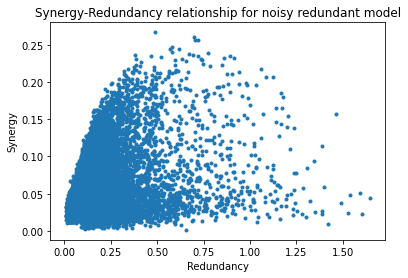

In [35]:
plt.figure()
plt.plot(rezRedLst, rezSynLst, '.')
plt.xlabel('Redundancy')
plt.ylabel('Synergy')
plt.title('Synergy-Redundancy relationship for noisy redundant model')
plt.show()

## Noisy Unique Scenario

We want to check if white noise added to a purely unique information scenario results in correct identification of redundancy

$$X = T + \nu_X$$
$$Y = T + \nu_Y$$
$$Z = \nu_Z$$

where $Y$ is the target of $X$ and $Z$, and

$$T \sim \mathcal{N}(0, 1)$$
$$\nu_X, \nu_Y, \nu_Z \sim \mathcal{N}(0, \sigma)$$

and $\sigma$ is a free parameter, denoting the Noise-To-Signal ratio. So the signal should be a mixture of redundant signal and white noise.

Since the signal is continuous, we bin it using different bin counts.

In [17]:
def gen_data_unq_noisy(n=1000, sigErr=1):
    t = np.random.normal(0,1,n)
    x = t + np.random.normal(0,sigErr,n)
    y = t + np.random.normal(0,sigErr,n)
    z = np.random.normal(0,sigErr,n)
    return x,y,z

In [18]:
rezDFDict = {}
for nBins in range(2, 6):
    gen_data_eff = lambda: gen_data_unq_noisy(n=10000, sigErr=1)
    rezDFDict[nBins] = make_test(gen_data_eff, nBins=nBins, nTest=100)

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.09236932, s2: -0.00000000
shd information: 0.00001662, syn information: 0.00007638
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000599, s2: -0.00000001
shd information: 0.00001664, syn information: 0.00001712
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.07492911, s2: -0.00000000
shd information: 0.00044371, syn information: 0.00030875
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00000935, syn information: 0.00002849
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.07853455, s2: -0.00000000
shd information: 0.00013343, syn infor

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00007098
shd information: 0.00001951, syn information: 0.00007521
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.07512543, s2: -0.00000000
shd information: 0.00005587, syn information: 0.00008792
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00009557, s2: -0.00000000
shd information: 0.00002262, syn information: 0.00011264
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.08211273, s2: -0.00000000
shd information: 0.00012569, syn information: 0.00034978
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00013712, s2: -0.00000000
shd information: 0.00006648, syn info


unq information s1: 0.08207176, s2: -0.00000000
shd information: 0.00016667, syn information: 0.00006857
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00019391, s2: -0.00000000
shd information: 0.00000012, syn information: 0.00004655
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.08982312, s2: -0.00000000
shd information: 0.00001951, syn information: 0.00002222
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00005090
shd information: 0.00004617, syn information: 0.00005038
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.08423573, s2: -0.00000000
shd information: 0.00002263, syn information: 0.00004783
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00010018
shd information: 0.00006649, syn information: 0.00006678
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.07616758, s2: -0.00000000
shd information: 0.00016667, syn information: 0.00008284
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001015, s2: -0.00000000
shd information: 0.00000935, syn information: 0.00001091
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.07846054, s2: -0.00000000
shd information: 0.00001155, syn information: 0.00015366
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00015410, s2: -0.00000000
shd information: 0.00015801, syn information: 0.00015763
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00014070, s2: -0.00000000
shd information: 0.00002597, syn information: 0.00008066
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.07786643, s2: -0.00000000
shd information: 0.00001951, syn information: 0.00018042
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00007698, s2: -0.00000000
shd information: 0.00000104, syn information: 0.00044486
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.08122424, s2: 0.00000000
shd information: 0.00001397, syn information: 0.00004738
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00006082, s2: -0.00000000
shd information: 0.00000566, syn information: 0.00001763
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: 0.12835008, s2: -0.00000000
shd information: 0.00017175, syn information: 0.00054442
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00047387, s2: 0.00006118
shd information: 0.00007125, syn information: 0.00052762
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.12259593, s2: -0.00000000
shd information: 0.00022200, syn information: 0.00068504
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000528, s2: 0.00052509
shd information: 0.00011197, syn information: 0.00045079
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.12186106, s2: -0.00000000
shd information: 0.00028206, syn information: 0.00058974
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwrit


unq information s1: 0.12133767, s2: -0.00000000
shd information: 0.00017659, syn information: 0.00091993
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00056440, s2: 0.00060878
shd information: 0.00009349, syn information: 0.00092134
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.12756587, s2: -0.00000000
shd information: 0.00010061, syn information: 0.00062025
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00008585, s2: 0.00004653
shd information: 0.00007261, syn information: 0.00060228
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.13156583, s2: -0.00000000
shd information: 0.00023629, syn information: 0.00050406
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwrit

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00008861, s2: 0.00010424
shd information: 0.00017605, syn information: 0.00045472
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.13601681, s2: -0.00000000
shd information: 0.00032747, syn information: 0.00070669
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00006018, s2: 0.00024684
shd information: 0.00003819, syn information: 0.00067848
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.13964350, s2: -0.00000000
shd information: 0.00023317, syn information: 0.00048309
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00033244, s2: 0.00049768
shd information: 0.00037520, syn informa


unq information s1: 0.00017604, s2: 0.00000621
shd information: 0.00005746, syn information: 0.00063237
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.13165544, s2: -0.00000000
shd information: 0.00018157, syn information: 0.00078771
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00011988, s2: 0.00004780
shd information: 0.00011331, syn information: 0.00078571
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.12833288, s2: -0.00000000
shd information: 0.00036391, syn information: 0.00063281
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00041962, s2: 0.00011808
shd information: 0.00002219, syn information: 0.00035325
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriti


unq information s1: 0.15066158, s2: 0.00000777
shd information: 0.00046955, syn information: 0.00261267
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00026976, s2: 0.00058578
shd information: 0.00031265, syn information: 0.00333085
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.15228480, s2: 0.00000061
shd information: 0.00030692, syn information: 0.00214478
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00071996, s2: 0.00002435
shd information: 0.00043321, syn information: 0.00224306
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.15126719, s2: 0.00002725
shd information: 0.00038898, syn information: 0.00209891
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting


unq information s1: 0.00002061, s2: 0.00132421
shd information: 0.00036136, syn information: 0.00209890
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.14535310, s2: -0.00000000
shd information: 0.00025472, syn information: 0.00165041
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00020978, s2: 0.00036309
shd information: 0.00020669, syn information: 0.00208730
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.14537875, s2: -0.00000000
shd information: 0.00052923, syn information: 0.00183246
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00026414, s2: 0.00045620
shd information: 0.00066547, syn information: 0.00230990
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriti


unq information s1: 0.00009757, s2: 0.00080410
shd information: 0.00010223, syn information: 0.00311711
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.14561189, s2: 0.00000029
shd information: 0.00049290, syn information: 0.00149850
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00016599, s2: 0.00074707
shd information: 0.00016912, syn information: 0.00249334
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.15510731, s2: 0.00032329
shd information: 0.00007208, syn information: 0.00154651
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00048092, s2: 0.00030247
shd information: 0.00029623, syn information: 0.00193418
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting


unq information s1: 0.00028267, s2: 0.00041470
shd information: 0.00013505, syn information: 0.00222983
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.15209568, s2: 0.00010806
shd information: 0.00030913, syn information: 0.00155457
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00017926, s2: 0.00066402
shd information: 0.00034348, syn information: 0.00276413
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.15253086, s2: 0.00013949
shd information: 0.00009483, syn information: 0.00186004
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00099845, s2: 0.00010747
shd information: 0.00030379, syn information: 0.00228055
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting


unq information s1: 0.15941174, s2: 0.00017392
shd information: 0.00070456, syn information: 0.00294794
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000900, s2: 0.00083542
shd information: 0.00027532, syn information: 0.00214212
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.17138623, s2: 0.00031169
shd information: 0.00190863, syn information: 0.00668982
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00111927, s2: 0.00134383
shd information: 0.00038849, syn information: 0.00596689
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.16717422, s2: 0.00014092
shd information: 0.00118287, syn information: 0.00742175
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting


unq information s1: 0.00174436, s2: 0.00023644
shd information: 0.00039146, syn information: 0.00470982
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.16395692, s2: 0.00016714
shd information: 0.00058988, syn information: 0.00509318
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00066606, s2: 0.00087467
shd information: 0.00031973, syn information: 0.00584258
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.17124538, s2: 0.00041030
shd information: 0.00047978, syn information: 0.00400891
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00139246, s2: 0.00096842
shd information: 0.00057367, syn information: 0.00526291
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.16077978, s2: 0.00032363
shd information: 0.00031151, syn information: 0.00500582
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00071497, s2: 0.00108520
shd information: 0.00052355, syn information: 0.00540449
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.16370724, s2: 0.00022027
shd information: 0.00054107, syn information: 0.00474303
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00123851, s2: 0.00033402
shd information: 0.00033786, syn information: 0.00471563
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.17094310, s2: 0.00062608
shd information: 0.00078609, syn informati


unq information s1: 0.16499106, s2: 0.00009462
shd information: 0.00091374, syn information: 0.00454294
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00031010, s2: 0.00060318
shd information: 0.00022853, syn information: 0.00569877
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.16123706, s2: 0.00000937
shd information: 0.00089293, syn information: 0.00559522
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00027157, s2: 0.00170773
shd information: 0.00040014, syn information: 0.00439308
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.16873870, s2: 0.00001651
shd information: 0.00110503, syn information: 0.00416905
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting


unq information s1: 0.00037443, s2: 0.00062456
shd information: 0.00020983, syn information: 0.00466211
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.15156949, s2: 0.00005930
shd information: 0.00045644, syn information: 0.00610283
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00048746, s2: 0.00108921
shd information: 0.00022815, syn information: 0.00488201
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.17176223, s2: 0.00024756
shd information: 0.00121759, syn information: 0.00502388
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00106760, s2: 0.00101646
shd information: 0.00028213, syn information: 0.00498801
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting

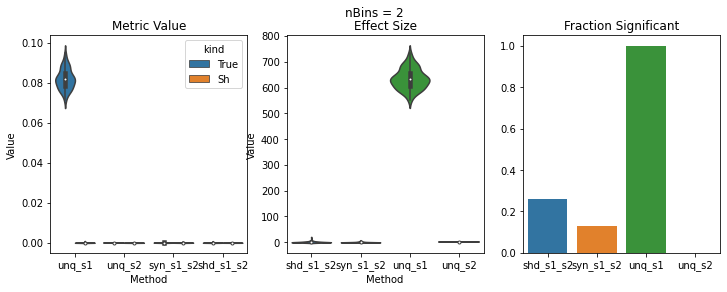

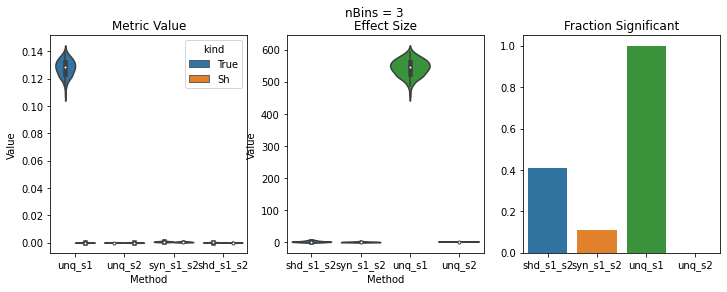

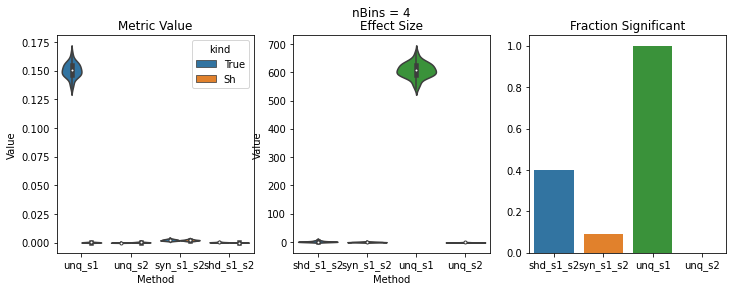

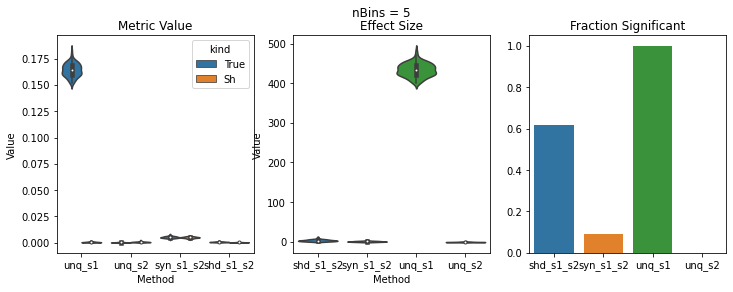

In [19]:
for nBins, rezDF in rezDFDict.items():
    plot_test(rezDF, suptitle='nBins = ' + str(nBins))

## Noisy Redundant Scenario - Discrete Case

It is important to test if false positives are caused by binning, or are an intrinsic property of the noise in the covariate. Here I propose a discretized noisy redundancy model. Instead of added noise, each variable has a random chance to produce the redundant outcome or a purely random outcome.

$$X \sim A_X T + (1 - A_X) \nu_X $$
$$Y \sim A_Y T + (1 - A_Y) \nu_Y $$
$$Z \sim A_Z T + (1 - A_Z) \nu_Z $$

where

$$T, \nu_X, \nu_Y, \nu_Z \sim Ber(0.5) $$
$$A_X \sim Ber(\alpha_X)$$
$$A_Y \sim Ber(\alpha_Y)$$
$$A_Z \sim Ber(\alpha_Z)$$

and $\alpha_X, \alpha_Y, \alpha_Z \in [0, 1]$ are flexible.

So, $\alpha = 0$ means purely noisy signal, and $\alpha=1$ means purely redundant signal.

In [4]:
def bernoulli(n, p):
    return (np.random.uniform(0, 1, n) < p).astype(int)

def gen_discrete_random(nSample, alphaX=0.5, alphaY=0.5, alphaZ=0.5):
    T = bernoulli(nSample, 0.5)
    nuX = bernoulli(nSample, 0.5)
    nuY = bernoulli(nSample, 0.5)
    nuZ = bernoulli(nSample, 0.5)
    aX = bernoulli(nSample, alphaX)
    aY = bernoulli(nSample, alphaY)
    aZ = bernoulli(nSample, alphaZ)
    
    x = aX*T + (1 - aX)*nuX
    y = aY*T + (1 - aY)*nuY
    z = aZ*T + (1 - aZ)*nuZ
    return x,y,z

In [32]:
alphaLst = np.linspace(0, 1, 10)

rezDFDict = {}
for alpha in alphaLst:
    gen_data_eff = lambda: gen_discrete_random(nSample=10000, alphaX=alpha, alphaY=alpha, alphaZ=alpha)
    rezDFDict[alpha] = make_test(gen_data_eff, nBins=None, nTest=100)

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00004636
shd information: 0.00001040, syn information: 0.00001293
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.00003265
shd information: 0.00000003, syn information: 0.00011431
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002547, s2: -0.00000000
shd information: 0.00000048, syn information: 0.00000119
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001955
shd information: 0.00004164, syn information: 0.00004541
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00025862
shd information: 0.00001556, syn infor


unq information s1: -0.00000000, s2: 0.00007461
shd information: 0.00004396, syn information: 0.00016175
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00011437
shd information: 0.00000347, syn information: 0.00006520
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002847, s2: -0.00000000
shd information: 0.00001521, syn information: 0.00007182
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005071, s2: -0.00000000
shd information: 0.00001278, syn information: 0.00002389
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00006774
shd information: 0.00006115, syn information: 0.00006085
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00000078, s2: -0.00000000
shd information: 0.00000068, syn information: 0.00000548
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001360
shd information: 0.00000146, syn information: 0.00000165
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00010374, s2: -0.00000000
shd information: 0.00007437, syn information: 0.00011886
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00019389
shd information: 0.00000380, syn information: 0.00001068
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00003704
shd information: 0.00000828, syn information: 0.00002092
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00024823, s2: -0.00000000
shd information: 0.00006680, syn information: 0.00010663
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000054, s2: -0.00000000
shd information: 0.00000730, syn information: 0.00013150
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00010011
shd information: 0.00019319, syn information: 0.00026816
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001349
shd information: 0.00000428, syn information: 0.00001538
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005081, s2: -0.00000000
shd information: 0.00000014, syn information: 0.00028115
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00002009
shd information: 0.00000244, syn information: 0.00000564
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002759, s2: -0.00000000
shd information: 0.00000420, syn information: 0.00000992
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000294, s2: -0.00000000
shd information: 0.00000109, syn information: 0.00004561
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003290, s2: -0.00000000
shd information: 0.00003307, syn information: 0.00034369
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002365, s2: -0.00000000
shd information: 0.00003605, syn information: 0.00003946
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00004113, s2: -0.00000000
shd information: 0.00001197, syn information: 0.00021351
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00017064, s2: -0.00000000
shd information: 0.00000092, syn information: 0.00011425
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00082753
shd information: 0.00000649, syn information: 0.00007053
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003590, s2: -0.00000000
shd information: 0.00003336, syn information: 0.00003225
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00093653, s2: -0.00000000
shd information: 0.00019281, syn info


unq information s1: 0.00000295, s2: 0.00000364
shd information: 0.00060411, syn information: 0.00058558
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00006590
shd information: 0.00002109, syn information: 0.00011338
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005712, s2: -0.00000000
shd information: 0.00029626, syn information: 0.00038266
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001295, s2: -0.00000000
shd information: 0.00000865, syn information: 0.00001149
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00028600
shd information: 0.00005448, syn information: 0.00009696
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00001040
shd information: 0.00000000, syn information: 0.00006180
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00020879
shd information: 0.00002946, syn information: 0.00002627
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00004152
shd information: 0.00001656, syn information: 0.00003094
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00019953, s2: -0.00000000
shd information: 0.00000345, syn information: 0.00004606
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000047
shd information: 0.00000298, syn information: 0.00009177
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00049144
shd information: 0.00009728, syn information: 0.00028042
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001440, s2: -0.00000000
shd information: 0.00001503, syn information: 0.00001531
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00003178
shd information: 0.00007206, syn information: 0.00007204
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001667, s2: -0.00000000
shd information: 0.00000289, syn information: 0.00024570
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00020919
shd information: 0.00012188, syn information: 0.00012441
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00002740, s2: -0.00000000
shd information: 0.00005051, syn information: 0.00006173
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00071114
shd information: 0.00128963, syn information: 0.00119913
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001245
shd information: 0.00000002, syn information: 0.00011284
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00018168, s2: -0.00000000
shd information: 0.00123965, syn information: 0.00114501
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001079, s2: -0.00000000
shd information: 0.00001501, syn information: 0.00012237
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00001548
shd information: 0.00003682, syn information: 0.00018800
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000890, s2: 0.00000764
shd information: 0.00102351, syn information: 0.00095556
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00005898
shd information: 0.00000481, syn information: 0.00007351
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00097273
shd information: 0.00079873, syn information: 0.00074187
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00003074
shd information: 0.00001618, syn information: 0.00001420
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: 0.00005191, s2: -0.00000000
shd information: 0.00000124, syn information: 0.00004786
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00035156
shd information: 0.00105142, syn information: 0.00096155
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00024344, s2: -0.00000000
shd information: 0.00002885, syn information: 0.00003510
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00132766, s2: -0.00000000
shd information: 0.00082517, syn information: 0.00078983
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00004830, s2: -0.00000000
shd information: 0.00000003, syn information: 0.00005553
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00006030, s2: -0.00000000
shd information: 0.00000592, syn information: 0.00003596
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00106634, s2: -0.00000000
shd information: 0.00156699, syn information: 0.00138777
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00002356
shd information: 0.00000416, syn information: 0.00005443
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00255797
shd information: 0.00105787, syn information: 0.00102152
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001317
shd information: 0.00000323, syn information: 0.00021733
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00315638, s2: -0.00000000
shd information: 0.00671013, syn information: 0.00527578
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00037777
shd information: 0.00001164, syn information: 0.00019671
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00246060, s2: -0.00000000
shd information: 0.00514598, syn information: 0.00385861
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00021288
shd information: 0.00000073, syn information: 0.00003882
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00059223
shd information: 0.00844051, syn information: 0.00666237
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00017448
shd information: 0.00000014, syn information: 0.00000724
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00010648, s2: 0.00002357
shd information: 0.00801361, syn information: 0.00682250
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000893
shd information: 0.00002596, syn information: 0.00006375
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00207692
shd information: 0.01127257, syn information: 0.00905419
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003627, s2: -0.00000000
shd information: 0.00000496, syn information: 0.00024954
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00007153
shd information: 0.00003282, syn information: 0.00025127
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00239997
shd information: 0.00887506, syn information: 0.00665557
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00004796
shd information: 0.00016677, syn information: 0.00012378
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00323586, s2: -0.00000000
shd information: 0.00745381, syn information: 0.00597427
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002583, s2: -0.00000000
shd information: 0.00007156, syn information: 0.00010453
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00002173, s2: -0.00000000
shd information: 0.00000228, syn information: 0.00012130
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00135779
shd information: 0.00709356, syn information: 0.00549075
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00009146, s2: -0.00000000
shd information: 0.00000792, syn information: 0.00003038
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00048941
shd information: 0.00828681, syn information: 0.00670937
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00021517, s2: -0.00000000
shd information: 0.00000150, syn information: 0.00068122
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00007639
shd information: 0.00001010, syn information: 0.00002088
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00414747, s2: -0.00000000
shd information: 0.00819738, syn information: 0.00647397
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00050091
shd information: 0.00002085, syn information: 0.00014655
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00214594, s2: -0.00000000
shd information: 0.00868099, syn information: 0.00700110
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00007996, s2: -0.00000000
shd information: 0.00004668, syn information: 0.00028003
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00580783, s2: -0.00000000
shd information: 0.02569979, syn information: 0.01696915
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000337
shd information: 0.00000025, syn information: 0.00034212
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00361783
shd information: 0.02633790, syn information: 0.01763032
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00023360, s2: -0.00000000
shd information: 0.00009301, syn information: 0.00018474
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00330079, s2: -0.00000000
shd information: 0.02247552, syn information: 0.01515482
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00491920
shd information: 0.02304253, syn information: 0.01609880
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00007908, s2: -0.00000000
shd information: 0.00000134, syn information: 0.00032978
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00295795, s2: -0.00000000
shd information: 0.02402260, syn information: 0.01590296
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00006251
shd information: 0.00000930, syn information: 0.00001456
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00066296
shd information: 0.03149593, syn information: 0.02162166
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00320512, s2: -0.00000000
shd information: 0.02864337, syn information: 0.01923925
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000584
shd information: 0.00012362, syn information: 0.00008388
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00325641
shd information: 0.02553971, syn information: 0.01770398
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00036844, s2: -0.00000000
shd information: 0.00013614, syn information: 0.00035378
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00117459
shd information: 0.02528477, syn information: 0.01734973
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00378363
shd information: 0.02609007, syn information: 0.01768933
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00002941
shd information: 0.00000012, syn information: 0.00005041
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00555671
shd information: 0.02630873, syn information: 0.01753818
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00015292
shd information: 0.00000939, syn information: 0.00022948
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00303688, s2: -0.00000000
shd information: 0.02396596, syn information: 0.01651329
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00000903
shd information: 0.00000923, syn information: 0.00005479
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00113668, s2: -0.00000000
shd information: 0.06925518, syn information: 0.03756904
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002262, s2: -0.00000000
shd information: 0.00000518, syn information: 0.00009018
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00403370, s2: -0.00000000
shd information: 0.06904555, syn information: 0.03799109
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003516, s2: -0.00000000
shd information: 0.00010472, syn information: 0.00005692
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00000303, s2: -0.00000000
shd information: 0.00000054, syn information: 0.00011364
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01485948
shd information: 0.06390383, syn information: 0.03241764
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00024804
shd information: 0.00000230, syn information: 0.00020490
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00285594
shd information: 0.06489623, syn information: 0.03647857
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00003390
shd information: 0.00002298, syn information: 0.00036486
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00003568
shd information: 0.00005854, syn information: 0.00003128
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.01217519, s2: -0.00000000
shd information: 0.06454761, syn information: 0.03375472
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003552, s2: -0.00000000
shd information: 0.00000191, syn information: 0.00000798
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00707611
shd information: 0.06638517, syn information: 0.03701995
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00016468
shd information: 0.00000144, syn information: 0.00003647
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00024827, s2: -0.00000000
shd information: 0.00004234, syn information: 0.00002306
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00657680, s2: -0.00000000
shd information: 0.06774518, syn information: 0.03655937
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00011836, s2: -0.00000000
shd information: 0.00001174, syn information: 0.00003956
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00722868, s2: -0.00000000
shd information: 0.06840238, syn information: 0.03601606
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00011525
shd information: 0.00000018, syn information: 0.00002217
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00011400
shd information: 0.00000054, syn information: 0.00017073
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00048110, s2: 0.00170730
shd information: 0.15368967, syn information: 0.06285284
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00027602
shd information: 0.00008743, syn information: 0.00020528
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00756265
shd information: 0.13628351, syn information: 0.05705495
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000221, s2: -0.00000000
shd information: 0.00000936, syn information: 0.00001818
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.01168209, s2: -0.00000000
shd information: 0.13916310, syn information: 0.05920072
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00014549
shd information: 0.00019192, syn information: 0.00012590
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.01124128, s2: -0.00000000
shd information: 0.13998439, syn information: 0.05771716
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000244, s2: -0.00000000
shd information: 0.00000047, syn information: 0.00010185
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01407268
shd information: 0.14211335, syn info


unq information s1: -0.00000000, s2: 0.00010318
shd information: 0.00000139, syn information: 0.00017101
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00686346, s2: -0.00000000
shd information: 0.14541175, syn information: 0.05889908
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00004503
shd information: 0.00001133, syn information: 0.00020412
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00058990, s2: 0.00118428
shd information: 0.14748737, syn information: 0.06350890
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000546
shd information: 0.00000384, syn information: 0.00000146
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri

Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00766256, s2: -0.00000000
shd information: 0.14182440, syn information: 0.06204569
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00013493
shd information: 0.00006605, syn information: 0.00002526
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00807915
shd information: 0.13810190, syn information: 0.06028599
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00015195
shd information: 0.00007200, syn information: 0.00006507
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00868864
shd information: 0.14984902, syn info


unq information s1: 0.00000720, s2: -0.00000000
shd information: 0.00000353, syn information: 0.00029735
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01635614
shd information: 0.28554495, syn information: 0.08486644
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001926
shd information: 0.00000026, syn information: 0.00054827
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01211096
shd information: 0.27693469, syn information: 0.08375446
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00018147, s2: -0.00000000
shd information: 0.00000465, syn information: 0.00006712
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00008322, s2: -0.00000000
shd information: 0.00000109, syn information: 0.00005105
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01092968
shd information: 0.27938774, syn information: 0.08119448
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000269, s2: -0.00000000
shd information: 0.00001655, syn information: 0.00007051
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.01846080, s2: -0.00000000
shd information: 0.27438560, syn information: 0.07736466
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00003268
shd information: 0.00000300, syn information: 0.00003073
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00016631
shd information: 0.00003724, syn information: 0.00001208
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00283819, s2: 0.00036840
shd information: 0.29825120, syn information: 0.08852335
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00012986, s2: -0.00000000
shd information: 0.00000107, syn information: 0.00010799
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.01911723, s2: -0.00000000
shd information: 0.26197231, syn information: 0.07683479
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00014467
shd information: 0.00000487, syn information: 0.00013916
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00006450
shd information: 0.00000198, syn information: 0.00039706
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01053469
shd information: 0.27846178, syn information: 0.08118489
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00012086, s2: -0.00000000
shd information: 0.00000421, syn information: 0.00015301
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00323062
shd information: 0.28108986, syn information: 0.08752320
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00012799
shd information: 0.00000141, syn information: 0.00017326
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: 0.00001215, s2: -0.00000000
shd information: 0.00000292, syn information: 0.00000444
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00195654, s2: 0.00077763
shd information: 0.52594430, syn information: 0.08995107
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00016691, s2: -0.00000000
shd information: 0.00013301, syn information: 0.00006509
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00218644, s2: -0.00000000
shd information: 0.51913409, syn information: 0.09495583
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00012504, s2: -0.00000000
shd information: 0.00004634, syn information: 0.00008622
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00004333
shd information: 0.00002759, syn information: 0.00005957
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00173078, s2: 0.00144303
shd information: 0.50502543, syn information: 0.09031063
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00016823, s2: -0.00000000
shd information: 0.00003536, syn information: 0.00009159
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00625080
shd information: 0.52114294, syn information: 0.08634285
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003033, s2: -0.00000000
shd information: 0.00000283, syn information: 0.00002396
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00005956
shd information: 0.00002774, syn information: 0.00002139
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00780956
shd information: 0.50952256, syn information: 0.08694091
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00005844, s2: -0.00000000
shd information: 0.00021232, syn information: 0.00002198
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00047421, s2: 0.01740178
shd information: 0.50835988, syn information: 0.08691297
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000935, s2: -0.00000000
shd information: 0.00000056, syn information: 0.00006018
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00013926
shd information: 0.00008406, syn information: 0.00045752
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01025152
shd information: 0.49619507, syn information: 0.08601645
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00013249
shd information: 0.00000108, syn information: 0.00016832
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00370484
shd information: 0.51103350, syn information: 0.08776764
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00006473, s2: -0.00000000
shd information: 0.00011061, syn information: 0.00018324
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.00006854
shd information: 0.00001053, syn information: 0.00010955
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99998338, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00000947, syn information: -0.00000001
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99998474, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.00000000
shd information: 0.00002245, syn information: -0.00000001
Adding data with properties: 3 processes, 10000 samples, 1 replications
over


unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00005585, syn information: -0.00000001
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99999712, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00001394, syn information: -0.00000001
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99998197, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.00000000
shd information: 0.00012522, syn information: -0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
over


unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00006647, syn information: -0.00000002
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99999815, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000002, s2: 0.00000002
shd information: 0.00000183, syn information: -0.00000002
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000001, s2: -0.00000001
shd information: 0.99994666, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00016831, syn information: -0.00000001
Adding data with properties: 3 processes, 10000 samples, 1 replications
over


unq information s1: 0.00000000, s2: 0.00000000
shd information: 0.00008711, syn information: -0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99985862, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00012187, syn information: -0.00000002
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99999585, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00014970, syn information: -0.00000001
Adding data with properties: 3 processes, 10000 samples, 1 replications
over


unq information s1: -0.00000000, s2: -0.00000000
shd information: 0.99999859, syn information: 0.00000000
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.00005092, syn information: -0.00000001


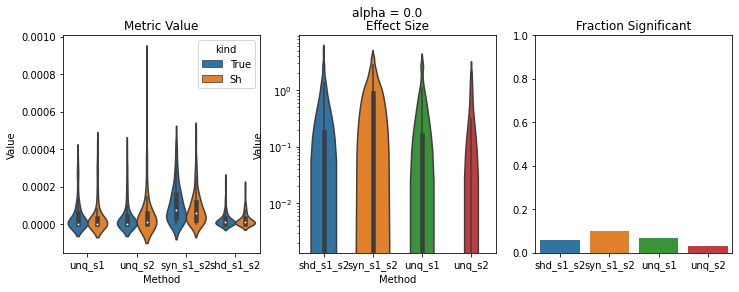

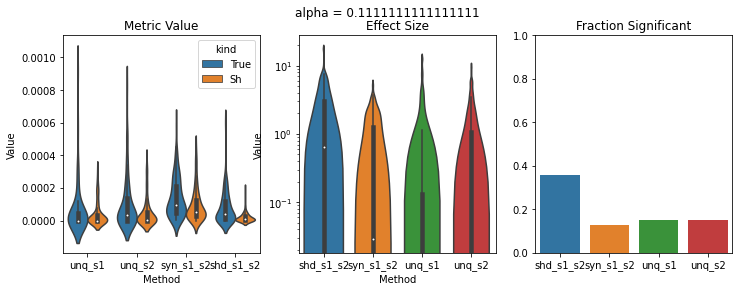

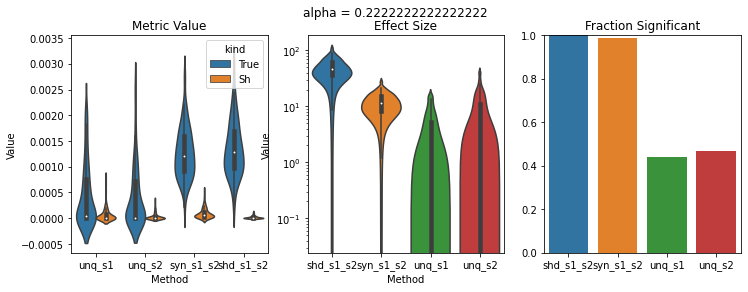

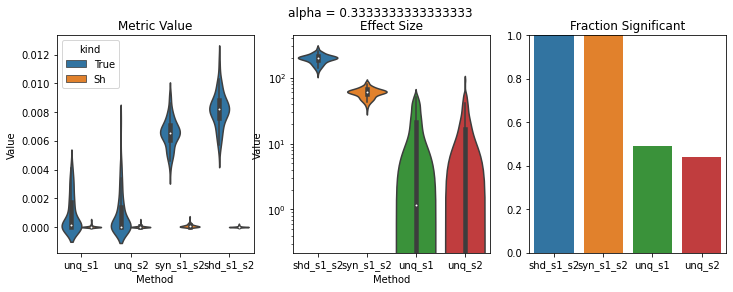

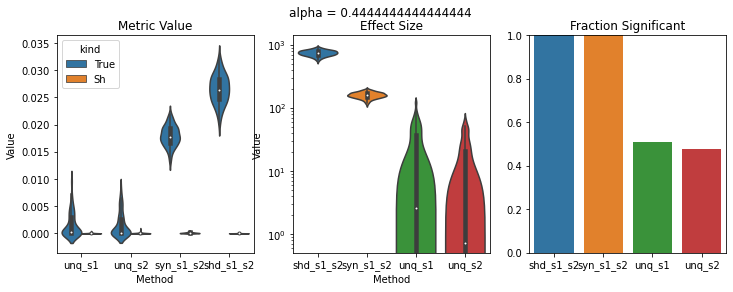

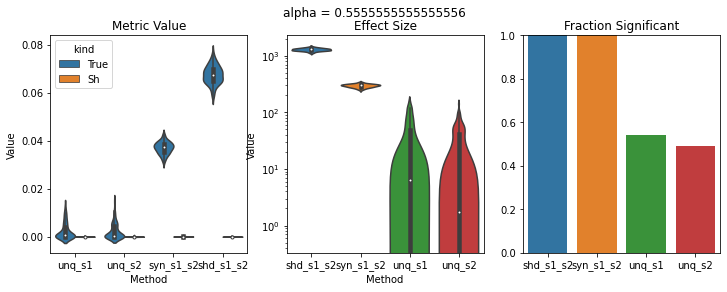

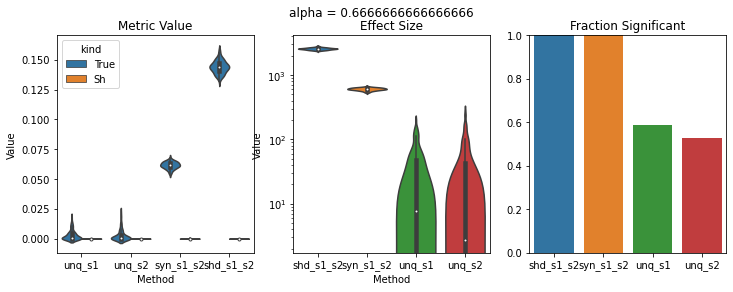

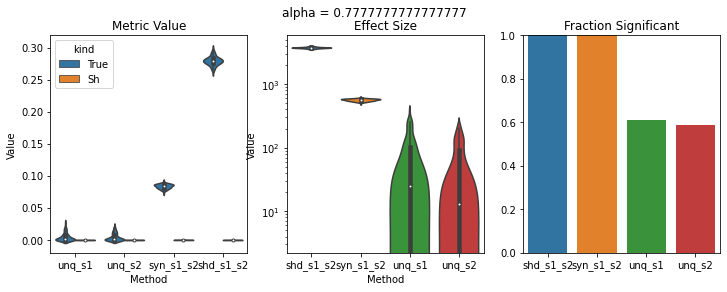

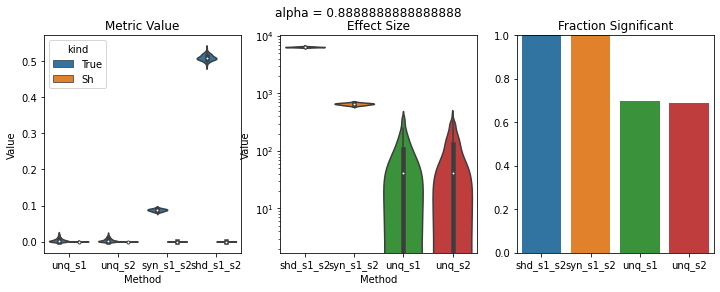

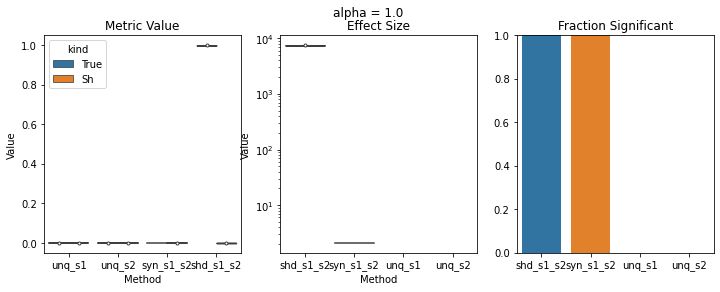

In [33]:
for pAlpha, rezDF in rezDFDict.items():
    plot_test(rezDF, suptitle='alpha = ' + str(pAlpha), logEff=True)

### Testing Asymptotic behaviour

In [5]:
nSampleLst = (10**np.linspace(2, 5, 10)).astype(int)

rezDFDict = {}
for nSample in nSampleLst:
    gen_data_eff = lambda: gen_discrete_random(nSample=nSample, alphaX=0.9, alphaY=0.9, alphaZ=0.9)
    rezDFDict[nSample] = make_test(gen_data_eff, nBins=None, nTest=100)

Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: 0.10976268, s2: -0.00000000
shd information: 0.54951945, syn information: 0.05595863
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: 0.00131228, s2: -0.00000000
shd information: 0.00135980, syn information: 0.00024346
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: 0.00778203, s2: 0.04032432
shd information: 0.49275119, syn information: 0.12507110
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: 0.00259945, s2: -0.00000000
shd information: 0.00462901, syn information: 0.00053024
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: 0.11427939, s2: -0.00000000
shd information: 0.60637603, syn information: 0.


unq information s1: 0.08016272, s2: 0.01847059
shd information: 0.48622885, syn information: 0.06254699
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01362874
shd information: 0.00042047, syn information: 0.01373341
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: 0.11382627, s2: -0.00000000
shd information: 0.41307137, syn information: 0.04885097
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00178923
shd information: 0.00157435, syn information: 0.02450758
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05306638
shd information: 0.39268264, syn information: 0.10594169
Adding data with properties: 3 processes, 100 samples, 1 replications
overwriting exist

Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.00000001, s2: 0.00000001
shd information: 0.55182355, syn information: 0.13263140
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.00341041, s2: -0.00000000
shd information: 0.00143526, syn information: 0.00226124
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.01763770, s2: 0.00361895
shd information: 0.48729387, syn information: 0.07891857
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00181003
shd information: 0.00088961, syn information: 0.00054506
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01664976
shd information: 0.53400733, syn information: 0.0

Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.00036788, s2: -0.00000000
shd information: 0.00038807, syn information: 0.00015107
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.00065673, s2: 0.04369444
shd information: 0.45290521, syn information: 0.06955395
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00060077
shd information: 0.00205992, syn information: 0.00600048
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.03898854, s2: -0.00000000
shd information: 0.49607885, syn information: 0.06658675
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.00193520, s2: -0.00000000
shd information: 0.00757343, syn information: 0.


unq information s1: 0.02275467, s2: 0.03164772
shd information: 0.54630491, syn information: 0.07269151
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.00007303, s2: -0.00000000
shd information: 0.00018926, syn information: 0.00200302
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: 0.01607156, s2: 0.01572804
shd information: 0.56501455, syn information: 0.11066240
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00478734
shd information: 0.00014109, syn information: 0.01828380
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06377198
shd information: 0.53832592, syn information: 0.07577221
Adding data with properties: 3 processes, 215 samples, 1 replications
overwriting existi


unq information s1: 0.03095925, s2: 0.00534792
shd information: 0.51647372, syn information: 0.08749089
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: 0.00082370, s2: -0.00000000
shd information: 0.00005741, syn information: 0.00273371
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03585840
shd information: 0.53467424, syn information: 0.06883632
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00139816
shd information: 0.00021224, syn information: 0.00123907
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06239806
shd information: 0.58358684, syn information: 0.05684100
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting exist

Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: 0.00102452, s2: -0.00000000
shd information: 0.00001228, syn information: 0.00289437
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: 0.02504508, s2: 0.02542859
shd information: 0.50271424, syn information: 0.06172486
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00002674
shd information: 0.00009190, syn information: 0.00132623
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: 0.01783528, s2: 0.00411568
shd information: 0.53671913, syn information: 0.07825570
Adding data with properties: 3 processes, 464 samples, 1 replications
overwriting existing data

unq information s1: 0.00007292, s2: 0.00003092
shd information: 0.00378186, syn information: 0.00


unq information s1: 0.03939648, s2: -0.00000000
shd information: 0.53721402, syn information: 0.07908295
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00018691, s2: -0.00000000
shd information: 0.00001388, syn information: 0.00069026
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03154492, s2: -0.00000000
shd information: 0.50334571, syn information: 0.07728272
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00157886, s2: -0.00000000
shd information: 0.00023439, syn information: 0.00096392
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06696614
shd information: 0.53276947, syn information: 0.05673115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.05033121, s2: -0.00000000
shd information: 0.53038113, syn information: 0.03944635
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00016676
shd information: 0.00004873, syn information: 0.00364394
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01411995
shd information: 0.49663213, syn information: 0.07715045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003908, s2: -0.00000000
shd information: 0.00005306, syn information: 0.00013895
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02846356
shd information: 0.54879444, syn information: 0.07777594
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.01369506, s2: 0.01492854
shd information: 0.56550565, syn information: 0.07658691
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00011723, s2: -0.00000000
shd information: 0.00007180, syn information: 0.00047750
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00422635, s2: 0.03054510
shd information: 0.50048239, syn information: 0.07236950
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00132332
shd information: 0.00007342, syn information: 0.00138045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03092856, s2: -0.00000000
shd information: 0.50000406, syn information: 0.07015051
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.02579194
shd information: 0.53754174, syn information: 0.08739673
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000560
shd information: 0.00000000, syn information: 0.00050522
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.03772008, s2: -0.00000000
shd information: 0.50142202, syn information: 0.07163586
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00037267
shd information: 0.00001530, syn information: 0.00070945
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00776886, s2: 0.00005718
shd information: 0.55090847, syn information: 0.08473220
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting 


unq information s1: 0.00002154, s2: -0.00000000
shd information: 0.00006952, syn information: 0.00004552
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00234016, s2: 0.05230087
shd information: 0.54911743, syn information: 0.07328981
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00012888
shd information: 0.00000576, syn information: 0.00066242
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00419372, s2: 0.00811588
shd information: 0.53830818, syn information: 0.07757155
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00006514, s2: -0.00000000
shd information: 0.00004125, syn information: 0.00075667
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting e


unq information s1: 0.00006525, s2: -0.00000000
shd information: 0.00007679, syn information: 0.00002123
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00573493, s2: 0.00930544
shd information: 0.51782520, syn information: 0.07744176
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000904
shd information: 0.00000320, syn information: 0.00127200
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.02795300, s2: -0.00000000
shd information: 0.51318067, syn information: 0.07900938
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00021969
shd information: 0.00021460, syn information: 0.00364929
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting 


unq information s1: 0.00719773, s2: 0.02077550
shd information: 0.53300203, syn information: 0.07987466
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00011124, s2: -0.00000000
shd information: 0.00105530, syn information: 0.00037446
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.01111288, s2: 0.00192120
shd information: 0.54006019, syn information: 0.08718196
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00009082
shd information: 0.00001567, syn information: 0.00060566
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00697974, s2: 0.00495459
shd information: 0.53088127, syn information: 0.08124144
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting ex


unq information s1: 0.00007253, s2: -0.00000000
shd information: 0.00020061, syn information: 0.00003348
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: 0.00249924, s2: 0.00120752
shd information: 0.55003554, syn information: 0.09109134
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00038900
shd information: 0.00005868, syn information: 0.00221211
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00295660
shd information: 0.54995696, syn information: 0.08413026
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00047033
shd information: 0.00008958, syn information: 0.00078728
Adding data with properties: 3 processes, 2154 samples, 1 replications
overwriting 


unq information s1: 0.00000588, s2: -0.00000000
shd information: 0.00003051, syn information: 0.00032969
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00041080, s2: 0.01639786
shd information: 0.53348782, syn information: 0.08225589
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00005624, s2: -0.00000000
shd information: 0.00000025, syn information: 0.00023375
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00510053, s2: 0.00751431
shd information: 0.52799283, syn information: 0.08527170
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00004246
shd information: 0.00001178, syn information: 0.00001724
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting e


unq information s1: 0.00901531, s2: -0.00000000
shd information: 0.53579235, syn information: 0.07812327
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00008052
shd information: 0.00006357, syn information: 0.00032138
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.01467519, s2: 0.00008435
shd information: 0.53655725, syn information: 0.08761801
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00001849, s2: -0.00000000
shd information: 0.00000969, syn information: 0.00017440
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00544149, s2: -0.00000000
shd information: 0.52610584, syn information: 0.08380977
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting 


unq information s1: 0.03366162, s2: -0.00000000
shd information: 0.53323492, syn information: 0.07258333
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00026997, s2: -0.00000000
shd information: 0.00015935, syn information: 0.00022559
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00422140, s2: 0.00001329
shd information: 0.54730250, syn information: 0.09416126
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.00033660, s2: -0.00000000
shd information: 0.00013057, syn information: 0.00015487
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting existing data

unq information s1: 0.01133531, s2: -0.00000000
shd information: 0.54556425, syn information: 0.08736260
Adding data with properties: 3 processes, 4641 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.01223354
shd information: 0.53515555, syn information: 0.08208105
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00004689, s2: -0.00000000
shd information: 0.00000650, syn information: 0.00004889
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00404209, s2: 0.00007795
shd information: 0.55981970, syn information: 0.08800643
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00003180
shd information: 0.00000351, syn information: 0.00005043
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00100997, s2: -0.00000000
shd information: 0.55451429, syn information: 0.08598035
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: 0.00000054, s2: 0.00000007
shd information: 0.00002979, syn information: 0.00030624
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01908460
shd information: 0.54453040, syn information: 0.08442695
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00003631, s2: -0.00000000
shd information: 0.00004150, syn information: 0.00002388
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00751088
shd information: 0.54707227, syn information: 0.08256237
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001097
shd information: 0.00011095, syn information: 0.00000705
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: 0.00004324, s2: -0.00000000
shd information: 0.00000879, syn information: 0.00005654
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00930724, s2: 0.00022073
shd information: 0.54033943, syn information: 0.08125384
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00011989
shd information: 0.00001129, syn information: 0.00010624
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00591445, s2: 0.00042371
shd information: 0.53818567, syn information: 0.08693119
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001425, s2: -0.00000000
shd information: 0.00015542, syn information: 0.00006906
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwrit


unq information s1: 0.00000033, s2: -0.00000000
shd information: 0.00000013, syn information: 0.00002325
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.01531934, s2: -0.00000000
shd information: 0.54801878, syn information: 0.08157084
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001698, s2: -0.00000000
shd information: 0.00001061, syn information: 0.00005711
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: 0.00039810, s2: 0.00961501
shd information: 0.53956041, syn information: 0.08371009
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00013277
shd information: 0.00009230, syn information: 0.00002196
Adding data with properties: 3 processes, 10000 samples, 1 replications
overwri


unq information s1: 0.01034666, s2: -0.00000000
shd information: 0.53949167, syn information: 0.08714431
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00004466, s2: -0.00000000
shd information: 0.00003298, syn information: 0.00004187
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00235065, s2: 0.00115725
shd information: 0.54412862, syn information: 0.08706395
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00000364, s2: -0.00000000
shd information: 0.00000006, syn information: 0.00001128
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00852891, s2: -0.00000000
shd information: 0.54923343, syn information: 0.08721287
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwri


unq information s1: 0.01151576, s2: -0.00000000
shd information: 0.54211043, syn information: 0.08618618
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00002739, s2: -0.00000000
shd information: 0.00002059, syn information: 0.00000320
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00386740, s2: 0.00196380
shd information: 0.54236097, syn information: 0.08779026
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00005019
shd information: 0.00000001, syn information: 0.00017492
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.01516714, s2: -0.00000000
shd information: 0.53740368, syn information: 0.08245438
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwri


unq information s1: 0.00684977, s2: -0.00000000
shd information: 0.55079095, syn information: 0.08136689
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00013583, s2: -0.00000000
shd information: 0.00002857, syn information: 0.00013541
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02152598
shd information: 0.53506208, syn information: 0.07812531
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00000281, s2: -0.00000000
shd information: 0.00003615, syn information: 0.00001116
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00631646
shd information: 0.53696381, syn information: 0.08489759
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwr

Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000845
shd information: 0.00003913, syn information: 0.00000251
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00074347, s2: 0.00364909
shd information: 0.54442129, syn information: 0.08676011
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00002853
shd information: 0.00000000, syn information: 0.00005512
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00090938, s2: 0.00242377
shd information: 0.54957576, syn information: 0.09092910
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001077
shd information: 0.00000003, syn inform


unq information s1: -0.00000000, s2: 0.00001807
shd information: 0.00015324, syn information: 0.00000928
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00055335, s2: 0.00344286
shd information: 0.53605166, syn information: 0.08848238
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00000390, s2: -0.00000000
shd information: 0.00000870, syn information: 0.00005031
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00880705, s2: -0.00000000
shd information: 0.53459683, syn information: 0.08744777
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwriting existing data

unq information s1: 0.00000496, s2: -0.00000000
shd information: 0.00000354, syn information: 0.00000122
Adding data with properties: 3 processes, 21544 samples, 1 replications
overwri


unq information s1: 0.00198753, s2: 0.00051030
shd information: 0.54664821, syn information: 0.08715273
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00000178, s2: -0.00000000
shd information: 0.00000001, syn information: 0.00000605
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00822237
shd information: 0.54436144, syn information: 0.08363339
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00000573, s2: -0.00000000
shd information: 0.00000109, syn information: 0.00006469
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00786634
shd information: 0.54619213, syn information: 0.08683866
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwri


unq information s1: 0.00234295, s2: -0.00000000
shd information: 0.55342553, syn information: 0.08836600
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00000022, s2: -0.00000000
shd information: 0.00000220, syn information: 0.00005083
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00274343
shd information: 0.54761622, syn information: 0.08911329
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00002140, s2: -0.00000000
shd information: 0.00006810, syn information: 0.00000501
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00033102, s2: 0.00515418
shd information: 0.54481643, syn information: 0.08894116
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwri


unq information s1: -0.00000000, s2: 0.00256305
shd information: 0.54355330, syn information: 0.08692570
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00002478
shd information: 0.00000476, syn information: 0.00002264
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00514812, s2: -0.00000000
shd information: 0.54222163, syn information: 0.08722118
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00010396
shd information: 0.00003714, syn information: 0.00004243
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00200476
shd information: 0.53560524, syn information: 0.08975159
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwr


unq information s1: 0.00272721, s2: -0.00000000
shd information: 0.54563393, syn information: 0.08766600
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00001392
shd information: 0.00001730, syn information: 0.00004884
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00944578
shd information: 0.54103340, syn information: 0.08293840
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00000023, s2: -0.00000000
shd information: 0.00000209, syn information: 0.00002393
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.01229253, s2: -0.00000000
shd information: 0.54373435, syn information: 0.08442954
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwr


unq information s1: -0.00000000, s2: 0.01215619
shd information: 0.54281603, syn information: 0.08302807
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00000905, s2: -0.00000000
shd information: 0.00001396, syn information: 0.00001174
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00432817, s2: 0.00029333
shd information: 0.54303466, syn information: 0.08670807
Adding data with properties: 3 processes, 46415 samples, 1 replications
overwriting existing data

unq information s1: 0.00001818, s2: -0.00000000
shd information: 0.00000041, syn information: 0.00002793
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00133115
shd information: 0.54436201, syn information: 0.08974402
Adding data with properties: 3 processes, 100000 samples, 1 replications
overw


unq information s1: -0.00000000, s2: 0.00470057
shd information: 0.54263946, syn information: 0.08825412
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000873
shd information: 0.00000845, syn information: 0.00000328
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00051942, s2: 0.00015820
shd information: 0.54800648, syn information: 0.08852684
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000250
shd information: 0.00000005, syn information: 0.00001300
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00071422, s2: 0.00133308
shd information: 0.54986886, syn information: 0.09052124
Adding data with properties: 3 processes, 100000 samples, 1 replications
ove


unq information s1: 0.00264501, s2: 0.00028172
shd information: 0.54872897, syn information: 0.08741535
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000700
shd information: 0.00001020, syn information: 0.00002318
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00103448, s2: 0.00182776
shd information: 0.54719485, syn information: 0.08733275
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000268, s2: -0.00000000
shd information: 0.00000010, syn information: 0.00002110
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00152844, s2: -0.00000000
shd information: 0.54614862, syn information: 0.08682018
Adding data with properties: 3 processes, 100000 samples, 1 replications
ove


unq information s1: 0.00131311, s2: 0.00047765
shd information: 0.54172508, syn information: 0.08767138
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000646
shd information: 0.00000854, syn information: 0.00000028
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00585054, s2: -0.00000000
shd information: 0.54754411, syn information: 0.08653177
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000122
shd information: 0.00000974, syn information: 0.00000831
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00053280, s2: 0.00125358
shd information: 0.54561477, syn information: 0.08740958
Adding data with properties: 3 processes, 100000 samples, 1 replications
ove


unq information s1: 0.00421996, s2: -0.00000000
shd information: 0.54216499, syn information: 0.08951917
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00000178
shd information: 0.00000001, syn information: 0.00000722
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00214352
shd information: 0.54520642, syn information: 0.08812828
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000028, s2: -0.00000000
shd information: 0.00000004, syn information: 0.00000047
Adding data with properties: 3 processes, 100000 samples, 1 replications
overwriting existing data

unq information s1: 0.00065358, s2: 0.00076086
shd information: 0.54128846, syn information: 0.08902104
Adding data with properties: 3 processes, 100000 samples, 1 replications
ov

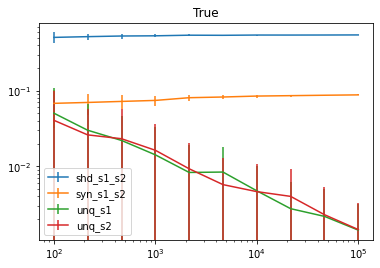

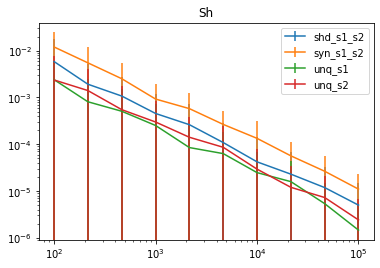

In [11]:
for kind in ['True', 'Sh']:
    muTrueDict = defaultdict(list)
    stdTrueDict = defaultdict(list)

    for nSample, df in rezDFDict.items():
        for method in sorted(set(df['Method'])):
            dfMethod = df[df['Method'] == method]
            dfMethodTrue = dfMethod[dfMethod['kind'] == kind]

            muTrueDict[method] += [np.mean(dfMethodTrue['Value'])]
            stdTrueDict[method] += [np.std(dfMethodTrue['Value'])]


    plt.figure()

    for method, muTrueLst in muTrueDict.items():
        plt.errorbar(nSampleLst, muTrueLst, stdTrueDict[method], label=method)

    plt.xscale('log')
    plt.yscale('log')
    plt.legend()
    plt.title(kind)
    plt.show()

### Test relationship of synergy and redundancy for fixed data size

In [24]:
rezSynLst = []
rezRedLst = []

for nTest in range(20000):
    alphaX, alphaY, alphaZ = np.random.uniform(0.6, 1, 3)
    x,y,z = gen_discrete_random(nSample=1000, alphaX=alphaX, alphaY=alphaY, alphaZ=alphaZ)
    rez = pid(np.array([x,y,z]))
    rezSynLst += [rez['syn_s1_s2']]
    rezRedLst += [rez['shd_s1_s2']]

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00471497
shd information: 0.35379047, syn information: 0.06445564
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.46042611
shd information: 0.48034018, syn information: 0.01108168
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01736612
shd information: 0.32256867, syn information: 0.08275544
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.32521608
shd information: 0.51647312, syn information: 0.04534347
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12293920
shd information: 0.12870383, syn informati


unq information s1: -0.00000000, s2: 0.30873322
shd information: 0.43387783, syn information: 0.01589676
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07559069
shd information: 0.35906257, syn information: 0.13858875
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13531752, s2: -0.00000000
shd information: 0.62695519, syn information: 0.11785293
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21715123, s2: -0.00000000
shd information: 0.12747808, syn information: 0.00232845
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25111037
shd information: 0.32953150, syn information: 0.01089294
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.12417347, s2: -0.00000000
shd information: 0.15724762, syn information: 0.01819877
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04933424, s2: -0.00000000
shd information: 0.14245156, syn information: 0.06358848
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14327866
shd information: 0.14477619, syn information: 0.00857399
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04961376
shd information: 0.38287239, syn information: 0.08967426
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25786669, s2: -0.00000000
shd information: 0.24536478, syn information: 0.03287121
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.16869709, s2: -0.00000000
shd information: 0.23437487, syn information: 0.00064388
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14461548
shd information: 0.20692166, syn information: 0.02640035
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.44041854, s2: -0.00000000
shd information: 0.33194008, syn information: 0.00427999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01039461, s2: -0.00000000
shd information: 0.57653992, syn information: 0.00039077
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16782697
shd information: 0.31534940, syn information: 0.00656502
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.29652186
shd information: 0.25836565, syn information: 0.01847803
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01238440
shd information: 0.14735955, syn information: 0.06505452
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.32102195
shd information: 0.35627867, syn information: 0.05345003
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08190616, s2: -0.00000000
shd information: 0.09881209, syn information: 0.01485392
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01618018
shd information: 0.26425189, syn informati


unq information s1: 0.00802150, s2: 0.00214736
shd information: 0.17816573, syn information: 0.07944689
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00772393, s2: -0.00000000
shd information: 0.40535550, syn information: 0.06214274
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22717224, s2: -0.00000000
shd information: 0.34699126, syn information: 0.02868236
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17745659
shd information: 0.51379258, syn information: 0.00752545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06897627
shd information: 0.10724232, syn information: 0.03106389
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.08017840, s2: -0.00000000
shd information: 0.39987060, syn information: 0.03253861
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12514557
shd information: 0.29845845, syn information: 0.01107444
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18440007
shd information: 0.08818736, syn information: 0.00010047
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07441545
shd information: 0.15262114, syn information: 0.03632201
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04632870
shd information: 0.32413351, syn information: 0.09053231
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00523807, s2: 0.00178687
shd information: 0.48623878, syn information: 0.16377813
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03944732
shd information: 0.20606462, syn information: 0.02118919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05509906, s2: -0.00000000
shd information: 0.16682513, syn information: 0.05246715
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24337947
shd information: 0.31095567, syn information: 0.03878170
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09101446
shd information: 0.45931792, syn information: 0.03207181
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.05512058, s2: -0.00000000
shd information: 0.47616130, syn information: 0.09622031
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14325778, s2: -0.00000000
shd information: 0.37807681, syn information: 0.01538315
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02704642, s2: -0.00000000
shd information: 0.32000631, syn information: 0.09839180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.61163503
shd information: 0.28195190, syn information: 0.00015107
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05782119, s2: -0.00000000
shd information: 0.44536470, syn information: 0.19190478
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.07068894
shd information: 0.34499945, syn information: 0.02991374
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18138373
shd information: 0.10689412, syn information: 0.00004745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06321483, s2: -0.00000000
shd information: 0.30289666, syn information: 0.07554947
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04167881
shd information: 0.22365872, syn information: 0.03791889
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05632388
shd information: 0.30700171, syn information: 0.12251881
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.01967921, s2: -0.00000000
shd information: 0.37020897, syn information: 0.16266117
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08163184, s2: -0.00000000
shd information: 0.18090423, syn information: 0.07411028
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05546152
shd information: 0.22014968, syn information: 0.02679195
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03599876, s2: -0.00000000
shd information: 0.32766746, syn information: 0.01202228
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06390693, s2: -0.00000000
shd information: 0.56659650, syn information: 0.04766511
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07285478, s2: -0.00000000
shd information: 0.17630645, syn information: 0.00145060
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23090432, s2: -0.00000000
shd information: 0.22067649, syn information: 0.00003643
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05451344
shd information: 0.10845667, syn information: 0.03398141
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10745898
shd information: 0.44403821, syn information: 0.00090560
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.42752072
shd information: 0.28160275, syn informati


unq information s1: 0.33419420, s2: -0.00000000
shd information: 0.42360256, syn information: 0.00108561
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.41107161, s2: -0.00000000
shd information: 0.28324774, syn information: 0.00154497
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00620609, s2: 0.00528096
shd information: 0.20812112, syn information: 0.08739471
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.30934548
shd information: 0.45281170, syn information: 0.06627456
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19513833
shd information: 0.29911238, syn information: 0.06883656
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.01471169, s2: -0.00000000
shd information: 0.15819279, syn information: 0.04407421
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12582508, s2: -0.00000000
shd information: 0.32307816, syn information: 0.14340787
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28757587, s2: -0.00000000
shd information: 0.29581686, syn information: 0.00283330
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11201145
shd information: 0.57305828, syn information: 0.08649838
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28067790, s2: -0.00000000
shd information: 0.58385747, syn information: 0.06467449
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.10889146, s2: -0.00000000
shd information: 0.13833124, syn information: 0.02341414
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.51012667, s2: -0.00000000
shd information: 0.26612831, syn information: 0.00686824
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18026051
shd information: 0.32275349, syn information: 0.00022037
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07272955
shd information: 0.20366622, syn information: 0.04235537
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04281312
shd information: 0.29674307, syn information: 0.07211880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.05613158, s2: -0.00000000
shd information: 0.10988256, syn information: 0.02643405
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12418362, s2: -0.00000000
shd information: 0.16823042, syn information: 0.00367573
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18002377, s2: -0.00000000
shd information: 0.25607129, syn information: 0.04381190
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05685960, s2: -0.00000000
shd information: 0.10914590, syn information: 0.02828018
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07513705
shd information: 0.22514413, syn information: 0.09790362
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

shd information: 0.19693083, syn information: 0.00529178
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14281062
shd information: 0.14827867, syn information: 0.01713634
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22528366
shd information: 0.26618903, syn information: 0.08157305
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17302732
shd information: 0.19508087, syn information: 0.03593385
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18325591, s2: -0.00000000
shd information: 0.21709268, syn information: 0.05923616
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18872671, s

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01361927, s2: -0.00000000
shd information: 0.20008062, syn information: 0.02823021
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01064986, s2: 0.00138090
shd information: 0.25107492, syn information: 0.08236477
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17629773
shd information: 0.32722410, syn information: 0.02567786
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24200937, s2: -0.00000000
shd information: 0.27021692, syn information: 0.01615479
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08578093, s2: -0.00000000
shd information: 0.22550261, syn informatio


unq information s1: -0.00000000, s2: 0.22481752
shd information: 0.16451003, syn information: 0.00125944
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06696431
shd information: 0.24693514, syn information: 0.11729620
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15823388, s2: -0.00000000
shd information: 0.13618750, syn information: 0.00673440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01013111
shd information: 0.27771484, syn information: 0.12199245
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12652131, s2: -0.00000000
shd information: 0.11151616, syn information: 0.00151564
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.12515687, s2: -0.00000000
shd information: 0.24811931, syn information: 0.03346006
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06075515
shd information: 0.25598058, syn information: 0.05249528
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13208519, s2: -0.00000000
shd information: 0.59861269, syn information: 0.07706613
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05935983
shd information: 0.38322697, syn information: 0.16595127
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01771574
shd information: 0.17299274, syn information: 0.07488817
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.04310156
shd information: 0.21168070, syn information: 0.00476752
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24954965, s2: -0.00000000
shd information: 0.20768407, syn information: 0.02367698
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05869839
shd information: 0.19786065, syn information: 0.01466235
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10756593
shd information: 0.53633675, syn information: 0.00251503
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00661834
shd information: 0.12359423, syn information: 0.05285137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.16749808
shd information: 0.25786276, syn information: 0.07909521
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22272951
shd information: 0.41861669, syn information: 0.04730783
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05347808
shd information: 0.27078903, syn information: 0.05121220
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19478034
shd information: 0.39600860, syn information: 0.02308619
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.41579216
shd information: 0.54677126, syn information: 0.00752641
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.01410980, s2: -0.00000000
shd information: 0.28459907, syn information: 0.13432138
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12385544, s2: -0.00000000
shd information: 0.13000577, syn information: 0.02700237
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20525636, s2: -0.00000000
shd information: 0.20498194, syn information: 0.03329547
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01908406, s2: -0.00000000
shd information: 0.12135783, syn information: 0.05401587
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14139405
shd information: 0.33546676, syn information: 0.09957375
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.37623143, s2: -0.00000000
shd information: 0.23491225, syn information: 0.00081411
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13030212, s2: -0.00000000
shd information: 0.39795090, syn information: 0.15037128
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03782434
shd information: 0.20053417, syn information: 0.02681719
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.37297935
shd information: 0.32430555, syn information: 0.01915700
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04372622
shd information: 0.29857102, syn information: 0.08023523
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.02208833, s2: -0.00000000
shd information: 0.17613965, syn information: 0.04404838
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19163795
shd information: 0.37421621, syn information: 0.00445353
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00947298, s2: 0.00527917
shd information: 0.28632158, syn information: 0.15367878
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27438464, s2: -0.00000000
shd information: 0.25795629, syn information: 0.07303049
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02983904, s2: -0.00000000
shd information: 0.23235434, syn information: 0.08133340
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27726183, s2: -0.00000000
shd information: 0.39855011, syn information: 0.01238642
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05089979
shd information: 0.28293782, syn information: 0.00892493
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02911028
shd information: 0.15742015, syn information: 0.04756783
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00096046, s2: 0.03034762
shd information: 0.35783168, syn information: 0.15645925
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03525647
shd information: 0.58043419, syn informatio


unq information s1: 0.16834657, s2: -0.00000000
shd information: 0.39583990, syn information: 0.00771815
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03854137, s2: -0.00000000
shd information: 0.22926073, syn information: 0.06422674
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00783609, s2: 0.02174589
shd information: 0.63507374, syn information: 0.09484540
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10657762
shd information: 0.16698997, syn information: 0.03017171
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.48760325
shd information: 0.42325291, syn information: 0.02056344
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06317550
shd information: 0.15060879, syn information: 0.02497397
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00016955, s2: 0.02514129
shd information: 0.24295372, syn information: 0.08210186
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00013051, s2: 0.00544726
shd information: 0.18346558, syn information: 0.06499642
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06020230
shd information: 0.25522680, syn information: 0.00741614
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00198291, s2: 0.00572151
shd information: 0.13724179, syn information:


unq information s1: -0.00000000, s2: 0.04744733
shd information: 0.22402911, syn information: 0.07399113
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00822877, s2: 0.01363040
shd information: 0.23190999, syn information: 0.11230270
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21255045
shd information: 0.17788681, syn information: 0.01000182
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02420075
shd information: 0.26881862, syn information: 0.07293916
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35860535, s2: -0.00000000
shd information: 0.26414949, syn information: 0.00662245
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.00544291
shd information: 0.22890329, syn information: 0.09147826
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20533974, s2: -0.00000000
shd information: 0.21857651, syn information: 0.03838164
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07544743, s2: -0.00000000
shd information: 0.17916063, syn information: 0.04511865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11299028
shd information: 0.30525473, syn information: 0.05332566
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.34442843
shd information: 0.23595506, syn information: 0.01386136
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.16307299, s2: -0.00000000
shd information: 0.19198367, syn information: 0.00310614
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29552212, s2: -0.00000000
shd information: 0.28191805, syn information: 0.00188076
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05958124, s2: -0.00000000
shd information: 0.40538533, syn information: 0.03323694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01506509, s2: 0.01818733
shd information: 0.61912885, syn information: 0.17899172
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14749203
shd information: 0.17046114, syn information: 0.02497596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.42139409, s2: -0.00000000
shd information: 0.24290735, syn information: 0.00262633
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03804176
shd information: 0.16580186, syn information: 0.05268176
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05225898
shd information: 0.24774443, syn information: 0.07778763
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10474075
shd information: 0.22006904, syn information: 0.06616948
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01762144, s2: -0.00000000
shd information: 0.24714073, syn information: 0.09614612
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.18872867, s2: -0.00000000
shd information: 0.31951056, syn information: 0.10067281
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02373739, s2: -0.00000000
shd information: 0.16859721, syn information: 0.06762910
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01241265, s2: -0.00000000
shd information: 0.14292570, syn information: 0.04196591
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00356082, s2: 0.01407081
shd information: 0.43613999, syn information: 0.08033365
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05280864
shd information: 0.23854239, syn information: 0.00780740
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.14128436
shd information: 0.20186338, syn information: 0.00108693
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15415693, s2: -0.00000000
shd information: 0.14624561, syn information: 0.00124694
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08812356
shd information: 0.17609848, syn information: 0.03828729
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29406239, s2: -0.00000000
shd information: 0.55289628, syn information: 0.00653773
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14100032, s2: -0.00000000
shd information: 0.38365469, syn information: 0.10098886
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04776335, s2: 0.00006045
shd information: 0.40335196, syn information: 0.08497023
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16861785
shd information: 0.29227019, syn information: 0.01769970
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07778626
shd information: 0.22210902, syn information: 0.02053049
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21399001, s2: -0.00000000
shd information: 0.29062988, syn information: 0.05582463
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20975431
shd information: 0.20558494, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05973689, s2: -0.00000000
shd information: 0.10892178, syn information: 0.01823639
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06583382, s2: -0.00000000
shd information: 0.19634704, syn information: 0.08522547
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01633770, s2: -0.00000000
shd information: 0.18871419, syn information: 0.05736709
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20969479
shd information: 0.24745851, syn information: 0.07160862
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.44308527
shd information: 0.30704743, syn informati


unq information s1: -0.00000000, s2: 0.08718980
shd information: 0.10078580, syn information: 0.02149164
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04714373, s2: -0.00000000
shd information: 0.22898148, syn information: 0.04192223
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19680244
shd information: 0.46231673, syn information: 0.04747025
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12251286, s2: -0.00000000
shd information: 0.25747160, syn information: 0.11011402
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12012350, s2: -0.00000000
shd information: 0.50250443, syn information: 0.13101182
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13615032, s2: -0.00000000
shd information: 0.10919980, syn information: 0.00150486
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13429904, s2: -0.00000000
shd information: 0.26778558, syn information: 0.05800198
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.40710011
shd information: 0.36576367, syn information: 0.02654471
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00027983, s2: 0.02303763
shd information: 0.23145021, syn information: 0.10092501
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33785095, s2: 0.00000000
shd information: 0.27055236, syn information


unq information s1: -0.00000000, s2: 0.11353496
shd information: 0.16282858, syn information: 0.01695684
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10332278
shd information: 0.23249482, syn information: 0.12075265
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09486923
shd information: 0.15716341, syn information: 0.00059093
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01757342, s2: -0.00000000
shd information: 0.30696941, syn information: 0.03197744
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07783106, s2: -0.00000000
shd information: 0.23447962, syn information: 0.02131919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32579712, s2: -0.00000000
shd information: 0.37123942, syn information: 0.02805132
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07604038
shd information: 0.42379077, syn information: 0.05693761
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05949145, s2: -0.00000000
shd information: 0.12203630, syn information: 0.04519606
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18281115, s2: -0.00000000
shd information: 0.31776253, syn information: 0.09463594
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07636604
shd information: 0.20170645, syn informati


unq information s1: -0.00000000, s2: 0.08218109
shd information: 0.23533864, syn information: 0.04366952
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09176055, s2: -0.00000000
shd information: 0.19674042, syn information: 0.04540027
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05983851
shd information: 0.23110086, syn information: 0.06032605
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03150765, s2: -0.00000000
shd information: 0.16551492, syn information: 0.02533674
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05564788, s2: -0.00000000
shd information: 0.23052037, syn information: 0.06971922
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.07908126, s2: -0.00000000
shd information: 0.51495971, syn information: 0.04142795
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31479287
shd information: 0.59714249, syn information: 0.01580357
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09385411, s2: -0.00000000
shd information: 0.12631157, syn information: 0.01705623
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00786995, s2: -0.00000000
shd information: 0.27027772, syn information: 0.04320925
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12721217
shd information: 0.18027502, syn information: 0.02514731
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.44775105, s2: -0.00000000
shd information: 0.32843598, syn information: 0.01288868
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03335201
shd information: 0.43733781, syn information: 0.16682742
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03225630, s2: -0.00000000
shd information: 0.32643696, syn information: 0.04533553
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27102375
shd information: 0.18413340, syn information: 0.01930548
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14564861
shd information: 0.27134733, syn information: 0.03963544
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.06685664, s2: -0.00000000
shd information: 0.22867930, syn information: 0.12317554
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01750368, s2: 0.00658706
shd information: 0.38724036, syn information: 0.13853499
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03480614
shd information: 0.24496937, syn information: 0.01741283
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18370460
shd information: 0.18282167, syn information: 0.03583371
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04465715, s2: -0.00000000
shd information: 0.31947939, syn information: 0.06245738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.22890910, s2: -0.00000000
shd information: 0.22201377, syn information: 0.04237372
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01758456, s2: -0.00000000
shd information: 0.18071237, syn information: 0.08516037
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16939297, s2: -0.00000000
shd information: 0.23498520, syn information: 0.05570638
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09383590, s2: -0.00000000
shd information: 0.14461471, syn information: 0.01324020
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.48179985, s2: -0.00000000
shd information: 0.32886545, syn information: 0.01122603
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.35471557
shd information: 0.17014274, syn information: 0.00195018
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.49949055, s2: -0.00000000
shd information: 0.36729034, syn information: 0.00103922
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06004529, s2: -0.00000000
shd information: 0.30005361, syn information: 0.15384885
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00239883, s2: 0.00241585
shd information: 0.25997205, syn information: 0.02749243
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14883048
shd information: 0.46307436, syn information: 0.11689246
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.15538920
shd information: 0.45276032, syn information: 0.12764396
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31761587, s2: -0.00000000
shd information: 0.21315513, syn information: 0.00079128
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31294154, s2: -0.00000000
shd information: 0.25432965, syn information: 0.02675779
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18926835, s2: -0.00000000
shd information: 0.22394222, syn information: 0.00204556
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01616986
shd information: 0.21850039, syn information: 0.02588963
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03385247, s2: -0.00000000
shd information: 0.45424280, syn information: 0.13880201
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00254950, s2: 0.00361066
shd information: 0.20822392, syn information: 0.05068068
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27602209, s2: -0.00000000
shd information: 0.33425473, syn information: 0.09738668
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14472475, s2: -0.00000000
shd information: 0.17367683, syn information: 0.01006477
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08666996, s2: -0.00000000
shd information: 0.29843439, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01590802
shd information: 0.24962118, syn information: 0.04038551
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07599180, s2: -0.00000000
shd information: 0.35306950, syn information: 0.10117760
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22977204, s2: -0.00000000
shd information: 0.46481723, syn information: 0.08792566
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02963926, s2: -0.00000000
shd information: 0.13922224, syn information: 0.04601275
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39297306, s2: -0.00000000
shd information: 0.40642696, syn informati


unq information s1: 0.43383220, s2: -0.00000000
shd information: 0.39799389, syn information: 0.01284059
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00670321, s2: 0.00806983
shd information: 0.23365814, syn information: 0.05113126
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18935170
shd information: 0.26993401, syn information: 0.00221776
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00019145, s2: 0.00652025
shd information: 0.12222093, syn information: 0.06357818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04998590
shd information: 0.13096097, syn information: 0.05101702
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.06789968
shd information: 0.20435207, syn information: 0.05522137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.42753711, s2: -0.00000000
shd information: 0.23707427, syn information: 0.02957849
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07215291, s2: -0.00000000
shd information: 0.16108143, syn information: 0.02724627
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01002669
shd information: 0.79820755, syn information: 0.07435184
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19513363, s2: -0.00000000
shd information: 0.26438622, syn information: 0.11584496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.26959004, s2: -0.00000000
shd information: 0.31618443, syn information: 0.01648264
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00160085, s2: 0.00018102
shd information: 0.13365044, syn information: 0.05296785
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00282767, s2: 0.01286889
shd information: 0.33644805, syn information: 0.13269718
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01859283, s2: 0.02176385
shd information: 0.52844186, syn information: 0.18898468
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.30233888
shd information: 0.40281740, syn information: 0.08931148
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: -0.00000000, s2: 0.25703605
shd information: 0.18851500, syn information: 0.00352912
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02738032
shd information: 0.44332944, syn information: 0.16318280
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18783409, s2: -0.00000000
shd information: 0.36512570, syn information: 0.03980563
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04999934
shd information: 0.11875584, syn information: 0.04204865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09958264
shd information: 0.38599282, syn information: 0.01348318
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.06746456, s2: -0.00000000
shd information: 0.13917182, syn information: 0.01085432
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15488891, s2: -0.00000000
shd information: 0.19023856, syn information: 0.05225313
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11610181, s2: -0.00000000
shd information: 0.25560272, syn information: 0.13164770
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07923729, s2: -0.00000000
shd information: 0.28363585, syn information: 0.00020144
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26628006
shd information: 0.58129279, syn information: 0.01361753
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.04886779, s2: -0.00000000
shd information: 0.25816722, syn information: 0.08761665
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21993785
shd information: 0.30495115, syn information: 0.00257097
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20571340
shd information: 0.30455525, syn information: 0.02497935
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00088239, s2: 0.00069427
shd information: 0.32679633, syn information: 0.11081811
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10465821
shd information: 0.20660075, syn information: 0.00977425
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.10635620, s2: -0.00000000
shd information: 0.13373886, syn information: 0.00496627
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11387953
shd information: 0.17631846, syn information: 0.00741406
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30940768, s2: -0.00000000
shd information: 0.19639433, syn information: 0.01239760
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03833785, s2: -0.00000000
shd information: 0.19273366, syn information: 0.09229598
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28226533
shd information: 0.23101608, syn information: 0.00363512
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.39150819, s2: -0.00000000
shd information: 0.26634561, syn information: 0.06565282
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03382698, s2: -0.00000000
shd information: 0.28198351, syn information: 0.00902069
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10571481, s2: -0.00000000
shd information: 0.41528769, syn information: 0.01096957
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16431257, s2: -0.00000000
shd information: 0.30056059, syn information: 0.06375280
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00499491
shd information: 0.40876992, syn information: 0.02945635
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.16318285, s2: -0.00000000
shd information: 0.27601220, syn information: 0.11163815
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21267629, s2: -0.00000000
shd information: 0.19677646, syn information: 0.00135640
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01874431, s2: -0.00000000
shd information: 0.15827695, syn information: 0.03699054
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06961276, s2: -0.00000000
shd information: 0.23119983, syn information: 0.01685976
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22892418, s2: -0.00000000
shd information: 0.33988670, syn information: 0.00223709
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.30580630
shd information: 0.22083234, syn information: 0.01395315
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14235114
shd information: 0.11791150, syn information: 0.00039567
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08846441, s2: -0.00000000
shd information: 0.45508865, syn information: 0.03165052
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09448835, s2: -0.00000000
shd information: 0.18535583, syn information: 0.07452063
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03044432, s2: -0.00000000
shd information: 0.23983156, syn information: 0.08236355
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00042660, s2: 0.00568607
shd information: 0.14033911, syn information: 0.05411555
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25829347
shd information: 0.63856167, syn information: 0.01515894
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01349938
shd information: 0.35511192, syn information: 0.04267737
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11522391, s2: -0.00000000
shd information: 0.25284470, syn information: 0.00246618
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12078412
shd information: 0.24877988, syn information: 0.03324149
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.04028645, s2: -0.00000000
shd information: 0.19009197, syn information: 0.03022423
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21822716
shd information: 0.23615201, syn information: 0.00254547
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03409763, s2: -0.00000000
shd information: 0.26454629, syn information: 0.14433569
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07868889
shd information: 0.22204766, syn information: 0.07846160
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.46570658, s2: -0.00000000
shd information: 0.23989826, syn information: 0.00643634
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.02769998, s2: -0.00000000
shd information: 0.56416566, syn information: 0.12724662
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28076529, s2: -0.00000000
shd information: 0.27604088, syn information: 0.00016400
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04994072
shd information: 0.26847267, syn information: 0.00017868
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00204095, s2: 0.02008498
shd information: 0.26579541, syn information: 0.11200824
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11469310, s2: -0.00000000
shd information: 0.49818620, syn information: 0.00370311
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.44111887
shd information: 0.38028200, syn information: 0.04024316
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08684656
shd information: 0.34689754, syn information: 0.02068929
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01011368, s2: -0.00000000
shd information: 0.25396412, syn information: 0.04181209
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05348825
shd information: 0.32424687, syn information: 0.17593720
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03075227
shd information: 0.27409626, syn information: 0.15600778
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.24998986
shd information: 0.44273647, syn information: 0.01851656
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07394981
shd information: 0.17324716, syn information: 0.02563267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13252800, s2: -0.00000000
shd information: 0.25521289, syn information: 0.12374333
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03551171, s2: -0.00000000
shd information: 0.15129139, syn information: 0.04390081
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19206994
shd information: 0.11223219, syn information: 0.00009854
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13385325, s2: -0.00000000
shd information: 0.17343385, syn information: 0.02163683
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07063591, s2: -0.00000000
shd information: 0.14232873, syn information: 0.03005008
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.35058712
shd information: 0.31341851, syn information: 0.03483698
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15514974
shd information: 0.14594347, syn information: 0.01409505
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01613057, s2: 0.00176413
shd information: 0.49012632, syn informatio


unq information s1: 0.00023026, s2: 0.02352875
shd information: 0.39194392, syn information: 0.20013179
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15867957, s2: -0.00000000
shd information: 0.23782663, syn information: 0.01385391
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03820285
shd information: 0.44091992, syn information: 0.15383697
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28144889, s2: -0.00000000
shd information: 0.31990707, syn information: 0.08423866
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20280307, s2: -0.00000000
shd information: 0.18804913, syn information: 0.01421410
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.08385721, s2: -0.00000000
shd information: 0.22721177, syn information: 0.08165068
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10109673
shd information: 0.12623071, syn information: 0.02408394
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11480055
shd information: 0.23676524, syn information: 0.05009055
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04075149, s2: -0.00000000
shd information: 0.23264869, syn information: 0.11736465
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27973457, s2: -0.00000000
shd information: 0.38085489, syn information: 0.04356992
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.06077254
shd information: 0.12972576, syn information: 0.02156255
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04127688
shd information: 0.10358445, syn information: 0.03534123
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19681809, s2: -0.00000000
shd information: 0.30920992, syn information: 0.00935849
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13245129
shd information: 0.19539170, syn information: 0.01152188
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07567985, s2: -0.00000000
shd information: 0.41557897, syn information: 0.01959378
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.29919802, s2: -0.00000000
shd information: 0.16271581, syn information: 0.00131695
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22979745, s2: -0.00000000
shd information: 0.16496072, syn information: 0.00050856
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10777491, s2: -0.00000000
shd information: 0.18860454, syn information: 0.04644305
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24388096
shd information: 0.42934272, syn information: 0.02701230
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01811541
shd information: 0.16586415, syn information: 0.06493579
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.13873744
shd information: 0.28814331, syn information: 0.12522661
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03907663, s2: -0.00000000
shd information: 0.17632625, syn information: 0.07367962
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.52925146
shd information: 0.34686545, syn information: 0.00022376
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08020193, s2: -0.00000000
shd information: 0.28698008, syn information: 0.13813865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09737645
shd information: 0.24937846, syn information: 0.00588111
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.02029530, s2: -0.00000000
shd information: 0.23343070, syn information: 0.06126115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04613938, s2: -0.00000000
shd information: 0.24321968, syn information: 0.02847226
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05253515, s2: -0.00000000
shd information: 0.24341264, syn information: 0.14353045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15360188
shd information: 0.47427253, syn information: 0.01078934
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15429214
shd information: 0.19016931, syn information: 0.04162574
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17946592
shd information: 0.52235714, syn information: 0.04416448
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19190798
shd information: 0.31852556, syn information: 0.07983727
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06175750
shd information: 0.29054466, syn information: 0.00858942
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21934139, s2: -0.00000000
shd information: 0.34746215, syn information: 0.11262719
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06555605, s2: -0.00000000
shd information: 0.24384878, syn informati


unq information s1: -0.00000000, s2: 0.13010093
shd information: 0.30694576, syn information: 0.05037909
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00511879, s2: 0.00093752
shd information: 0.59252178, syn information: 0.10812799
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14875431, s2: -0.00000000
shd information: 0.25661675, syn information: 0.06689582
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10637261, s2: -0.00000000
shd information: 0.18651318, syn information: 0.01491025
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03902140
shd information: 0.69319052, syn information: 0.02664609
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01460752
shd information: 0.78289530, syn information: 0.03036030
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00208563, s2: 0.00520501
shd information: 0.16511647, syn information: 0.04136262
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11804912, s2: -0.00000000
shd information: 0.27271550, syn information: 0.10131761
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24820342, s2: -0.00000000
shd information: 0.34702322, syn information: 0.05300260
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00024409, s2: 0.00905490
shd information: 0.33096852, syn information


unq information s1: 0.08110193, s2: -0.00000000
shd information: 0.51538040, syn information: 0.04853496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00941910, s2: 0.00124351
shd information: 0.23770481, syn information: 0.03237632
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02882969, s2: 0.00000229
shd information: 0.24369898, syn information: 0.10512948
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21486501, s2: -0.00000000
shd information: 0.19787673, syn information: 0.00215633
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11048974
shd information: 0.34505878, syn information: 0.12818921
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.13719915
shd information: 0.61193704, syn information: 0.00487934
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20818629, s2: -0.00000000
shd information: 0.46457749, syn information: 0.04126986
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09864314
shd information: 0.21838034, syn information: 0.03125917
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04952764
shd information: 0.16842939, syn information: 0.06163793
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00055001, s2: 0.00277908
shd information: 0.39429164, syn information: 0.00191663
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.31862602, s2: -0.00000000
shd information: 0.27198527, syn information: 0.00198473
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18861011
shd information: 0.11681088, syn information: 0.00091289
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16134252
shd information: 0.38260256, syn information: 0.09460508
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01590176
shd information: 0.12873262, syn information: 0.04404574
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26028875, s2: -0.00000000
shd information: 0.21777300, syn information: 0.00290963
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00523056, s2: 0.01291175
shd information: 0.45714304, syn information: 0.21918203
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14412438
shd information: 0.16404681, syn information: 0.02232469
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14541618, s2: -0.00000000
shd information: 0.45951985, syn information: 0.02005291
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.30341600
shd information: 0.15962858, syn information: 0.00130985
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12134248
shd information: 0.16921880, syn information: 0.02726511
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.11445044, s2: -0.00000000
shd information: 0.48493963, syn information: 0.11045073
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03502945
shd information: 0.18900483, syn information: 0.00519683
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09773980
shd information: 0.36803388, syn information: 0.05311081
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24250964, s2: -0.00000000
shd information: 0.14708713, syn information: 0.00490538
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12421134, s2: -0.00000000
shd information: 0.32939467, syn information: 0.04441393
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07836248
shd information: 0.12004981, syn information: 0.01085090
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16344710
shd information: 0.34825597, syn information: 0.01840233
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00832206, s2: -0.00000000
shd information: 0.27243251, syn information: 0.08747850
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05747764
shd information: 0.66071507, syn information: 0.09519556
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17265820
shd information: 0.49159360, syn informati


unq information s1: 0.08218226, s2: -0.00000000
shd information: 0.22934464, syn information: 0.04147745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07661779
shd information: 0.14853711, syn information: 0.04624492
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26918811
shd information: 0.58397078, syn information: 0.00408643
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10489058
shd information: 0.17213024, syn information: 0.04413081
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12656554, s2: -0.00000000
shd information: 0.20001419, syn information: 0.01933387
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.18431186
shd information: 0.18448817, syn information: 0.00263635
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08108481
shd information: 0.20831948, syn information: 0.04442256
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17676432, s2: -0.00000000
shd information: 0.27185152, syn information: 0.00146918
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20304089
shd information: 0.52827351, syn information: 0.10517862
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01314958, s2: -0.00000000
shd information: 0.19842210, syn information: 0.07084180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.03402091, s2: -0.00000000
shd information: 0.17087893, syn information: 0.03410566
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18808028, s2: -0.00000000
shd information: 0.19704167, syn information: 0.00802134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20095554, s2: -0.00000000
shd information: 0.59998095, syn information: 0.01651924
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27582344
shd information: 0.21462984, syn information: 0.02624138
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19718760
shd information: 0.21626356, syn information: 0.05139859
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.19966358, s2: -0.00000000
shd information: 0.33759931, syn information: 0.00916889
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10769318
shd information: 0.15283783, syn information: 0.03351617
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05524292
shd information: 0.77539773, syn information: 0.00243151
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08304195
shd information: 0.10571456, syn information: 0.01003360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.25619631
shd information: 0.28444397, syn information: 0.01938994
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.09132926
shd information: 0.30844513, syn information: 0.14944219
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01903005, s2: -0.00000000
shd information: 0.28939544, syn information: 0.16474802
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07836353
shd information: 0.17632917, syn information: 0.01948701
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.14155811
shd information: 0.10327826, syn information: 0.00085141
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02659741
shd information: 0.21908786, syn information: 0.02542599
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.00040078, s2: 0.01273705
shd information: 0.40711287, syn information: 0.00525890
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08148224
shd information: 0.15144181, syn information: 0.05372779
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01743059
shd information: 0.21517769, syn information: 0.02726116
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11921513, s2: -0.00000000
shd information: 0.58943469, syn information: 0.07057564
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09564185
shd information: 0.17776886, syn information: 0.04882880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.00772235, s2: 0.00043011
shd information: 0.35297137, syn information: 0.03918251
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03170132, s2: -0.00000000
shd information: 0.20435207, syn information: 0.08704290
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00061716, s2: 0.00875278
shd information: 0.40435787, syn information: 0.00736401
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08027347, s2: -0.00000000
shd information: 0.22139403, syn information: 0.06088513
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17647457, s2: -0.00000000
shd information: 0.28831310, syn information: 0.04887455
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.15726177
shd information: 0.59118956, syn information: 0.00126512
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16568795
shd information: 0.26625741, syn information: 0.01208142
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05300240, s2: 0.00000000
shd information: 0.24285979, syn information: 0.07351266
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02515846, s2: -0.00000000
shd information: 0.08866634, syn information: 0.03590862
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.30330032
shd information: 0.29356926, syn information: 0.00743825
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.04643023, s2: -0.00000000
shd information: 0.17764931, syn information: 0.01759906
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11990419, s2: -0.00000000
shd information: 0.30487115, syn information: 0.12406078
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20891493, s2: -0.00000000
shd information: 0.12562624, syn information: 0.00362123
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27074878
shd information: 0.22919387, syn information: 0.00275220
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12535613, s2: -0.00000000
shd information: 0.23062276, syn information: 0.02071149
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.16580461, s2: -0.00000000
shd information: 0.26315129, syn information: 0.07316184
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11470844
shd information: 0.15304393, syn information: 0.01450828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07143425
shd information: 0.48082222, syn information: 0.02640823
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16445948, s2: -0.00000000
shd information: 0.19499909, syn information: 0.00622606
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24446290
shd information: 0.21689385, syn information: 0.02123839
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.13378298, s2: -0.00000000
shd information: 0.20141807, syn information: 0.00627220
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06193822, s2: -0.00000000
shd information: 0.27094771, syn information: 0.11102567
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11931628
shd information: 0.15296077, syn information: 0.02090940
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22026405, s2: -0.00000000
shd information: 0.20301225, syn information: 0.00241778
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06425567
shd information: 0.24512064, syn information: 0.01127190
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.34594917
shd information: 0.33110130, syn information: 0.01234159
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07686364
shd information: 0.17032148, syn information: 0.03199761
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03626679
shd information: 0.28211489, syn information: 0.10973699
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00018048, s2: 0.01618500
shd information: 0.20896991, syn information: 0.10651314
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16383703, s2: -0.00000000
shd information: 0.18755451, syn information: 0.00047177
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.22476254, s2: -0.00000000
shd information: 0.44698659, syn information: 0.00303901
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08267736
shd information: 0.25277571, syn information: 0.00105918
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.36049827, s2: -0.00000000
shd information: 0.39264211, syn information: 0.01118593
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18204113
shd information: 0.24715168, syn information: 0.05553154
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05810379, s2: -0.00000000
shd information: 0.33522997, syn information: 0.09267619
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.20828179
shd information: 0.35831471, syn information: 0.03358143
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06046078, s2: -0.00000000
shd information: 0.13743584, syn information: 0.04193436
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09758938, s2: -0.00000000
shd information: 0.29587591, syn information: 0.09296180
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00757529, s2: 0.01295406
shd information: 0.46589648, syn information: 0.19733708
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25952484, s2: -0.00000000
shd information: 0.57723296, syn information: 0.00101283
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.17517407, s2: -0.00000000
shd information: 0.15140567, syn information: 0.00176646
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09946594
shd information: 0.23057676, syn information: 0.03902980
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02802270
shd information: 0.23284973, syn information: 0.00019469
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00061627, s2: 0.00403397
shd information: 0.21785232, syn information: 0.06659001
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25073176
shd information: 0.27404453, syn information: 0.00476839
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.16852289, s2: -0.00000000
shd information: 0.21163170, syn information: 0.05400284
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15248695, s2: -0.00000000
shd information: 0.14835875, syn information: 0.01798045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04601261
shd information: 0.44778501, syn information: 0.18240956
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18179261, s2: -0.00000000
shd information: 0.10617703, syn information: 0.01010173
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27381418
shd information: 0.24516472, syn information: 0.00331938
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00138094, s2: 0.01595101
shd information: 0.29750135, syn information: 0.06762440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31315845
shd information: 0.39178783, syn information: 0.01204593
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06916119
shd information: 0.19322183, syn information: 0.00948577
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16235766, s2: -0.00000000
shd information: 0.32852097, syn information: 0.02151355
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16782671, s2: -0.00000000
shd information: 0.36956401, syn informatio


unq information s1: 0.06228295, s2: -0.00000000
shd information: 0.15987318, syn information: 0.01916979
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01485079, s2: -0.00000000
shd information: 0.30073655, syn information: 0.13802120
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02170921, s2: -0.00000000
shd information: 0.22197049, syn information: 0.06254590
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10154517, s2: -0.00000000
shd information: 0.16278134, syn information: 0.01949494
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04586738
shd information: 0.27624453, syn information: 0.07803512
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.24137582, s2: -0.00000000
shd information: 0.51300201, syn information: 0.02455319
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23291492
shd information: 0.15186746, syn information: 0.01041693
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10334807, s2: -0.00000000
shd information: 0.21702711, syn information: 0.09136086
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09913953
shd information: 0.26756858, syn information: 0.10283606
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26518010
shd information: 0.35991266, syn information: 0.06191074
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.43159914
shd information: 0.45445944, syn information: 0.02362661
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03086879, s2: -0.00000000
shd information: 0.27592253, syn information: 0.02718556
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05635695, s2: -0.00000000
shd information: 0.57921741, syn information: 0.02312169
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08377443
shd information: 0.14862301, syn information: 0.04811596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02662393
shd information: 0.16998324, syn information: 0.07047476
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.03772540
shd information: 0.38624153, syn information: 0.03356549
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21889693, s2: -0.00000000
shd information: 0.29645502, syn information: 0.04309159
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31219557
shd information: 0.22873286, syn information: 0.04422620
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10526380, s2: -0.00000000
shd information: 0.10356665, syn information: 0.01824823
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28185890
shd information: 0.22204946, syn information: 0.02041673
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.12626290
shd information: 0.11632722, syn information: 0.01655602
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25101739, s2: -0.00000000
shd information: 0.15280665, syn information: 0.00583424
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13654424, s2: -0.00000000
shd information: 0.15169259, syn information: 0.00366474
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21332240, s2: -0.00000000
shd information: 0.46744692, syn information: 0.03233269
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03942165, s2: -0.00000000
shd information: 0.36338187, syn information: 0.13137465
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00307472, s2: 0.00620694
shd information: 0.21905105, syn information: 0.09610974
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01527100
shd information: 0.50137790, syn information: 0.02070330
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00626439, s2: -0.00000000
shd information: 0.29422224, syn information: 0.05308378
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20396473, s2: -0.00000000
shd information: 0.32392840, syn information: 0.01131706
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11092738, s2: -0.00000000
shd information: 0.18550412, syn information: 0.01505931
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23653094
shd information: 0.56033158, syn information: 0.02765545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03257228
shd information: 0.53672782, syn information: 0.04768459
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08096024
shd information: 0.70624422, syn information: 0.10701190
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06491995, s2: -0.00000000
shd information: 0.10672966, syn information: 0.03540955
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00777600, s2: -0.00000000
shd information: 0.12722067, syn informati


unq information s1: -0.00000000, s2: 0.09587893
shd information: 0.51932559, syn information: 0.14738828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26978654, s2: -0.00000000
shd information: 0.31927855, syn information: 0.05744730
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12328276, s2: -0.00000000
shd information: 0.28844494, syn information: 0.12550387
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16835905
shd information: 0.18071824, syn information: 0.01214382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05282290
shd information: 0.30319893, syn information: 0.01863558
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.14291509, s2: -0.00000000
shd information: 0.34927093, syn information: 0.00374855
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03381298
shd information: 0.30916254, syn information: 0.04364814
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01253100
shd information: 0.28835455, syn information: 0.00546845
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05714127, s2: -0.00000000
shd information: 0.31201801, syn information: 0.01734009
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10114047, s2: -0.00000000
shd information: 0.21712731, syn information: 0.05016713
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.08669726, s2: -0.00000000
shd information: 0.35837979, syn information: 0.15512152
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21754849
shd information: 0.32663132, syn information: 0.05470150
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000251, s2: 0.03383707
shd information: 0.38024058, syn information: 0.10584585
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03898479, s2: -0.00000000
shd information: 0.17758644, syn information: 0.04125596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19103605, s2: -0.00000000
shd information: 0.52806096, syn information: 0.03672803
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.26297346
shd information: 0.45940462, syn information: 0.10430923
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14864477, s2: -0.00000000
shd information: 0.11788757, syn information: 0.01246280
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04759250
shd information: 0.23082618, syn information: 0.09106849
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22542365
shd information: 0.33111796, syn information: 0.00465039
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27820029
shd information: 0.21925397, syn information: 0.04132919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00000000, s2: 0.24694823
shd information: 0.26691722, syn information: 0.00117661
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26405235, s2: -0.00000000
shd information: 0.35792448, syn information: 0.00282176
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11955327, s2: -0.00000000
shd information: 0.15849052, syn information: 0.04189932
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09188157, s2: -0.00000000
shd information: 0.56510024, syn information: 0.12032302
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03822368, s2: -0.00000000
shd information: 0.15008652, syn information: 0.05077405
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.20377559
shd information: 0.31727016, syn information: 0.03404930
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02008084, s2: -0.00000000
shd information: 0.26089518, syn information: 0.01359535
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02825526, s2: -0.00000000
shd information: 0.39017555, syn information: 0.15457035
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12175116
shd information: 0.10702839, syn information: 0.00875199
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10914729, s2: -0.00000000
shd information: 0.12760350, syn information: 0.00512826
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07900145
shd information: 0.21230411, syn information: 0.00053509
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18024456, s2: -0.00000000
shd information: 0.42117821, syn information: 0.10042077
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24479067
shd information: 0.28591886, syn information: 0.03903858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10766735
shd information: 0.66786526, syn information: 0.06042384
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05003864
shd information: 0.17725181, syn informati


unq information s1: 0.43502202, s2: -0.00000000
shd information: 0.30886268, syn information: 0.04392246
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10788656
shd information: 0.17932491, syn information: 0.02097489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13031393, s2: -0.00000000
shd information: 0.28918411, syn information: 0.02947193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07162547
shd information: 0.25282329, syn information: 0.16091160
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13250847, s2: -0.00000000
shd information: 0.20532878, syn information: 0.01817490
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.24102794, s2: -0.00000000
shd information: 0.24687567, syn information: 0.04852738
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12381928
shd information: 0.25642135, syn information: 0.09861312
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03183081, s2: -0.00000000
shd information: 0.59223616, syn information: 0.01425653
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02238710
shd information: 0.17775877, syn information: 0.03099465
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09478743, s2: -0.00000000
shd information: 0.09267140, syn information: 0.01828710
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.03433486, s2: -0.00000000
shd information: 0.21646522, syn information: 0.09378887
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18573207
shd information: 0.25420310, syn information: 0.02681990
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02377892, s2: -0.00000000
shd information: 0.33337879, syn information: 0.11927925
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16158753, s2: -0.00000000
shd information: 0.18472522, syn information: 0.02001320
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16419039, s2: -0.00000000
shd information: 0.43422155, syn information: 0.09916248
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.06048753, s2: -0.00000000
shd information: 0.19954939, syn information: 0.00339959
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17668325, s2: -0.00000000
shd information: 0.16605269, syn information: 0.01496132
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.38995705, s2: -0.00000000
shd information: 0.21615048, syn information: 0.00067632
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28505198, s2: -0.00000000
shd information: 0.39709023, syn information: 0.04508709
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06487248, s2: -0.00000000
shd information: 0.17490823, syn information: 0.04619079
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.34900066
shd information: 0.24906941, syn information: 0.01896520
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13385406
shd information: 0.26625373, syn information: 0.02177906
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18431593
shd information: 0.15714871, syn information: 0.00452346
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00524116
shd information: 0.22355465, syn information: 0.07168482
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12439001, s2: -0.00000000
shd information: 0.15076681, syn information: 0.00441864
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.25837577
shd information: 0.26630225, syn information: 0.08557319
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20460238, s2: -0.00000000
shd information: 0.26619883, syn information: 0.07158768
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25236675
shd information: 0.15285192, syn information: 0.00513607
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24767982
shd information: 0.28935671, syn information: 0.01029704
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00625068, s2: 0.00915383
shd information: 0.32695503, syn information: 0.16323065
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.15435051, s2: -0.00000000
shd information: 0.33069592, syn information: 0.08447020
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05492335
shd information: 0.23191277, syn information: 0.06108512
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00020385, s2: 0.02910716
shd information: 0.47430241, syn information: 0.08633553
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10905371, s2: -0.00000000
shd information: 0.40362263, syn information: 0.12733873
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001921, s2: 0.01379029
shd information: 0.44787413, syn information: 0.05528062
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.14034271
shd information: 0.47941524, syn information: 0.13120735
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01998379
shd information: 0.38023129, syn information: 0.09891964
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11849646, s2: -0.00000000
shd information: 0.16762920, syn information: 0.01267338
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07528979
shd information: 0.48853427, syn information: 0.00242137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07886826
shd information: 0.21120207, syn information: 0.01542888
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.13525607
shd information: 0.22556913, syn information: 0.00017339
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19246467, s2: -0.00000000
shd information: 0.22191324, syn information: 0.02451794
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00308766, s2: 0.06138533
shd information: 0.46336027, syn information: 0.12979313
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17341820
shd information: 0.35435250, syn information: 0.02075512
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06542709, s2: -0.00000000
shd information: 0.20728298, syn information: 0.00938056
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.03053478
shd information: 0.16028218, syn information: 0.03705735
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40990632, s2: -0.00000000
shd information: 0.22409577, syn information: 0.00411394
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.02592903
shd information: 0.31861517, syn information: 0.13553344
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07265063
shd information: 0.12747885, syn information: 0.01439003
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00289775
shd information: 0.48778874, syn information: 0.00157447
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.24468018
shd information: 0.22422178, syn information: 0.00068367
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20336243
shd information: 0.70922932, syn information: 0.03816889
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08803324
shd information: 0.27292118, syn information: 0.10590211
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07431894, s2: -0.00000000
shd information: 0.36871500, syn information: 0.10125919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04485536
shd information: 0.11924880, syn information: 0.04230166
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.04958402
shd information: 0.35855002, syn information: 0.00009496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05439644, s2: -0.00000000
shd information: 0.22522622, syn information: 0.04750860
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08554842, s2: -0.00000000
shd information: 0.25669666, syn information: 0.07894320
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15168862, s2: -0.00000000
shd information: 0.32781715, syn information: 0.13225814
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21467070
shd information: 0.25321723, syn information: 0.00339535
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.23373648, s2: -0.00000000
shd information: 0.12506628, syn information: 0.00181814
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00222707, s2: 0.01932548
shd information: 0.42115847, syn information: 0.13783514
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.41987690, s2: -0.00000000
shd information: 0.30713911, syn information: 0.00117446
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04205473
shd information: 0.25633258, syn information: 0.01157360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31127058
shd information: 0.25165381, syn information: 0.01520452
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.02227509, s2: -0.00000000
shd information: 0.52431780, syn information: 0.06686158
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09441074
shd information: 0.15281519, syn information: 0.04408399
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08904587
shd information: 0.24328004, syn information: 0.05892228
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14163869, s2: -0.00000000
shd information: 0.29851099, syn information: 0.01867712
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09094359, s2: -0.00000000
shd information: 0.15993210, syn information: 0.04319263
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.16513626
shd information: 0.09296580, syn information: 0.00143527
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04766323
shd information: 0.14903526, syn information: 0.06620310
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15147077
shd information: 0.38236286, syn information: 0.03719842
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20594724
shd information: 0.26381045, syn information: 0.02752707
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08968778, s2: -0.00000000
shd information: 0.16258481, syn information: 0.02192751
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.02095389
shd information: 0.34273258, syn information: 0.08477910
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03598146
shd information: 0.14477619, syn information: 0.03739936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08997112
shd information: 0.30227132, syn information: 0.01738065
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00022825, s2: 0.01049387
shd information: 0.52331755, syn information: 0.12850596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01087110, s2: 0.00295150
shd information: 0.43990566, syn information: 0.10787094
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.31142119
shd information: 0.49384860, syn information: 0.00031835
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19553740, s2: -0.00000000
shd information: 0.21524279, syn information: 0.00669702
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18340022, s2: -0.00000000
shd information: 0.20088857, syn information: 0.00237985
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03588649, s2: -0.00000000
shd information: 0.58979073, syn information: 0.15028545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24348055, s2: -0.00000000
shd information: 0.24046236, syn information: 0.00260424
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15340347
shd information: 0.23425143, syn information: 0.00188373
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16997666
shd information: 0.21500875, syn information: 0.03526911
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21036547
shd information: 0.16922600, syn information: 0.00239540
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02069152, s2: -0.00000000
shd information: 0.31344148, syn information: 0.08172292
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000088, s2: 0.02843058
shd information: 0.34462521, syn informatio


unq information s1: 0.09083472, s2: -0.00000000
shd information: 0.16941697, syn information: 0.04600404
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.32901697
shd information: 0.29174304, syn information: 0.05880932
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04356520, s2: -0.00000000
shd information: 0.24865249, syn information: 0.02831979
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06319210, s2: -0.00000000
shd information: 0.16433158, syn information: 0.04643661
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19032128
shd information: 0.26620706, syn information: 0.05780215
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.31390603
shd information: 0.35004981, syn information: 0.00385369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02901300, s2: -0.00000000
shd information: 0.52877763, syn information: 0.04676395
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10347281
shd information: 0.16299111, syn information: 0.00598484
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07751133
shd information: 0.35153021, syn information: 0.09388901
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04594714, s2: -0.00000000
shd information: 0.34728123, syn information: 0.15766860
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08226968
shd information: 0.30052204, syn information: 0.09105126
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11895065
shd information: 0.17939469, syn information: 0.03238419
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17800267, s2: -0.00000000
shd information: 0.25071743, syn information: 0.00902764
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08192851
shd information: 0.56656900, syn information: 0.12353203
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19214373, s2: -0.00000000
shd information: 0.27927354, syn informati


unq information s1: 0.03673697, s2: -0.00000000
shd information: 0.20485464, syn information: 0.05855629
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10215974
shd information: 0.15799182, syn information: 0.02718609
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18694456, s2: -0.00000000
shd information: 0.38020647, syn information: 0.00534646
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.37766192
shd information: 0.37496138, syn information: 0.00568048
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27762500, s2: -0.00000000
shd information: 0.15851451, syn information: 0.00593053
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.05803342
shd information: 0.20225827, syn information: 0.02858367
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15056463
shd information: 0.14996941, syn information: 0.00447524
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23163699
shd information: 0.47324992, syn information: 0.00293950
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08287121
shd information: 0.45746817, syn information: 0.09888995
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04210259, s2: -0.00000000
shd information: 0.22027893, syn information: 0.10355520
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14998373, s2: -0.00000000
shd information: 0.26061208, syn information: 0.08283414
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000244, s2: 0.01628578
shd information: 0.15554439, syn information: 0.02483683
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13263450, s2: -0.00000000
shd information: 0.21497869, syn information: 0.03962609
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10028950, s2: -0.00000000
shd information: 0.23948975, syn information: 0.03840136
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01010197
shd information: 0.38296277, syn informatio


unq information s1: 0.01176465, s2: 0.00054371
shd information: 0.27195335, syn information: 0.16591362
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.45932427, s2: -0.00000000
shd information: 0.29616693, syn information: 0.01626455
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39373806, s2: -0.00000000
shd information: 0.45907182, syn information: 0.01078602
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05079662
shd information: 0.23818940, syn information: 0.12878283
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002409, s2: 0.02119814
shd information: 0.25663149, syn information: 0.09397431
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.11805394
shd information: 0.31344147, syn information: 0.05650784
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11020728, s2: -0.00000000
shd information: 0.26006423, syn information: 0.01773897
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04151290
shd information: 0.25334730, syn information: 0.02345559
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03918933
shd information: 0.34495391, syn information: 0.13956724
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31601766
shd information: 0.26642505, syn information: 0.03178050
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.07480508
shd information: 0.48577620, syn information: 0.03404379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14643141
shd information: 0.14566754, syn information: 0.02013181
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03160716
shd information: 0.34924773, syn information: 0.01603810
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04030084
shd information: 0.31107909, syn information: 0.00767898
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02126354, s2: -0.00000000
shd information: 0.22214910, syn information: 0.06530919
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.03037603, s2: -0.00000000
shd information: 0.28261952, syn information: 0.17505569
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.35452341
shd information: 0.27624346, syn information: 0.00393204
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.42767569
shd information: 0.37292965, syn information: 0.00051141
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14498947
shd information: 0.18782155, syn information: 0.00011988
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16627731, s2: -0.00000000
shd information: 0.50123850, syn information: 0.07428018
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.14852947, s2: -0.00000000
shd information: 0.44701304, syn information: 0.02185085
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14183834
shd information: 0.61385277, syn information: 0.01786247
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12047599, s2: -0.00000000
shd information: 0.12895951, syn information: 0.02655880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02654506
shd information: 0.14518248, syn information: 0.05925484
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01775705, s2: -0.00000000
shd information: 0.15403325, syn information: 0.06750156
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.09420571
shd information: 0.25186658, syn information: 0.03502441
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00302436, s2: 0.00191680
shd information: 0.21518677, syn information: 0.06231189
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07459795, s2: -0.00000000
shd information: 0.29715750, syn information: 0.07046770
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22168577, s2: -0.00000000
shd information: 0.25226080, syn information: 0.00591507
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19460925, s2: -0.00000000
shd information: 0.15234746, syn information: 0.01116529
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02119740
shd information: 0.13273886, syn information: 0.03599347
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11181903
shd information: 0.18269255, syn information: 0.00845934
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00520698, s2: 0.00108355
shd information: 0.24047310, syn information: 0.10592660
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17950453
shd information: 0.45074717, syn information: 0.00005600
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31604520, s2: -0.00000000
shd information: 0.24750088, syn informatio


unq information s1: 0.01687194, s2: 0.00012605
shd information: 0.26103334, syn information: 0.01348215
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12695727, s2: -0.00000000
shd information: 0.19717744, syn information: 0.00493935
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.39251058
shd information: 0.23825630, syn information: 0.00447279
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18202066, s2: -0.00000000
shd information: 0.32253920, syn information: 0.06135673
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04046693, s2: -0.00000000
shd information: 0.45615954, syn information: 0.05716801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.13401540, s2: -0.00000000
shd information: 0.30671202, syn information: 0.11177129
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03107767
shd information: 0.28652325, syn information: 0.17324911
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16439666, s2: -0.00000000
shd information: 0.12389436, syn information: 0.00825255
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.43995308, s2: -0.00000000
shd information: 0.41264665, syn information: 0.02155895
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00233274, s2: 0.00307726
shd information: 0.28572725, syn information: 0.11243485
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.19460846
shd information: 0.36945317, syn information: 0.08353056
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10299354, s2: -0.00000000
shd information: 0.24730605, syn information: 0.00097047
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01630897, s2: -0.00000000
shd information: 0.17220324, syn information: 0.04803545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00328400, s2: 0.00950538
shd information: 0.29427993, syn information: 0.03999891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03407896, s2: -0.00000000
shd information: 0.18768787, syn information: 0.07210218
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.19398216, s2: -0.00000000
shd information: 0.34025217, syn information: 0.08023454
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10148580, s2: -0.00000000
shd information: 0.18881247, syn information: 0.06020013
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27557550
shd information: 0.42109878, syn information: 0.05014765
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08698767
shd information: 0.25077829, syn information: 0.04333344
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20585362
shd information: 0.33646059, syn information: 0.11825682
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.26237618
shd information: 0.32439586, syn information: 0.01879294
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31869881
shd information: 0.23624610, syn information: 0.01866392
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03657098, s2: -0.00000000
shd information: 0.20508029, syn information: 0.03801713
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20754403
shd information: 0.21299427, syn information: 0.04117071
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21394113, s2: -0.00000000
shd information: 0.23120298, syn information: 0.06733277
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.09473770, s2: -0.00000000
shd information: 0.31936641, syn information: 0.05161871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09478008
shd information: 0.27628342, syn information: 0.09194771
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12889778
shd information: 0.16547718, syn information: 0.01892862
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01685538, s2: -0.00000000
shd information: 0.14733424, syn information: 0.07684594
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.44703536, s2: -0.00000000
shd information: 0.31996400, syn information: 0.02289710
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.13729143
shd information: 0.19102409, syn information: 0.03602326
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00134618, s2: 0.02359903
shd information: 0.41120242, syn information: 0.11704479
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27642371, s2: -0.00000000
shd information: 0.18537599, syn information: 0.00064868
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11139270
shd information: 0.17283896, syn information: 0.01808370
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.36773878
shd information: 0.39857593, syn information: 0.02285748
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.01820446, s2: -0.00000000
shd information: 0.16969482, syn information: 0.04167864
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02067608
shd information: 0.26229437, syn information: 0.06175480
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00542659, s2: 0.01365067
shd information: 0.53061271, syn information: 0.10416701
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00291088, s2: 0.00030784
shd information: 0.35383884, syn information: 0.02574539
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22635338, s2: -0.00000000
shd information: 0.24717808, syn information: 0.04008665
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.02988539, s2: -0.00000000
shd information: 0.27916725, syn information: 0.10977422
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09827695
shd information: 0.14186404, syn information: 0.04028372
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12844696, s2: -0.00000000
shd information: 0.21123290, syn information: 0.03063273
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07727188
shd information: 0.08408218, syn information: 0.01152695
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.40567581, s2: -0.00000000
shd information: 0.39938895, syn information: 0.00777306
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00608214, s2: 0.00038135
shd information: 0.18130022, syn information: 0.04545713
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08205837
shd information: 0.56354178, syn information: 0.01640375
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31010156, s2: -0.00000000
shd information: 0.36587811, syn information: 0.08375152
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04574241
shd information: 0.31966071, syn information: 0.05362678
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08851350
shd information: 0.24032698, syn information: 0.02127936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.02435684, s2: 0.00267741
shd information: 0.25539120, syn information: 0.11489403
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05500906, s2: -0.00000000
shd information: 0.33701414, syn information: 0.12676986
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03134038
shd information: 0.19249289, syn information: 0.06019999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28479182, s2: -0.00000000
shd information: 0.22755988, syn information: 0.06240591
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20626192, s2: -0.00000000
shd information: 0.26313177, syn information: 0.09020821
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.10796393, s2: -0.00000000
shd information: 0.44257579, syn information: 0.10883690
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06856627, s2: -0.00000000
shd information: 0.35273089, syn information: 0.07606972
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02983875, s2: -0.00000000
shd information: 0.13921928, syn information: 0.03227360
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01464640, s2: 0.00942508
shd information: 0.30196354, syn information: 0.14278823
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10228666, s2: -0.00000000
shd information: 0.27971926, syn information: 0.08184425
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.47474744
shd information: 0.23450970, syn information: 0.00072545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.36543599
shd information: 0.38322779, syn information: 0.04375012
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17185028
shd information: 0.29018068, syn information: 0.05395364
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19976736
shd information: 0.32458326, syn information: 0.12289013
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20784603
shd information: 0.15033716, syn information: 0.00451712
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.09504803, s2: -0.00000000
shd information: 0.18074817, syn information: 0.02706412
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00046578, s2: 0.00229972
shd information: 0.21624657, syn information: 0.04431667
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18075978, s2: -0.00000000
shd information: 0.28427886, syn information: 0.04316649
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31385497
shd information: 0.34696061, syn information: 0.01091155
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11562842
shd information: 0.45125912, syn information: 0.03468830
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.20818392
shd information: 0.32006742, syn information: 0.00025116
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11120128, s2: -0.00000000
shd information: 0.33142379, syn information: 0.09716101
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18093314
shd information: 0.49881124, syn information: 0.06616193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01389947
shd information: 0.21364459, syn information: 0.06308018
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02784097, s2: -0.00000000
shd information: 0.10339681, syn information: 0.04378259
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00768285, s2: 0.00288402
shd information: 0.14024845, syn information: 0.06074091
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22945480, s2: -0.00000000
shd information: 0.14593993, syn information: 0.00552388
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06346999, s2: -0.00000000
shd information: 0.28386698, syn information: 0.10934085
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03211619
shd information: 0.20829020, syn information: 0.12744406
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01258146
shd information: 0.70563615, syn information: 0.01049012
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.04615812
shd information: 0.22196310, syn information: 0.07546103
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04307274
shd information: 0.17925433, syn information: 0.03073900
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03254352, s2: -0.00000000
shd information: 0.46041937, syn information: 0.17065256
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25845155, s2: -0.00000000
shd information: 0.31039586, syn information: 0.04441612
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21440885, s2: -0.00000000
shd information: 0.31852556, syn information: 0.07227383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15787810, s2: -0.00000000
shd information: 0.44813483, syn information: 0.01802614
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18100031
shd information: 0.17953004, syn information: 0.02058386
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10817311, s2: -0.00000000
shd information: 0.51771427, syn information: 0.03527197
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17252454, s2: -0.00000000
shd information: 0.29027098, syn information: 0.04437267
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.36971024
shd information: 0.31614654, syn informati

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01582139
shd information: 0.15006158, syn information: 0.05393005
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05766285, s2: -0.00000000
shd information: 0.37936241, syn information: 0.11436544
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11598452, s2: -0.00000000
shd information: 0.25945690, syn information: 0.00387532
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20242873, s2: -0.00000000
shd information: 0.12868620, syn information: 0.00114193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05789603, s2: -0.00000000
shd information: 0.25191382, syn informati

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.48709523, s2: -0.00000000
shd information: 0.20174020, syn information: 0.00522731
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33888036, s2: -0.00000000
shd information: 0.28757210, syn information: 0.00141141
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02737153
shd information: 0.25550133, syn information: 0.02306114
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16936738
shd information: 0.27156303, syn information: 0.01313436
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26974997
shd information: 0.17511688, syn informati


unq information s1: 0.40679240, s2: -0.00000000
shd information: 0.39020406, syn information: 0.00147463
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10060096
shd information: 0.31776987, syn information: 0.01388924
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29438230, s2: -0.00000000
shd information: 0.29641767, syn information: 0.05501348
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02011500
shd information: 0.11493305, syn information: 0.04077160
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04779318
shd information: 0.24821952, syn information: 0.07262562
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06276694
shd information: 0.24285220, syn information: 0.09230254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09519131
shd information: 0.19505271, syn information: 0.01716110
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00146778, s2: 0.00358260
shd information: 0.23463575, syn information: 0.11555203
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21120593
shd information: 0.26823102, syn information: 0.01420467
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17882871, s2: -0.00000000
shd information: 0.21198977, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04684845
shd information: 0.32509457, syn information: 0.17703474
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20766511
shd information: 0.26010337, syn information: 0.03924781
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16532562
shd information: 0.30892694, syn information: 0.04770524
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05119349, s2: -0.00000000
shd information: 0.32339054, syn information: 0.10499272
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06877760, s2: -0.00000000
shd information: 0.19302057, syn informati


unq information s1: 0.04179755, s2: -0.00000000
shd information: 0.21510495, syn information: 0.04858288
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04946538, s2: 0.00053407
shd information: 0.33737341, syn information: 0.11891110
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00879680, s2: 0.00217565
shd information: 0.38896694, syn information: 0.17643056
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18683867, s2: -0.00000000
shd information: 0.15288771, syn information: 0.00202303
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19114825, s2: -0.00000000
shd information: 0.19459240, syn information: 0.05642181
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.07572685, s2: -0.00000000
shd information: 0.21000214, syn information: 0.10011417
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14888666
shd information: 0.12541406, syn information: 0.00014129
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12926949
shd information: 0.37057317, syn information: 0.01189477
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09248624
shd information: 0.26874882, syn information: 0.00802827
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01177824, s2: -0.00000000
shd information: 0.47933632, syn information: 0.01988890
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

shd information: 0.25154858, syn information: 0.00272115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12310747, s2: -0.00000000
shd information: 0.19040491, syn information: 0.02871331
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06175331
shd information: 0.54990564, syn information: 0.01669473
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07119886, s2: -0.00000000
shd information: 0.60134542, syn information: 0.07965809
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16650921
shd information: 0.17168904, syn information: 0.01130087
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s


unq information s1: 0.31730981, s2: -0.00000000
shd information: 0.27386191, syn information: 0.01426617
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13355436
shd information: 0.11750362, syn information: 0.00764945
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13342618, s2: -0.00000000
shd information: 0.38522063, syn information: 0.08263499
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06461108, s2: -0.00000000
shd information: 0.47051039, syn information: 0.06998288
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14751936
shd information: 0.31299555, syn information: 0.02295599
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.10119223, s2: -0.00000000
shd information: 0.26272940, syn information: 0.00178042
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04341850, s2: -0.00000000
shd information: 0.21628999, syn information: 0.00955303
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17208241
shd information: 0.41920176, syn information: 0.00316285
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15354922, s2: -0.00000000
shd information: 0.13252559, syn information: 0.00075998
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04392527, s2: -0.00000000
shd information: 0.23612853, syn information: 0.04710316
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.16815338
shd information: 0.30273855, syn information: 0.12213651
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24507163
shd information: 0.19864448, syn information: 0.00380436
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11025284
shd information: 0.15319302, syn information: 0.02751593
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19808442
shd information: 0.16583343, syn information: 0.02539981
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18592363, s2: -0.00000000
shd information: 0.22750736, syn information: 0.02264690
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.22409518, s2: -0.00000000
shd information: 0.39823636, syn information: 0.06953384
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.29982874, s2: -0.00000000
shd information: 0.46705004, syn information: 0.00244143
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08169723, s2: -0.00000000
shd information: 0.23226671, syn information: 0.01999469
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15672733, s2: -0.00000000
shd information: 0.18554238, syn information: 0.01157783
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13184614, s2: -0.00000000
shd information: 0.77778780, syn information: 0.03871470
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.05522045
shd information: 0.23295070, syn information: 0.03628060
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.40341629
shd information: 0.23988342, syn information: 0.01188933
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.05751824
shd information: 0.29651106, syn information: 0.01140773
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08071086
shd information: 0.30551882, syn information: 0.02851166
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11756092
shd information: 0.17663355, syn information: 0.01929452
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.12996423
shd information: 0.19028472, syn information: 0.01069989
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26047660
shd information: 0.36337887, syn information: 0.10156617
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11756336
shd information: 0.44567849, syn information: 0.14209391
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20497175, s2: -0.00000000
shd information: 0.12612954, syn information: 0.00542098
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01590676, s2: -0.00000000
shd information: 0.18384200, syn information: 0.06372549
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.45929045
shd information: 0.22797141, syn information: 0.00585298
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05573832, s2: -0.00000000
shd information: 0.16960314, syn information: 0.01615910
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02043086
shd information: 0.31991295, syn information: 0.11992807
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10680836
shd information: 0.28401012, syn information: 0.03021857
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04152882
shd information: 0.42623965, syn information: 0.08839062
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08786978, s2: -0.00000000
shd information: 0.29189057, syn information: 0.10983632
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00450539
shd information: 0.17279796, syn information: 0.05174780
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03422287
shd information: 0.27003112, syn information: 0.05330850
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05451150, s2: 0.00002574
shd information: 0.38057483, syn information: 0.14359311
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00408309, s2: 0.00156563
shd information: 0.25686732, syn information


unq information s1: -0.00000000, s2: 0.06814699
shd information: 0.18832178, syn information: 0.04110406
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12432391, s2: -0.00000000
shd information: 0.19996817, syn information: 0.04003801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05397543
shd information: 0.52303392, syn information: 0.17284850
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.37259680, s2: -0.00000000
shd information: 0.20816025, syn information: 0.00141793
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06081625
shd information: 0.27000635, syn information: 0.02185061
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.11398159
shd information: 0.39499429, syn information: 0.14210283
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18049541, s2: -0.00000000
shd information: 0.30480409, syn information: 0.10118915
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14430095, s2: -0.00000000
shd information: 0.30715971, syn information: 0.13157745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.33612680
shd information: 0.32057187, syn information: 0.01158260
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10889743
shd information: 0.13787037, syn information: 0.02636488
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13714177, s2: -0.00000000
shd information: 0.28418477, syn information: 0.11064434
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00193279
shd information: 0.28552693, syn information: 0.02173823
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01274353
shd information: 0.27609036, syn information: 0.05324026
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00628108, s2: 0.01708410
shd information: 0.28437760, syn information: 0.12579869
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14177350, s2: -0.00000000
shd information: 0.26095041, syn informatio


unq information s1: -0.00000000, s2: 0.15406566
shd information: 0.34886009, syn information: 0.00331823
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19632703
shd information: 0.19189974, syn information: 0.00082979
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13155049, s2: -0.00000000
shd information: 0.31512038, syn information: 0.02500156
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05089539, s2: -0.00000000
shd information: 0.29390546, syn information: 0.05063286
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23445853, s2: -0.00000000
shd information: 0.16577808, syn information: 0.00039204
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12437879, s2: -0.00000000
shd information: 0.43457670, syn information: 0.13952734
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14793723, s2: 0.00000000
shd information: 0.19215915, syn information: 0.00122871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11216616, s2: -0.00000000
shd information: 0.41397631, syn information: 0.04630905
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05167416
shd information: 0.16159904, syn information: 0.04382038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17213618
shd information: 0.17031772, syn informatio


unq information s1: 0.01718358, s2: -0.00000000
shd information: 0.15536942, syn information: 0.03755365
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28899980, s2: -0.00000000
shd information: 0.39226468, syn information: 0.01351442
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06212985, s2: -0.00000000
shd information: 0.18888175, syn information: 0.01508808
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09504119
shd information: 0.42549983, syn information: 0.04008320
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14076540, s2: -0.00000000
shd information: 0.14319212, syn information: 0.00827223
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.01977864, s2: 0.02434922
shd information: 0.65990902, syn information: 0.09701495
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07584994, s2: -0.00000000
shd information: 0.35835484, syn information: 0.07634671
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12444960
shd information: 0.25086507, syn information: 0.07321226
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15019250
shd information: 0.26212204, syn information: 0.01724412
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03466885
shd information: 0.15567772, syn information: 0.03228578
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.04227750, s2: -0.00000000
shd information: 0.26669880, syn information: 0.09640592
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31247700
shd information: 0.27855802, syn information: 0.02315514
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16165778, s2: -0.00000000
shd information: 0.29754420, syn information: 0.10034132
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05200703, s2: -0.00000000
shd information: 0.21043038, syn information: 0.00599865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16100059
shd information: 0.11267543, syn information: 0.00826195
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.13025398, s2: -0.00000000
shd information: 0.27031881, syn information: 0.05023498
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05346874, s2: -0.00000000
shd information: 0.12745475, syn information: 0.05094333
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.36866139
shd information: 0.35887581, syn information: 0.03021855
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24110654
shd information: 0.19874132, syn information: 0.04146163
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12868192, s2: -0.00000000
shd information: 0.18929822, syn information: 0.02633089
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.10646432
shd information: 0.27736853, syn information: 0.07538204
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17496129, s2: -0.00000000
shd information: 0.29110299, syn information: 0.06271159
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16973467, s2: -0.00000000
shd information: 0.26883591, syn information: 0.00098341
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10517115, s2: -0.00000000
shd information: 0.17109127, syn information: 0.04168382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18990729
shd information: 0.12630652, syn information: 0.00387497
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.05209819
shd information: 0.21177865, syn information: 0.07420389
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17393996
shd information: 0.24409882, syn information: 0.00584644
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09568124, s2: -0.00000000
shd information: 0.50924686, syn information: 0.06528649
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19542898
shd information: 0.19031166, syn information: 0.00012775
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17058199
shd information: 0.19934958, syn information: 0.05202185
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.16971843, s2: -0.00000000
shd information: 0.25674438, syn information: 0.00442549
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15756199
shd information: 0.36095443, syn information: 0.07813811
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01386556
shd information: 0.22243920, syn information: 0.02226103
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11636257, s2: -0.00000000
shd information: 0.11130866, syn information: 0.00509728
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06610805, s2: -0.00000000
shd information: 0.30896624, syn information: 0.00443982
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.12736765
shd information: 0.16290421, syn information: 0.01037315
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00548810
shd information: 0.43891420, syn information: 0.03927749
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08546919, s2: -0.00000000
shd information: 0.15623193, syn information: 0.02163164
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00474932, s2: 0.00183932
shd information: 0.46816090, syn information: 0.03197374
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26446236, s2: -0.00000000
shd information: 0.26662415, syn information: 0.05171990
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10804153
shd information: 0.27216027, syn information: 0.00940953
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21947856, s2: -0.00000000
shd information: 0.35017620, syn information: 0.08459396
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01024946, s2: 0.00190707
shd information: 0.25076469, syn information: 0.03067562
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.34531191
shd information: 0.29238801, syn information: 0.02887760
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23625906, s2: -0.00000000
shd information: 0.27609519, syn informatio


unq information s1: 0.29874512, s2: -0.00000000
shd information: 0.40209404, syn information: 0.00626132
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04569035, s2: -0.00000000
shd information: 0.22231899, syn information: 0.09231052
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03906622, s2: -0.00000000
shd information: 0.12233518, syn information: 0.03187033
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14762656
shd information: 0.23196835, syn information: 0.00655298
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06139124
shd information: 0.30872173, syn information: 0.01266062
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.10241843, s2: -0.00000000
shd information: 0.22492595, syn information: 0.02719770
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25986626
shd information: 0.24096382, syn information: 0.05884011
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11126930, s2: -0.00000000
shd information: 0.14687380, syn information: 0.04471920
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07012085, s2: -0.00000000
shd information: 0.17000348, syn information: 0.06134758
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19030485, s2: -0.00000000
shd information: 0.13485850, syn information: 0.00615296
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.08663168, s2: -0.00000000
shd information: 0.19403857, syn information: 0.04502358
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04004916, s2: -0.00000000
shd information: 0.27949623, syn information: 0.08706247
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10491312
shd information: 0.38142644, syn information: 0.05831055
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06154570
shd information: 0.18493156, syn information: 0.05681702
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02026753, s2: -0.00000000
shd information: 0.20525749, syn information: 0.05772998
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.08299794, s2: -0.00000000
shd information: 0.32003088, syn information: 0.12362315
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05279038
shd information: 0.38028908, syn information: 0.05333648
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07468198, s2: -0.00000000
shd information: 0.15984036, syn information: 0.03876369
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07380978, s2: -0.00000000
shd information: 0.20835075, syn information: 0.03034858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.30333962
shd information: 0.32653896, syn information: 0.00047616
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00181188, s2: 0.00181724
shd information: 0.60625815, syn information: 0.01965779
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01083477
shd information: 0.32472217, syn information: 0.02679832
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11540377, s2: -0.00000000
shd information: 0.17911234, syn information: 0.00088746
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00839074
shd information: 0.14722015, syn information: 0.07229440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05683871, s2: -0.00000000
shd information: 0.17511117, syn information: 0.01849782
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.12628970
shd information: 0.25675360, syn information: 0.00490987
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18409333, s2: -0.00000000
shd information: 0.22716444, syn information: 0.00300529
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00193505, s2: 0.01141433
shd information: 0.23373136, syn information: 0.06912964
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00158610, s2: 0.01556016
shd information: 0.26042240, syn information: 0.08783914
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02463394, s2: -0.00000000
shd information: 0.28605404, syn information: 0.09435890
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.00554078, s2: -0.00000000
shd information: 0.24163730, syn information: 0.06159418
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23191044
shd information: 0.45358231, syn information: 0.06970965
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18892913
shd information: 0.36489628, syn information: 0.00880033
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13312644
shd information: 0.17033262, syn information: 0.03354015
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01765388
shd information: 0.48491036, syn information: 0.02325910
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.05927681
shd information: 0.09148486, syn information: 0.02093372
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06029878, s2: -0.00000000
shd information: 0.31133687, syn information: 0.15216597
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01052521
shd information: 0.41317590, syn information: 0.00739027
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00878585, s2: -0.00000000
shd information: 0.31649782, syn information: 0.10911393
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19174735
shd information: 0.29631267, syn information: 0.04491955
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.06079718
shd information: 0.28722895, syn information: 0.01391211
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16939238, s2: -0.00000000
shd information: 0.23086851, syn information: 0.00610099
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04048012, s2: -0.00000000
shd information: 0.19147214, syn information: 0.08347220
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00174579, s2: 0.00357100
shd information: 0.24902479, syn information: 0.05534790
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16955929
shd information: 0.31366493, syn information: 0.08694935
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.12861863, s2: -0.00000000
shd information: 0.17565600, syn information: 0.00081638
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11182393, s2: -0.00000000
shd information: 0.15799057, syn information: 0.00580053
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01021370, s2: 0.00014059
shd information: 0.25642340, syn information: 0.02807328
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14847214, s2: -0.00000000
shd information: 0.15853846, syn information: 0.00076725
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05412954, s2: -0.00000000
shd information: 0.23622625, syn information: 0.06351340
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.08785639, s2: -0.00000000
shd information: 0.52997057, syn information: 0.03964642
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.39831935
shd information: 0.39244282, syn information: 0.00401933
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01667061, s2: -0.00000000
shd information: 0.21606692, syn information: 0.10313263
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07760601
shd information: 0.21673145, syn information: 0.00689080
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16404938
shd information: 0.23357158, syn information: 0.01504444
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.43661278
shd information: 0.29862404, syn information: 0.03120741
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04884967, s2: -0.00000000
shd information: 0.28628247, syn information: 0.06024689
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06687104
shd information: 0.46193734, syn information: 0.17179418
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15333847, s2: -0.00000000
shd information: 0.16007390, syn information: 0.02094215
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002855, s2: 0.01125098
shd information: 0.28319471, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14890825
shd information: 0.50355227, syn information: 0.10396633
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09857938, s2: -0.00000000
shd information: 0.30707192, syn information: 0.03218029
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23341841
shd information: 0.32018232, syn information: 0.02163148
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01668755, s2: 0.00270408
shd information: 0.28300624, syn information: 0.04246075
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.45101233, s2: -0.00000000
shd information: 0.30715970, syn informatio


unq information s1: 0.12409944, s2: -0.00000000
shd information: 0.10726007, syn information: 0.01133817
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19295371
shd information: 0.14687593, syn information: 0.00065006
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07632834, s2: -0.00000000
shd information: 0.17630555, syn information: 0.01843134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16909114, s2: -0.00000000
shd information: 0.30911430, syn information: 0.11486288
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09123262, s2: -0.00000000
shd information: 0.21164965, syn information: 0.02475581
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.10456901
shd information: 0.24712391, syn information: 0.08471359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24680567
shd information: 0.23160934, syn information: 0.05674944
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07526484, s2: -0.00000000
shd information: 0.21485117, syn information: 0.08602718
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00045554, s2: 0.02816213
shd information: 0.55300018, syn information: 0.15896927
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21181155
shd information: 0.15164027, syn information: 0.00719078
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03119851, s2: -0.00000000
shd information: 0.19094143, syn information: 0.06033419
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04908700
shd information: 0.21486447, syn information: 0.06866623
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13194261
shd information: 0.25156064, syn information: 0.01072400
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.35388064
shd information: 0.30296858, syn information: 0.00927292
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00252355, s2: 0.00310965
shd information: 0.15010171, syn informatio


unq information s1: 0.15089506, s2: -0.00000000
shd information: 0.30399950, syn information: 0.12197277
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09418757, s2: -0.00000000
shd information: 0.52169948, syn information: 0.05103139
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02646088, s2: 0.00034230
shd information: 0.31750294, syn information: 0.19433633
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01659373
shd information: 0.43787126, syn information: 0.07294126
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16386657, s2: -0.00000000
shd information: 0.29829524, syn information: 0.11464098
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.40004242, s2: -0.00000000
shd information: 0.25694904, syn information: 0.00092858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00536245, s2: 0.00099018
shd information: 0.18987898, syn information: 0.01437886
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06062531, s2: -0.00000000
shd information: 0.41582540, syn information: 0.06245799
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21471514
shd information: 0.60101122, syn information: 0.00216093
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12346832, s2: -0.00000000
shd information: 0.13186405, syn information: 0.01294550
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.07494239, s2: -0.00000000
shd information: 0.08506210, syn information: 0.01965489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14778490, s2: -0.00000000
shd information: 0.34982521, syn information: 0.03854492
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20230285, s2: -0.00000000
shd information: 0.45090315, syn information: 0.10638492
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00501671
shd information: 0.21316815, syn information: 0.04655769
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06710411, s2: -0.00000000
shd information: 0.25762280, syn information: 0.11339834
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.06133949, s2: -0.00000000
shd information: 0.14160389, syn information: 0.03606306
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.60726231, s2: -0.00000000
shd information: 0.24730657, syn information: 0.01655881
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08422739, s2: -0.00000000
shd information: 0.43196799, syn information: 0.18092250
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.39315633
shd information: 0.28344520, syn information: 0.02027893
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07158822
shd information: 0.33130967, syn information: 0.01432669
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.06543305, s2: -0.00000000
shd information: 0.66002527, syn information: 0.08390073
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08005676, s2: -0.00000000
shd information: 0.22812506, syn information: 0.07731531
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.00332654
shd information: 0.20333505, syn information: 0.09808636
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06770443, s2: -0.00000000
shd information: 0.18095392, syn information: 0.01678339
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12018991, s2: -0.00000000
shd information: 0.24539835, syn information: 0.03196241
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.14702330, s2: -0.00000000
shd information: 0.22109640, syn information: 0.07036145
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06164196, s2: -0.00000000
shd information: 0.20372816, syn information: 0.01125721
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07365412, s2: -0.00000000
shd information: 0.49717061, syn information: 0.07686347
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07679278
shd information: 0.17961208, syn information: 0.03563906
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13679687, s2: -0.00000000
shd information: 0.23156224, syn information: 0.01271989
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00000000, s2: 0.06989419
shd information: 0.27001472, syn information: 0.10978964
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09183109, s2: -0.00000000
shd information: 0.22371029, syn information: 0.07008124
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13785661, s2: -0.00000000
shd information: 0.50607592, syn information: 0.00483984
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05382162
shd information: 0.19448155, syn information: 0.01149322
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05981221
shd information: 0.28652325, syn information: 0.15827278
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.06434141
shd information: 0.11652205, syn information: 0.03390131
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05975853
shd information: 0.29643868, syn information: 0.00430489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.34339300, s2: -0.00000000
shd information: 0.22024659, syn information: 0.01190875
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25015549, s2: -0.00000000
shd information: 0.31565572, syn information: 0.03930860
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11725079, s2: -0.00000000
shd information: 0.22965505, syn information: 0.08822216
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.12645259, s2: -0.00000000
shd information: 0.27846272, syn information: 0.05418027
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00011535, s2: 0.00495993
shd information: 0.16820041, syn information: 0.05907353
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02582905, s2: -0.00000000
shd information: 0.15901175, syn information: 0.03322591
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11211860
shd information: 0.26620706, syn information: 0.04322088
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00158923, s2: 0.00613170
shd information: 0.25134755, syn information: 0.11906452
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.29428671
shd information: 0.17581419, syn information: 0.00823466
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12874518
shd information: 0.32212466, syn information: 0.07586166
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23445290
shd information: 0.25095261, syn information: 0.07160588
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23025803, s2: -0.00000000
shd information: 0.23755351, syn information: 0.08508373
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10895789
shd information: 0.13610614, syn information: 0.01078955
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.34060562
shd information: 0.35619927, syn information: 0.00006443
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03092223, s2: -0.00000000
shd information: 0.30694724, syn information: 0.07175634
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27303737, s2: -0.00000000
shd information: 0.19216388, syn information: 0.00757035
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06026023
shd information: 0.62045917, syn information: 0.00134783
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.32979839
shd information: 0.30021494, syn information: 0.02750788
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.36501273, s2: -0.00000000
shd information: 0.14927443, syn information: 0.00063480
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10849236, s2: -0.00000000
shd information: 0.35580216, syn information: 0.12722109
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.05058501
shd information: 0.30066205, syn information: 0.13083734
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31100013
shd information: 0.29006561, syn information: 0.06397631
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05388769
shd information: 0.19439956, syn information: 0.09667709
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.06025692
shd information: 0.24122699, syn information: 0.01242537
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28875232
shd information: 0.26812123, syn information: 0.00859045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06633895
shd information: 0.12405052, syn information: 0.04006216
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18398078, s2: -0.00000000
shd information: 0.36043694, syn information: 0.02697661
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28171597, s2: -0.00000000
shd information: 0.24212486, syn information: 0.05374000
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.12330375, s2: -0.00000000
shd information: 0.31396211, syn information: 0.17233119
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12785108, s2: -0.00000000
shd information: 0.26003404, syn information: 0.05728897
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.38104683
shd information: 0.28800674, syn information: 0.02092064
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09299322, s2: -0.00000000
shd information: 0.29491429, syn information: 0.11468801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06507711, s2: -0.00000000
shd information: 0.27989189, syn information: 0.05259134
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01266427, s2: -0.00000000
shd information: 0.27078908, syn information: 0.11808829
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11672921
shd information: 0.17777151, syn information: 0.03170418
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02915243, s2: -0.00000000
shd information: 0.28178587, syn information: 0.13450259
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17185261, s2: -0.00000000
shd information: 0.24939104, syn information: 0.05919722
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03861610, s2: -0.00000000
shd information: 0.24761090, syn informati


unq information s1: -0.00000000, s2: 0.53892406
shd information: 0.36722614, syn information: 0.01118975
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17179630
shd information: 0.24343616, syn information: 0.09342767
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.31699818, s2: -0.00000000
shd information: 0.40964214, syn information: 0.05988206
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06282196, s2: -0.00000000
shd information: 0.40022262, syn information: 0.05498835
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01290191, s2: 0.00087355
shd information: 0.16356283, syn information: 0.08528804
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18122431
shd information: 0.39183396, syn information: 0.10025860
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.41843339
shd information: 0.27029472, syn information: 0.01093492
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.27950351
shd information: 0.28400446, syn information: 0.09816455
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13416158
shd information: 0.27603040, syn information: 0.05611149
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04101540
shd information: 0.18288147, syn informati


unq information s1: 0.17791608, s2: -0.00000000
shd information: 0.23235435, syn information: 0.00094188
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07607567
shd information: 0.13517658, syn information: 0.02384863
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06151431
shd information: 0.39788288, syn information: 0.03098784
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17631584
shd information: 0.17540580, syn information: 0.00203604
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13794714
shd information: 0.10011100, syn information: 0.00412995
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.11044670
shd information: 0.30273402, syn information: 0.02956280
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01575413
shd information: 0.30691686, syn information: 0.02662666
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01716008
shd information: 0.17798532, syn information: 0.07809370
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04912467, s2: -0.00000000
shd information: 0.65952515, syn information: 0.08967027
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27396065, s2: -0.00000000
shd information: 0.32868343, syn information: 0.01270331
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.03687599
shd information: 0.18776135, syn information: 0.07660301
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07239144, s2: -0.00000000
shd information: 0.31517350, syn information: 0.00566262
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02412438, s2: -0.00000000
shd information: 0.17767124, syn information: 0.05353489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16007455
shd information: 0.15983314, syn information: 0.02516677
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04943322, s2: -0.00000000
shd information: 0.15296077, syn information: 0.04118072
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.01549103
shd information: 0.17157926, syn information: 0.05612011
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12189984, s2: -0.00000000
shd information: 0.26823530, syn information: 0.05727799
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05482129, s2: -0.00000000
shd information: 0.36059203, syn information: 0.15713204
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16491050
shd information: 0.58395349, syn information: 0.06247086
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04864043, s2: -0.00000000
shd information: 0.15286810, syn information: 0.03572508
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.12726693, s2: -0.00000000
shd information: 0.16494219, syn information: 0.02512190
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02282325, s2: -0.00000000
shd information: 0.38766380, syn information: 0.18586429
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03824761
shd information: 0.10800615, syn information: 0.03145805
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06213754
shd information: 0.12988540, syn information: 0.03513910
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16059656, s2: -0.00000000
shd information: 0.30281961, syn information: 0.03953439
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20502433
shd information: 0.34457091, syn information: 0.04894818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07389144
shd information: 0.22230279, syn information: 0.07725499
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25714867
shd information: 0.14062711, syn information: 0.00659398
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15462883
shd information: 0.19686440, syn information: 0.00650477
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01425647, s2: 0.00315219
shd information: 0.36583204, syn informatio


unq information s1: -0.00000000, s2: 0.22267810
shd information: 0.16975994, syn information: 0.00136719
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09248590, s2: -0.00000000
shd information: 0.46655222, syn information: 0.14632009
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17145255, s2: -0.00000000
shd information: 0.40292593, syn information: 0.02507084
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12574193, s2: -0.00000000
shd information: 0.23689468, syn information: 0.04124356
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07051915, s2: -0.00000000
shd information: 0.24897265, syn information: 0.04157131
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.09044931
shd information: 0.20973566, syn information: 0.02282241
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04598723, s2: -0.00000000
shd information: 0.22001644, syn information: 0.09753345
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02138590
shd information: 0.35129954, syn information: 0.07340804
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07915094, s2: -0.00000000
shd information: 0.54333266, syn information: 0.12799671
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05931490
shd information: 0.42598435, syn information: 0.02753447
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.01809162
shd information: 0.15843220, syn information: 0.04523421
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20300842, s2: -0.00000000
shd information: 0.26364547, syn information: 0.01181505
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.33406785, s2: -0.00000000
shd information: 0.53656675, syn information: 0.00582241
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16159322
shd information: 0.44377762, syn information: 0.03307005
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05973883, s2: -0.00000000
shd information: 0.19502444, syn information: 0.08591724
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03999106, s2: -0.00000000
shd information: 0.39677092, syn information: 0.05127702
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19744811, s2: -0.00000000
shd information: 0.26498664, syn information: 0.10423341
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15043802
shd information: 0.13673885, syn information: 0.00668384
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07977395
shd information: 0.26350940, syn information: 0.01880217
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10027235, s2: -0.00000000
shd information: 0.11942932, syn informati

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04466235, s2: -0.00000000
shd information: 0.12879677, syn information: 0.04085702
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14661586
shd information: 0.11781443, syn information: 0.01486046
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09407213
shd information: 0.25280681, syn information: 0.00102734
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03547696, s2: -0.00000000
shd information: 0.19484954, syn information: 0.06127379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07506204
shd information: 0.31978158, syn informati


unq information s1: -0.00000000, s2: 0.14445911
shd information: 0.29195204, syn information: 0.13280377
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05041339
shd information: 0.29133219, syn information: 0.00070327
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05800799
shd information: 0.19525822, syn information: 0.07604462
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02091039, s2: 0.00028015
shd information: 0.20418947, syn information: 0.05896891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16906788, s2: -0.00000000
shd information: 0.31311520, syn information: 0.01445310
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.07418130, s2: -0.00000000
shd information: 0.18244610, syn information: 0.07214194
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02200394, s2: -0.00000000
shd information: 0.45457686, syn information: 0.02051297
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.54672266
shd information: 0.40567331, syn information: 0.00865847
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05540287
shd information: 0.22062753, syn information: 0.08574255
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12445994
shd information: 0.32971906, syn information: 0.04479202
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.09267373
shd information: 0.39002109, syn information: 0.05579796
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11382775
shd information: 0.23085213, syn information: 0.00150006
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14885137
shd information: 0.17066095, syn information: 0.02774287
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20549123
shd information: 0.12897099, syn information: 0.00977433
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04324558, s2: -0.00000000
shd information: 0.20019057, syn information: 0.06624716
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.11502450
shd information: 0.27765641, syn information: 0.02844051
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11335627
shd information: 0.32622070, syn information: 0.15305235
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11382438, s2: -0.00000000
shd information: 0.38025367, syn information: 0.00068165
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25085972
shd information: 0.21369989, syn information: 0.00346468
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24377205
shd information: 0.51896105, syn information: 0.00678771
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.14672804
shd information: 0.35635385, syn information: 0.09285966
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01131424, s2: 0.00017319
shd information: 0.11248113, syn information: 0.05232505
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00178195, s2: 0.01117698
shd information: 0.32418338, syn information: 0.02562226
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09275011, s2: -0.00000000
shd information: 0.28231019, syn information: 0.05388978
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13110812
shd information: 0.20013178, syn information: 0.04277713
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: -0.00000000, s2: 0.17825329
shd information: 0.29079934, syn information: 0.06571654
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14121872, s2: -0.00000000
shd information: 0.14803649, syn information: 0.03115981
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.33066260
shd information: 0.22880154, syn information: 0.03479546
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.52668411
shd information: 0.32639007, syn information: 0.02254993
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19151901
shd information: 0.21559498, syn information: 0.04972225
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.23947689
shd information: 0.37908364, syn information: 0.00391038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01895847, s2: 0.00095161
shd information: 0.21471433, syn information: 0.09883331
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04006478, s2: 0.00118375
shd information: 0.50971855, syn information: 0.10940855
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12027806
shd information: 0.22062773, syn information: 0.00470322
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01356918, s2: -0.00000000
shd information: 0.11540172, syn information: 0.05162169
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.01050409, s2: 0.00204858
shd information: 0.39326241, syn information: 0.05642843
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19732627, s2: -0.00000000
shd information: 0.35624730, syn information: 0.02170944
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16406743, s2: 0.00000000
shd information: 0.17453027, syn information: 0.02293332
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12824957, s2: -0.00000000
shd information: 0.15567846, syn information: 0.02714486
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000000, s2: 0.06138853
shd information: 0.19515964, syn information: 0.08187269
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: -0.00000000, s2: 0.16096619
shd information: 0.67662858, syn information: 0.05844647
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02821974, s2: -0.00000000
shd information: 0.50872208, syn information: 0.00696681
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17359851
shd information: 0.08260591, syn information: 0.00491631
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02483190
shd information: 0.37564345, syn information: 0.04131028
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00840603, s2: 0.00550884
shd information: 0.32995792, syn information: 0.11679177
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18119633
shd information: 0.17464519, syn information: 0.00088416
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10443946
shd information: 0.31877254, syn information: 0.00427586
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02329934
shd information: 0.15072830, syn information: 0.03554399
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00951742, s2: 0.00114918
shd information: 0.15478090, syn information: 0.06845584
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04819369
shd information: 0.21970167, syn informatio


unq information s1: 0.00044223, s2: 0.01662798
shd information: 0.45410194, syn information: 0.17669871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.32416321, s2: -0.00000000
shd information: 0.23799374, syn information: 0.02995115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00174564, s2: 0.01555447
shd information: 0.30777678, syn information: 0.11710583
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04772309, s2: -0.00000000
shd information: 0.26464694, syn information: 0.11064973
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02400660, s2: -0.00000000
shd information: 0.41580783, syn information: 0.02514999
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.09232848, s2: -0.00000000
shd information: 0.34225744, syn information: 0.03372047
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01326322, s2: -0.00000000
shd information: 0.32263035, syn information: 0.05137682
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31063369
shd information: 0.27411266, syn information: 0.00812382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03289863, s2: 0.00658549
shd information: 0.39602819, syn information: 0.13537407
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11003308
shd information: 0.25093997, syn information: 0.01123799
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00992948, s2: 0.00152561
shd information: 0.33471473, syn information: 0.04774071
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13243940, s2: -0.00000000
shd information: 0.12321144, syn information: 0.00780160
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02411016
shd information: 0.18007894, syn information: 0.05848358
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07404972, s2: -0.00000000
shd information: 0.62695519, syn information: 0.00807858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10903913, s2: -0.00000000
shd information: 0.26601924, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25223018, s2: -0.00000000
shd information: 0.21327013, syn information: 0.00102893
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11916284, s2: -0.00000000
shd information: 0.25509419, syn information: 0.11342963
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.56843879, s2: -0.00000000
shd information: 0.28350120, syn information: 0.00058345
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28207095
shd information: 0.17862692, syn information: 0.00143865
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11002866, s2: -0.00000000
shd information: 0.18986043, syn informati


unq information s1: -0.00000000, s2: 0.29569842
shd information: 0.28811686, syn information: 0.00621784
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39302499, s2: -0.00000000
shd information: 0.25895208, syn information: 0.01539548
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08699894
shd information: 0.26058660, syn information: 0.13648557
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.29380026
shd information: 0.30714235, syn information: 0.01946361
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14587325, s2: -0.00000000
shd information: 0.33965767, syn information: 0.01636560
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.14849931, s2: -0.00000000
shd information: 0.12658099, syn information: 0.00280357
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04685098
shd information: 0.68305402, syn information: 0.00079388
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20534224
shd information: 0.38636249, syn information: 0.01000323
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04814183
shd information: 0.16876035, syn information: 0.05397045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.29652884
shd information: 0.45568330, syn information: 0.02268934
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15402184, s2: -0.00000000
shd information: 0.16136465, syn information: 0.01319165
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05055818, s2: -0.00000000
shd information: 0.29643149, syn information: 0.06279936
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12632536, s2: -0.00000000
shd information: 0.32199351, syn information: 0.03251797
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14103941, s2: -0.00000000
shd information: 0.16433760, syn information: 0.01047911
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05292639, s2: -0.00000000
shd information: 0.18566152, syn informati

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23210329
shd information: 0.30185378, syn information: 0.05585453
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05641456, s2: -0.00000000
shd information: 0.25458063, syn information: 0.11298467
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08416752
shd information: 0.25069413, syn information: 0.01163135
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22156223
shd information: 0.37561436, syn information: 0.03022683
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23114683, s2: -0.00000000
shd information: 0.17891489, syn informati


unq information s1: -0.00000000, s2: 0.24614276
shd information: 0.20494599, syn information: 0.01068208
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09440838
shd information: 0.37016910, syn information: 0.15332636
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14619632, s2: -0.00000000
shd information: 0.11430791, syn information: 0.00077053
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13396730
shd information: 0.25122491, syn information: 0.01615808
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06443349, s2: -0.00000000
shd information: 0.17347996, syn information: 0.05992185
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10901375, s2: -0.00000000
shd information: 0.15719879, syn information: 0.02643363
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03112954, s2: -0.00000000
shd information: 0.20196305, syn information: 0.03417801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21055455
shd information: 0.30100021, syn information: 0.07868065
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05885147, s2: -0.00000000
shd information: 0.22725802, syn information: 0.02560126
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22565491
shd information: 0.23637604, syn informati


unq information s1: 0.22113648, s2: -0.00000000
shd information: 0.43985675, syn information: 0.01428061
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02532381
shd information: 0.16998324, syn information: 0.06801458
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04262061, s2: -0.00000000
shd information: 0.31110882, syn information: 0.18397732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01737749, s2: -0.00000000
shd information: 0.17658646, syn information: 0.06002415
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.30686970, s2: 0.00000000
shd information: 0.24640542, syn information: 0.03658690
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.00044756, s2: 0.01136914
shd information: 0.18602750, syn information: 0.08312521
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06468083, s2: -0.00000000
shd information: 0.22467824, syn information: 0.00969366
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09841979
shd information: 0.14337993, syn information: 0.01072747
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14897007, s2: -0.00000000
shd information: 0.15590108, syn information: 0.00018781
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00002141, s2: 0.00513466
shd information: 0.19132699, syn information: 0.07147531
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting e


unq information s1: 0.03606905, s2: -0.00000000
shd information: 0.27615515, syn information: 0.03391615
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11307110
shd information: 0.18554220, syn information: 0.02596157
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23543036
shd information: 0.17029776, syn information: 0.00345343
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12807815
shd information: 0.20507971, syn information: 0.00632700
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03186453
shd information: 0.16494799, syn information: 0.06399147
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.34481419, s2: -0.00000000
shd information: 0.27288260, syn information: 0.00019690
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.36234012
shd information: 0.22400642, syn information: 0.02245534
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14077651
shd information: 0.15571251, syn information: 0.01535222
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13436918, s2: -0.00000000
shd information: 0.22177095, syn information: 0.04727338
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07680597, s2: -0.00000000
shd information: 0.13417791, syn information: 0.02139812
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.04981908, s2: -0.00000000
shd information: 0.13754025, syn information: 0.03555628
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05051826, s2: -0.00000000
shd information: 0.12275337, syn information: 0.03403807
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17370232
shd information: 0.30273190, syn information: 0.07988571
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07995240, s2: 0.00000000
shd information: 0.25999296, syn information: 0.04138972
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.13483039, s2: -0.00000000
shd information: 0.38503442, syn information: 0.01516500
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.12658258
shd information: 0.17641390, syn information: 0.00438660
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.35725104
shd information: 0.26556496, syn information: 0.02467539
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15693251
shd information: 0.33063746, syn information: 0.12269470
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09752910, s2: -0.00000000
shd information: 0.19677683, syn information: 0.05508929
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22463298, s2: -0.00000000
shd information: 0.16774793, syn information: 0.01308493
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.09152876, s2: -0.00000000
shd information: 0.13345250, syn information: 0.04206787
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01031189, s2: 0.01189693
shd information: 0.23312427, syn information: 0.06111377
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22664105, s2: -0.00000000
shd information: 0.23102017, syn information: 0.00346063
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04314110, s2: -0.00000000
shd information: 0.21548466, syn information: 0.08641261
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01141942, s2: -0.00000000
shd information: 0.12036435, syn information: 0.05310433
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.00010198, s2: 0.02489426
shd information: 0.27797027, syn information: 0.10168524
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00111813, s2: 0.00409381
shd information: 0.21118024, syn information: 0.06604270
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16357496
shd information: 0.25430614, syn information: 0.06409356
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02939954, s2: 0.00857202
shd information: 0.37949967, syn information: 0.15720882
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07866061, s2: -0.00000000
shd information: 0.20070539, syn information: 0.04070030
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting ex


unq information s1: -0.00000000, s2: 0.08971975
shd information: 0.30515856, syn information: 0.12472208
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.29332497
shd information: 0.23436440, syn information: 0.00011958
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26969612
shd information: 0.39024291, syn information: 0.09598052
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06157844
shd information: 0.22920554, syn information: 0.01637379
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00035737, s2: 0.01298681
shd information: 0.27359460, syn information: 0.12814231
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09828680
shd information: 0.36091830, syn information: 0.01460310
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07850689, s2: -0.00000000
shd information: 0.22401213, syn information: 0.05236214
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02984459
shd information: 0.17338687, syn information: 0.07865262
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07296166, s2: 0.00000000
shd information: 0.15432412, syn information: 0.03672465
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14566471
shd information: 0.21493935, syn informatio


unq information s1: 0.01045629, s2: -0.00000000
shd information: 0.21717950, syn information: 0.02506542
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03145913
shd information: 0.28475467, syn information: 0.03989252
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10741581, s2: -0.00000000
shd information: 0.37840158, syn information: 0.02208081
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04805255
shd information: 0.27447310, syn information: 0.08428471
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00682182, s2: 0.00000361
shd information: 0.31688440, syn information: 0.06912259
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19865850
shd information: 0.14594968, syn information: 0.00452440
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09856452
shd information: 0.25508380, syn information: 0.01469137
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14582537, s2: -0.00000000
shd information: 0.65465706, syn information: 0.00479528
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00084964, s2: 0.00617420
shd information: 0.13870248, syn information: 0.05814685
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20862302
shd information: 0.18407008, syn informatio


unq information s1: 0.05409698, s2: -0.00000000
shd information: 0.11948600, syn information: 0.03490963
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17976000, s2: 0.00000000
shd information: 0.31414665, syn information: 0.00203382
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11868269, s2: -0.00000000
shd information: 0.12114887, syn information: 0.01693144
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08589746
shd information: 0.18032947, syn information: 0.00079522
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03667572, s2: -0.00000000
shd information: 0.08628771, syn information: 0.03666406
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18846982, s2: -0.00000000
shd information: 0.18161179, syn information: 0.01331435
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06435825
shd information: 0.27214271, syn information: 0.01385948
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00025322, s2: 0.00172422
shd information: 0.15248195, syn information: 0.04519752
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16307668, s2: -0.00000000
shd information: 0.34007701, syn information: 0.06078732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25396176
shd information: 0.26392070, syn informatio


unq information s1: 0.20130578, s2: -0.00000000
shd information: 0.33771908, syn information: 0.06957732
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08563487
shd information: 0.21902722, syn information: 0.03323439
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.18974477, s2: -0.00000000
shd information: 0.41512650, syn information: 0.00520207
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35148438, s2: -0.00000000
shd information: 0.35391045, syn information: 0.00148112
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06329246, s2: -0.00000000
shd information: 0.19521370, syn information: 0.00034843
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.35904666, s2: -0.00000000
shd information: 0.24577177, syn information: 0.00504355
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07663342
shd information: 0.28437248, syn information: 0.02089535
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05024908, s2: -0.00000000
shd information: 0.23584897, syn information: 0.08053676
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04464364
shd information: 0.19608539, syn information: 0.06692537
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04406704
shd information: 0.25625114, syn information: 0.02905989
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00025685, s2: 0.00415153
shd information: 0.23972622, syn information: 0.05190064
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.37044802, s2: -0.00000000
shd information: 0.42125577, syn information: 0.00975367
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14842925, s2: -0.00000000
shd information: 0.10815811, syn information: 0.00065273
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05825902
shd information: 0.11504069, syn information: 0.02559436
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05736799
shd information: 0.35875495, syn information: 0.16162974
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02919563
shd information: 0.14724322, syn information: 0.04413561
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.15193595
shd information: 0.11774249, syn information: 0.00363863
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02014496
shd information: 0.67505433, syn information: 0.13106115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18048751
shd information: 0.43783878, syn information: 0.03230491
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00001769, s2: 0.00355578
shd information: 0.23415752, syn informatio


unq information s1: 0.46319087, s2: -0.00000000
shd information: 0.32029271, syn information: 0.04536770
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24624982, s2: -0.00000000
shd information: 0.25053681, syn information: 0.02202666
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23472640
shd information: 0.25153300, syn information: 0.04768594
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.11542631, s2: -0.00000000
shd information: 0.33540601, syn information: 0.16249776
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20948711
shd information: 0.32193140, syn information: 0.04995911
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.19373831
shd information: 0.17083980, syn information: 0.00904161
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02552193, s2: -0.00000000
shd information: 0.30772704, syn information: 0.17654476
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.37100639, s2: -0.00000000
shd information: 0.26213989, syn information: 0.02658348
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05795208, s2: -0.00000000
shd information: 0.15930798, syn information: 0.01726646
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26470879, s2: -0.00000000
shd information: 0.28237239, syn information: 0.03942959
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12287043, s2: -0.00000000
shd information: 0.23567669, syn information: 0.02130516
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04731274
shd information: 0.18582957, syn information: 0.01595148
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.08477992
shd information: 0.19329200, syn information: 0.05262650
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00117898, s2: 0.00195283
shd information: 0.31970143, syn information: 0.01994458
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19635257, s2: -0.00000000
shd information: 0.23796460, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16867680, s2: -0.00000000
shd information: 0.20169786, syn information: 0.00948201
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00100433, s2: 0.00089684
shd information: 0.38202337, syn information: 0.10034038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04178988
shd information: 0.51741435, syn information: 0.04398675
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08256921, s2: -0.00000000
shd information: 0.33281103, syn information: 0.06079064
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02795961, s2: 0.00151054
shd information: 0.36392412, syn information


unq information s1: -0.00000000, s2: 0.06374355
shd information: 0.26618783, syn information: 0.12454400
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12680654
shd information: 0.55375912, syn information: 0.01916952
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.16164509, s2: -0.00000000
shd information: 0.27256161, syn information: 0.00247880
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08525994, s2: -0.00000000
shd information: 0.19150104, syn information: 0.08238103
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12810341, s2: -0.00000000
shd information: 0.29541842, syn information: 0.04566308
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.15440040, s2: -0.00000000
shd information: 0.19031167, syn information: 0.03626159
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17878552, s2: -0.00000000
shd information: 0.27215035, syn information: 0.06122509
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12961233
shd information: 0.40642696, syn information: 0.15143051
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23037356, s2: -0.00000000
shd information: 0.35346631, syn information: 0.09599639
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17520972, s2: -0.00000000
shd information: 0.23663943, syn information: 0.07395277
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

shd information: 0.20008082, syn information: 0.00821224
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03364697
shd information: 0.16035692, syn information: 0.05835949
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28046973, s2: -0.00000000
shd information: 0.30081258, syn information: 0.01877488
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02857117, s2: -0.00000000
shd information: 0.35964136, syn information: 0.06205809
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10141546, s2: -0.00000000
shd information: 0.14585953, syn information: 0.02512095
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, 


unq information s1: -0.00000000, s2: 0.04916145
shd information: 0.32875367, syn information: 0.11962364
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12835031
shd information: 0.23851266, syn information: 0.00414818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14305224, s2: -0.00000000
shd information: 0.43668699, syn information: 0.02385472
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10206966
shd information: 0.23566947, syn information: 0.09855181
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17145830, s2: -0.00000000
shd information: 0.26681015, syn information: 0.04377035
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.10623007
shd information: 0.48806453, syn information: 0.08857284
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07801814, s2: -0.00000000
shd information: 0.30209889, syn information: 0.13856746
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23122645
shd information: 0.31543360, syn information: 0.07742080
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.19922471, s2: -0.00000000
shd information: 0.22572353, syn information: 0.00875080
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10616958, s2: -0.00000000
shd information: 0.13922876, syn information: 0.00543892
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.15748593
shd information: 0.22038115, syn information: 0.08444424
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02135649, s2: -0.00000000
shd information: 0.19512360, syn information: 0.10197474
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.36647488, s2: -0.00000000
shd information: 0.29030227, syn information: 0.04607483
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.24745111
shd information: 0.36831029, syn information: 0.02199295
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05315070, s2: -0.00000000
shd information: 0.24530729, syn information: 0.02845847
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.01935346
shd information: 0.24914818, syn information: 0.02869532
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04041376, s2: -0.00000000
shd information: 0.14294368, syn information: 0.04137783
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14408099
shd information: 0.29845799, syn information: 0.10742967
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11446718
shd information: 0.32043153, syn information: 0.05993366
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06548919, s2: -0.00000000
shd information: 0.11865558, syn information: 0.02883768
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.39916840
shd information: 0.23890029, syn information: 0.00049653
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03543084
shd information: 0.12842777, syn information: 0.05415254
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.21985925, s2: -0.00000000
shd information: 0.21160558, syn information: 0.02577740
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19087801
shd information: 0.24347546, syn information: 0.09276766
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21634664
shd information: 0.18709561, syn information: 0.02977038
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22709503
shd information: 0.53120975, syn information: 0.02623873
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00582266, s2: 0.00000006
shd information: 0.27009987, syn information: 0.08520941
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06587450, s2: -0.00000000
shd information: 0.32629630, syn information: 0.00114286
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27982479, s2: -0.00000000
shd information: 0.28981512, syn information: 0.02201224
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00661908, s2: 0.00616756
shd information: 0.26989718, syn information

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12825106
shd information: 0.26441824, syn information: 0.01040234
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12760998
shd information: 0.23332694, syn information: 0.03636125
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00430562, s2: 0.00162386
shd information: 0.43478729, syn information: 0.09926373
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01791904, s2: -0.00000000
shd information: 0.26418777, syn information: 0.05969590
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23457725
shd information: 0.17562897, syn informatio

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02016756
shd information: 0.38515257, syn information: 0.12668250
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01559339
shd information: 0.17277456, syn information: 0.04783729
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14196605
shd information: 0.23546853, syn information: 0.05561474
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.56209016, s2: -0.00000000
shd information: 0.28878743, syn information: 0.01276368
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06919514, s2: -0.00000000
shd information: 0.15793326, syn informati


unq information s1: 0.14906986, s2: -0.00000000
shd information: 0.25854499, syn information: 0.08201519
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00510205, s2: -0.00000000
shd information: 0.39799867, syn information: 0.03861850
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.26570416, s2: -0.00000000
shd information: 0.24346651, syn information: 0.07173687
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.22167004
shd information: 0.26059109, syn information: 0.00230803
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10290947, s2: -0.00000000
shd information: 0.21726961, syn information: 0.02659109
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

overwriting existing data

unq information s1: -0.00000000, s2: 0.05424517
shd information: 0.19830033, syn information: 0.00611626
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07136339
shd information: 0.25489078, syn information: 0.06581029
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.19288311
shd information: 0.48830141, syn information: 0.03949851
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05325557, s2: -0.00000000
shd information: 0.47659952, syn information: 0.08294009
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01908664
shd information: 0.43082816, syn information: 0.04693938
Adding data with properties: 3 processes, 1000 samples, 


unq information s1: -0.00000000, s2: 0.25940749
shd information: 0.41312239, syn information: 0.04951996
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04177952, s2: -0.00000000
shd information: 0.33842571, syn information: 0.07214912
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.26306434
shd information: 0.37609541, syn information: 0.00455209
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10456145
shd information: 0.15516272, syn information: 0.02659932
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10942588
shd information: 0.29856400, syn information: 0.00215359
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.23579632, s2: -0.00000000
shd information: 0.23361475, syn information: 0.01338014
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28481772
shd information: 0.15720826, syn information: 0.00070933
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14824937
shd information: 0.54463130, syn information: 0.04053219
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01419266, s2: -0.00000000
shd information: 0.35191050, syn information: 0.01890357
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05312228
shd information: 0.34459899, syn information: 0.03647045
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00015083, s2: 0.00744394
shd information: 0.29743669, syn information: 0.09989028
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.15877838, s2: -0.00000000
shd information: 0.22418912, syn information: 0.02098275
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03297606, s2: -0.00000000
shd information: 0.24369532, syn information: 0.09874193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08585006, s2: -0.00000000
shd information: 0.35324286, syn information: 0.02610122
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02939645, s2: -0.00000000
shd information: 0.20504201, syn information: 0.12562900
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.18152377, s2: -0.00000000
shd information: 0.20865900, syn information: 0.01010421
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09224528
shd information: 0.22304353, syn information: 0.02520366
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01758790, s2: -0.00000000
shd information: 0.38755942, syn information: 0.19758063
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02692115, s2: -0.00000000
shd information: 0.31592162, syn information: 0.00137496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.46228769
shd information: 0.36546269, syn information: 0.01046418
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04922199
shd information: 0.11217703, syn information: 0.02902540
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03303646, s2: -0.00000000
shd information: 0.14266213, syn information: 0.02228828
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22348263, s2: -0.00000000
shd information: 0.10809129, syn information: 0.00200329
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14064049, s2: -0.00000000
shd information: 0.15994223, syn information: 0.01155847
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10301853
shd information: 0.11146590, syn informati


unq information s1: -0.00000000, s2: 0.07106790
shd information: 0.47909100, syn information: 0.00047698
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00209496, s2: 0.02132042
shd information: 0.33021672, syn information: 0.06358517
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.04536096
shd information: 0.12917658, syn information: 0.05303286
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.16769970
shd information: 0.34459017, syn information: 0.00040700
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04209304, s2: -0.00000000
shd information: 0.23619325, syn information: 0.02843393
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00471364, s2: 0.00330603
shd information: 0.23114456, syn information: 0.06403240
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22433812, s2: -0.00000000
shd information: 0.24921829, syn information: 0.00925655
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05668819, s2: -0.00000000
shd information: 0.32876047, syn information: 0.16254419
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.14064969, s2: -0.00000000
shd information: 0.39986924, syn information: 0.13556772
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09970993
shd information: 0.22367757, syn informatio


unq information s1: -0.00000000, s2: 0.15030457
shd information: 0.26130746, syn information: 0.01054476
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02019006
shd information: 0.13253170, syn information: 0.04045491
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12156479
shd information: 0.13574026, syn information: 0.01505040
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06164868, s2: -0.00000000
shd information: 0.27555552, syn information: 0.07187584
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06009919
shd information: 0.15791048, syn information: 0.04570594
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.30363766
shd information: 0.28020645, syn information: 0.00448342
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09451139
shd information: 0.44877576, syn information: 0.05956099
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23229073
shd information: 0.34337842, syn information: 0.03756663
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17728316
shd information: 0.16049904, syn information: 0.00707313
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13202150
shd information: 0.50927616, syn information: 0.06710884
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.03863548
shd information: 0.11880408, syn information: 0.04353745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05767532
shd information: 0.61561643, syn information: 0.12624482
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05914216
shd information: 0.18799857, syn information: 0.07436162
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02150464, s2: -0.00000000
shd information: 0.42801864, syn information: 0.02197569
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00687786, s2: 0.00090751
shd information: 0.30393431, syn information: 0.08821453
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.11571635
shd information: 0.20421788, syn information: 0.03362658
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12621192
shd information: 0.32148026, syn information: 0.03182431
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09626489
shd information: 0.32202273, syn information: 0.08221511
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01882457, s2: -0.00000000
shd information: 0.17782549, syn information: 0.06715285
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.05584244, s2: -0.00000000
shd information: 0.18090834, syn informati


unq information s1: 0.04596766, s2: -0.00000000
shd information: 0.17763559, syn information: 0.06672496
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.23444994, s2: -0.00000000
shd information: 0.18889920, syn information: 0.00511079
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09051024, s2: -0.00000000
shd information: 0.22725229, syn information: 0.06255807
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00636564, s2: 0.00320965
shd information: 0.61663588, syn information: 0.08773891
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09416718, s2: -0.00000000
shd information: 0.24244584, syn information: 0.02687391
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.08310883, s2: -0.00000000
shd information: 0.40775897, syn information: 0.15363012
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02010492
shd information: 0.54416443, syn information: 0.12609130
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.14342524
shd information: 0.14062711, syn information: 0.03271383
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10442814, s2: -0.00000000
shd information: 0.21961842, syn information: 0.03268801
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09416471, s2: -0.00000000
shd information: 0.32683473, syn information: 0.06646181
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.07216036, s2: -0.00000000
shd information: 0.27203690, syn information: 0.02440782
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12249886, s2: -0.00000000
shd information: 0.21496804, syn information: 0.07357115
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.36669891, s2: -0.00000000
shd information: 0.24498517, syn information: 0.01762806
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.01120969
shd information: 0.18255271, syn information: 0.04212104
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17728839, s2: -0.00000000
shd information: 0.23417104, syn information: 0.00201619
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.02790470
shd information: 0.29864392, syn information: 0.15834745
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01249284, s2: -0.00000000
shd information: 0.28203268, syn information: 0.03699490
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.21772485
shd information: 0.42923460, syn information: 0.00009122
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23996767
shd information: 0.44570283, syn information: 0.02378984
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09839250
shd information: 0.27439452, syn information: 0.04998996
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.15967831, s2: -0.00000000
shd information: 0.32257166, syn information: 0.00942385
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.04394504, s2: -0.00000000
shd information: 0.59368228, syn information: 0.13949489
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06283929
shd information: 0.22707382, syn information: 0.03794958
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.10821919, s2: -0.00000000
shd information: 0.57751154, syn information: 0.02203642
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06548199, s2: -0.00000000
shd information: 0.18395876, syn information: 0.00035187
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.22023038, s2: -0.00000000
shd information: 0.16002329, syn information: 0.00392056
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23376724
shd information: 0.17116298, syn information: 0.00143450
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12260682
shd information: 0.51619538, syn information: 0.00465658
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01938712, s2: 0.00001018
shd information: 0.25098101, syn information: 0.06419686
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20866912, s2: -0.00000000
shd information: 0.34316362, syn information: 0.01742196
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.20785776
shd information: 0.34699795, syn information: 0.06582278
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10195450
shd information: 0.22514412, syn information: 0.00902561
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.28387108, s2: -0.00000000
shd information: 0.19845022, syn information: 0.00397579
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.41634832, s2: -0.00000000
shd information: 0.32756226, syn information: 0.01718860
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.30705759
shd information: 0.16674758, syn information: 0.00275915
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05008832
shd information: 0.19175645, syn information: 0.01715692
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.22694407, s2: -0.00000000
shd information: 0.35005692, syn information: 0.05481660
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02764530
shd information: 0.33620507, syn information: 0.11870683
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07579019
shd information: 0.43593624, syn information: 0.14549596
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.35247996, s2: -0.00000000
shd information: 0.21852651, syn informati


unq information s1: 0.11631817, s2: -0.00000000
shd information: 0.42412993, syn information: 0.13034777
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12458049
shd information: 0.19753701, syn information: 0.03989144
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05876256
shd information: 0.63314838, syn information: 0.01112127
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12369268
shd information: 0.32211537, syn information: 0.05337221
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.06322296, s2: -0.00000000
shd information: 0.18255271, syn information: 0.06007769
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.05971618, s2: -0.00000000
shd information: 0.18115677, syn information: 0.05709195
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.23284283
shd information: 0.38891594, syn information: 0.00062485
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.12328403, s2: -0.00000000
shd information: 0.28820510, syn information: 0.14736494
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.32207817
shd information: 0.32431556, syn information: 0.00712031
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01929943, s2: 0.00000000
shd information: 0.14290487, syn information: 0.04845730
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.50455423
shd information: 0.29365332, syn information: 0.03011831
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.08155038, s2: -0.00000000
shd information: 0.18878346, syn information: 0.00616986
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20957058
shd information: 0.14717782, syn information: 0.01226306
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.03538255
shd information: 0.12310796, syn information: 0.04480858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.39439135, s2: -0.00000000
shd information: 0.36798182, syn informati


unq information s1: -0.00000000, s2: 0.04327304
shd information: 0.29844598, syn information: 0.13130096
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25721091
shd information: 0.14051036, syn information: 0.00248159
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.09747321, s2: -0.00000000
shd information: 0.21585855, syn information: 0.00318932
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.25968281, s2: -0.00000000
shd information: 0.22550072, syn information: 0.01473109
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.25276478
shd information: 0.20452652, syn information: 0.00762076
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.33800144
shd information: 0.31106636, syn information: 0.00364858
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.17610097, s2: -0.00000000
shd information: 0.27177843, syn information: 0.01845848
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.31920058
shd information: 0.28222219, syn information: 0.02474967
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02798461, s2: -0.00000000
shd information: 0.20311625, syn information: 0.02816690
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.02781808, s2: -0.00000000
shd information: 0.07540016, syn informati

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10537719
shd information: 0.23945585, syn information: 0.01703818
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05742717
shd information: 0.24537749, syn information: 0.01819545
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00000059, s2: 0.00703315
shd information: 0.31621321, syn information: 0.05742013
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05202231
shd information: 0.14675204, syn information: 0.05282744
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00759012, s2: 0.00392102
shd information: 0.19512867, syn information

Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.20940034, s2: -0.00000000
shd information: 0.23886084, syn information: 0.03271474
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.09277003
shd information: 0.12278550, syn information: 0.01350871
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.20460199
shd information: 0.51632345, syn information: 0.00437547
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12335382
shd information: 0.12252622, syn information: 0.00147121
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.41444023, s2: -0.00000000
shd information: 0.26972826, syn informati


unq information s1: 0.43822688, s2: -0.00000000
shd information: 0.29073189, syn information: 0.01148353
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.13809993
shd information: 0.26724923, syn information: 0.07237526
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.24530768, s2: -0.00000000
shd information: 0.21637087, syn information: 0.02150786
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06537000
shd information: 0.45306374, syn information: 0.08331742
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.29165705
shd information: 0.30271123, syn information: 0.00223511
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: -0.00000000, s2: 0.10364379
shd information: 0.16958410, syn information: 0.00364014
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.07117971
shd information: 0.13387885, syn information: 0.03100251
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.07667523, s2: -0.00000000
shd information: 0.24543589, syn information: 0.00555004
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.42344275
shd information: 0.29893532, syn information: 0.04028343
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06239105
shd information: 0.30601073, syn information: 0.02453442
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting


unq information s1: 0.00355151, s2: 0.01145920
shd information: 0.29046402, syn information: 0.04615435
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.28802678
shd information: 0.27216457, syn information: 0.04829218
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.18905034
shd information: 0.24286783, syn information: 0.05380747
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.06253691
shd information: 0.33753022, syn information: 0.00099300
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.03560895, s2: -0.00000000
shd information: 0.18647743, syn information: 0.03001193
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: 0.07630045, s2: -0.00000000
shd information: 0.18610013, syn information: 0.03524755
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.00131290, s2: 0.01546364
shd information: 0.16825076, syn information: 0.05141552
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.05815361
shd information: 0.22194295, syn information: 0.01982609
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.12420999
shd information: 0.14359197, syn information: 0.01575067
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.10862398
shd information: 0.30244263, syn information: 0.02409914
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting 


unq information s1: -0.00000000, s2: 0.18296504
shd information: 0.20707823, syn information: 0.01668856
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.02691224
shd information: 0.48145417, syn information: 0.01803946
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.01488020, s2: -0.00000000
shd information: 0.37774287, syn information: 0.16590620
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: -0.00000000, s2: 0.17709661
shd information: 0.25293885, syn information: 0.07145040
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting existing data

unq information s1: 0.27434036, s2: -0.00000000
shd information: 0.33755165, syn information: 0.07060126
Adding data with properties: 3 processes, 1000 samples, 1 replications
overwriting

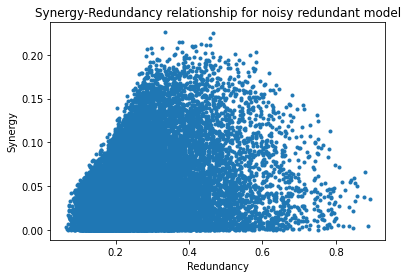

In [25]:
plt.figure()
plt.plot(rezRedLst, rezSynLst, '.')
plt.xlabel('Redundancy')
plt.ylabel('Synergy')
plt.title('Synergy-Redundancy relationship for noisy redundant model')
plt.show()